# Morphen: Image Sersic-Fitting decomposition
Author: Geferson Lucatelli <br>
email: geferson.lucatelli@postgrad.manchester.ac.uk <br>
email2: gefersonlucatelli@gmail.com<br>
Code Version: 0.3 <br>
Codename: Pelicoto <br>

This notebook contains sets of tools to perform image fitting using Sersic functions. The core implementation is made via Jax/scipy and LMFIT.

This notebook is specifically focused to optical images. This notebook and functions is also integrated with other capabilities, such as astropy and CASA.

Development Warning: The fitting implementation for optical images is in an early testing stage. The code base is exactly the same as the one used for radio interferometric images, which is more stable. 

For optical images, we require a better evaluation of the background rms maps, source cleaning, finding, etc. 
This will be improved in the near future. 



## Table of Contents

1. [Introduction](#intro) <br>
2. [Source Extraction](#source_extr) <br>
3. [Image fitting with Scipy/LMFIT](#image-fit-lmfit) <br>

    1. [Image fitting with Scipy/LMFIT](#image-fit-lmfit)
    2. Image analysis (non-parametric)
    3. Plotting capabilities
    4. Signal processing

<a id='intro'></a>
```
 _            ___       _                 _            _   _             
/ |          |_ _|_ __ | |_ _ __ ___   __| |_   _  ___| |_(_) ___  _ __  
| |  _____    | || '_ \| __| '__/ _ \ / _` | | | |/ __| __| |/ _ \| '_ \ 
| | |_____|   | || | | | |_| | | (_) | (_| | |_| | (__| |_| | (_) | | | |
|_|          |___|_| |_|\__|_|  \___/ \__,_|\__,_|\___|\__|_|\___/|_| |_|

```

<!-- ## Introduction <a id='intro'></a> -->

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import casatasks
from casatasks import *
import casatools
# from casatools import *
from scipy.ndimage import rotate
# import analysisUtils as au
import matplotlib.pyplot as plt
import numpy as np
import astropy.io.fits as pf
from casatools import image as IA
import lmfit
import string
from matplotlib.gridspec import GridSpec
from matplotlib import gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib as mpl
import glob
from astropy.nddata import Cutout2D
from astropy.wcs import WCS
import os
from astropy.stats import mad_std
from scipy.ndimage import gaussian_filter
from astropy import visualization
from astropy.visualization import simple_norm
from astropy.convolution import Gaussian2DKernel
import scipy.special as sp
from matplotlib import rcParams,rc
# from libs import *
# from libs import Gradindex
# from libs import polarim
try:
    import casaviewer.imview as imview
except:
    pass

def reset_rc_params():
    import matplotlib as mpl
    from matplotlib import rcParams,rc
    mpl.rcParams.update({'font.size': 14, 
        'xtick.labelsize':16,
        'ytick.labelsize':16,
        'axes.labelsize' : 16,
        'xtick.major.width':1,
        'ytick.major.width':1,
        'axes.linewidth':1,
        'legend.fontsize':14,            
        })
    pass
reset_rc_params()
from jax import jit
from jax.numpy.fft import fft2, ifft2, fftshift
import jax.numpy as jnp

def reset_rc_params():
    mpl.rcParams.update({'font.size': 14, 
        'mathtext.fontset': 'stix',
        "text.usetex": False,
        "font.family": "sans-serif",
        "font.family": "sans",
        "font.serif": ["Exo 2"],
        "font.sans-serif": ["Exo 2"],
        'font.family': 'STIXGeneral', 
        'xtick.labelsize':16,
        'ytick.labelsize':16,
        'axes.labelsize' : 16,
        'xtick.major.width':1,
        'ytick.major.width':1,
        'axes.linewidth':1,
        'lines.linewidth':2,
        'legend.fontsize':14,
        "grid.linestyle":'--',                
        })
    pass
reset_rc_params()
def reload_libs():    
    import libs
    import fitEllipse
#     from libs import *
    import importlib
    importlib.reload(libs)
    importlib.reload(fitEllipse)
    
# import warnings
# warnings.filterwarnings('ignore', category=DeprecationWarning)

import warnings
from astropy.utils.exceptions import AstropyDeprecationWarning

warnings.filterwarnings('ignore', category=AstropyDeprecationWarning)

In [2]:

# reset_rc_params()
import sys
# sys.path.append('../../scripts/analysis_scripts/')
sys.path.append('../analysis_scripts/')
# sys.path.append('/opt/casa-6.5.1-23-py3.8/')
# sys.path.append('../../phd_lucatelli_work/analysis/')
sys.path.append('../libs/')
sys.path.append('../')
import morphen as mp

import analysisUtils as au
from analysisUtils import *
import libs as mlibs



                                                          ..___|**_
                                                  .|||||||||*+@+*__*++.
                                              _||||.           .*+;].,#_
                                         _|||*_                _    .@@@#@.
                                   _|||||_               .@##@#| _||_
   Radio Morphen              |****_                   .@.,/\..@_.
                             #///#+++*|    .       .@@@;#.,.\@.
                              .||__|**|||||*||*+@#];_.  ;,;_
 Geferson Lucatelli                            +\*_.__|**#
                                              |..      .]]
                                               ;@       @.*.
                                                #|       _;]];|.
                                                 ]_          _+;]@.
                                                 _/_             |]\|    .  _
                                              ...._@* __ .

# 2 - Reading the Data: IMAGE 2D and PSF 2D

In [3]:
# root_path  = '/run/media/sagauga/storage_wd_2/cloud/pcloud/PhD/'
# root_path  = '../../../'
root_path  = '/home/lucatell/pCloudDrive/astronomical_data/efigi/S0/'
psf_root_path = './'
# root_path  = '/run/media/sagauga/ssd_3/cloud/pcloud-arch/PhD/GitHub/morphen/modeling/'
# root_path  = '/run/media/sagauga/data_astro/cloud/pcloud-arch/PhD/GitHub/morphen/examples/'
# root_path  = '/Volumes/astronomical_data/cloud/pcloud_mac/PhD/'

In [4]:
# crop_image = 'showcase_MG_PGC0001309_r_seg.fits'
# imagename = 'showcase_S0_PGC0059086_r_seg.fits'
imagename = 'S03_PGC0069914_r_seg.fits'
# imagename = root_path + 'PGC0035001_r.fits'
# imagename = root_path + 'PGC0008522_r.fits'
# psf_name = psf_root_path + 'psf_efigi_s13.fits'
psf_name = 'psf_efigi_s13.fits'
# psf_name = 'psf_PGC.fits'
# crop_image = root_path + 'bulge_n4_Rn20_In0.05_disk_n1_Rn60_In.1.fits'
# crop_image = root_path + 'PGC0043495_r.fits'
# crop_image = root_path + 'PGC0047709_r_seg.fits'

In [5]:
input_data=mp.read_data(filename=imagename,
                        psfname=psf_name)

Image File: S03_PGC0069914_r_seg.fits
PSF File: psf_efigi_s13.fits


We can plot these images. I am going to use the help function called `eimshow`.

<Axes: xlabel='Offset [px]'>

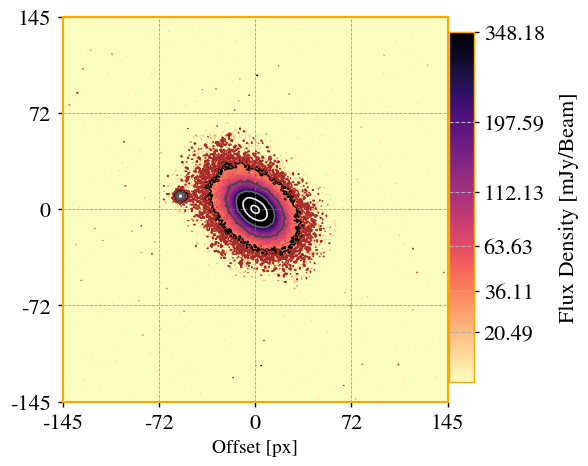

In [6]:
mlibs.eimshow(input_data.filename,crop=False,
              vmax_factor=0.1,
              with_wcs=True,
              vmin_factor=2,
              box_size=120,
              projection='px')

<Axes: xlabel='Offset [px]'>

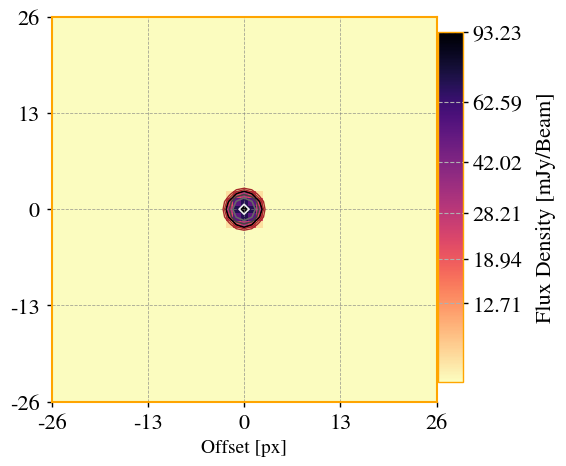

In [7]:
mlibs.eimshow(input_data.psfname,crop=False,
              vmax_factor=0.99,
              with_wcs=True,
              vmin_factor=2,
              box_size=120,
              projection='px')

<a id='source_extr'></a>

```
 ____             ____                             _____      _                  _   _             
|___ \           / ___|  ___  _   _ _ __ ___ ___  | ____|_  _| |_ _ __ __ _  ___| |_(_) ___  _ __  
  __) |  _____   \___ \ / _ \| | | | '__/ __/ _ \ |  _| \ \/ / __| '__/ _` |/ __| __| |/ _ \| '_ \ 
 / __/  |_____|   ___) | (_) | |_| | | | (_|  __/ | |___ >  <| |_| | | (_| | (__| |_| | (_) | | | |
|_____|          |____/ \___/ \__,_|_|  \___\___| |_____/_/\_\\__|_|  \__,_|\___|\__|_|\___/|_| |_|

````

In order to implement a better way for image fitting onto simple or complex radio sources, it is a good idea to first analyse the images in order to check the background noise emission and perform a simple segmentation and component extraction from the radio emission.

For that, we use here the SEP python package. A help function using it was created and placed in the ```libs.py``` file:

In [8]:
bwf, bhf = 1, 1 # standard value that works for a wide range of images. But, additional check is required!!!!
fwf, fhf = 1, 1 # standard value that works for a wide range of images. But, additional check is required!!!!
clean_param = 0.5
deblend_cont = 1e-5
deblend_nthresh = 50
sigma = 20
# ell_size_factor = 2.5
ell_size_factor = 7.0

Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
INFO: Total number of Sources/Structures (deblended) =  2


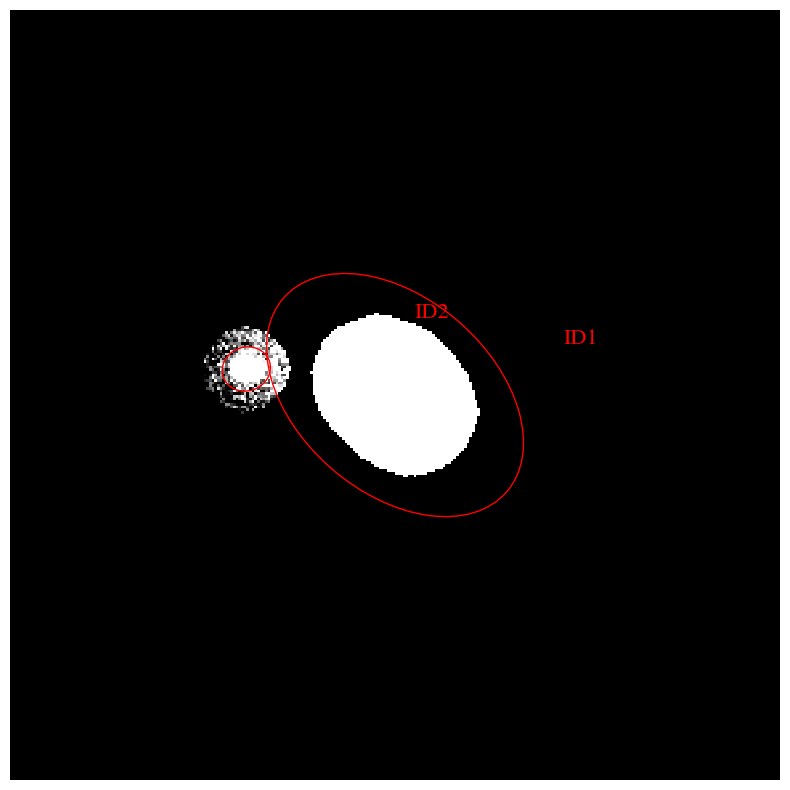

In [9]:
SE = mp.source_extraction(input_data, 
                          ell_size_factor = ell_size_factor, sigma = sigma,
                          bwf = bwf,bhf = bhf,fwf = fwf, fhf = fhf,
                          clean_param = clean_param, 
                          deblend_cont = deblend_cont, 
                          deblend_nthresh=deblend_nthresh,minarea_factor=1.0,
                          apply_mask=True,sigma_mask=25,
                          show_petro_plots=True,
                          dry_run=True, obs_type = 'other')
# plt.imshow(input_data.image_data_2D)

In [10]:
SE.objects['xc'],SE.objects['yc']

(array([144,  88]), array([144, 154]))

Input image is not a fits file.
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
INFO: Total number of Sources/Structures (deblended) =  2


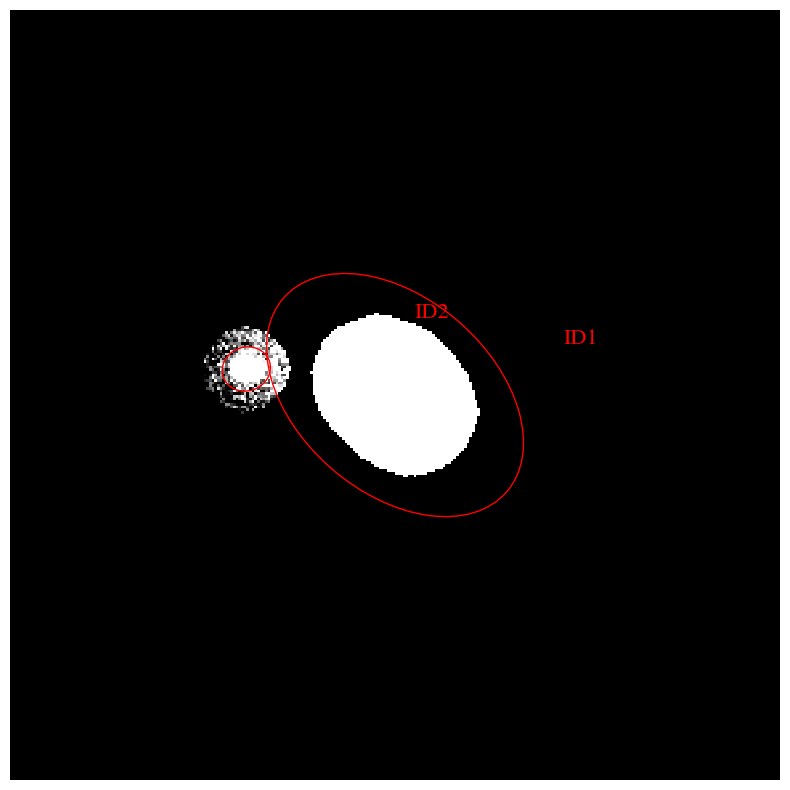

1


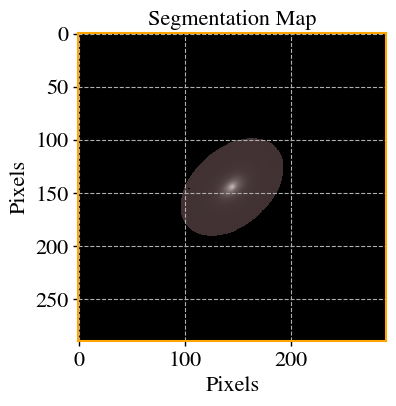

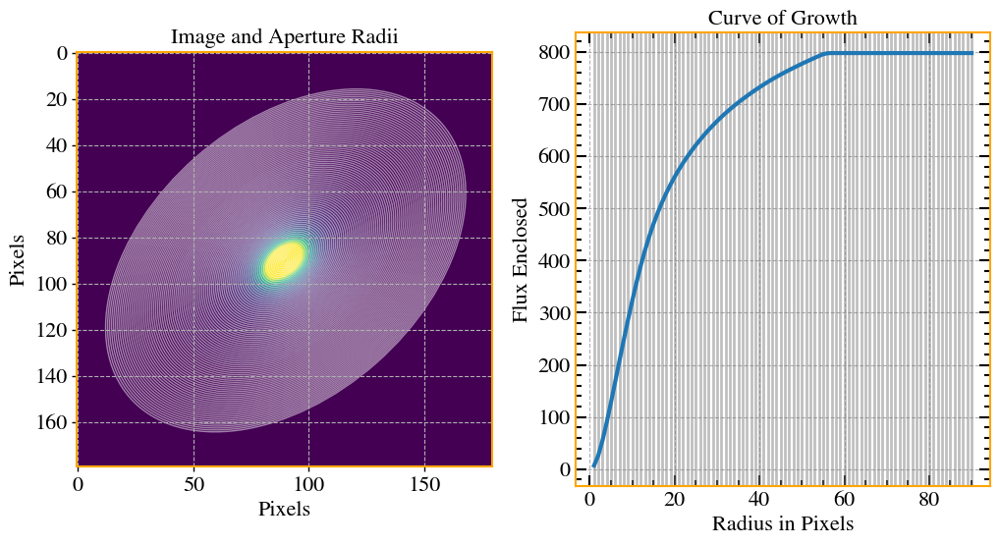

1


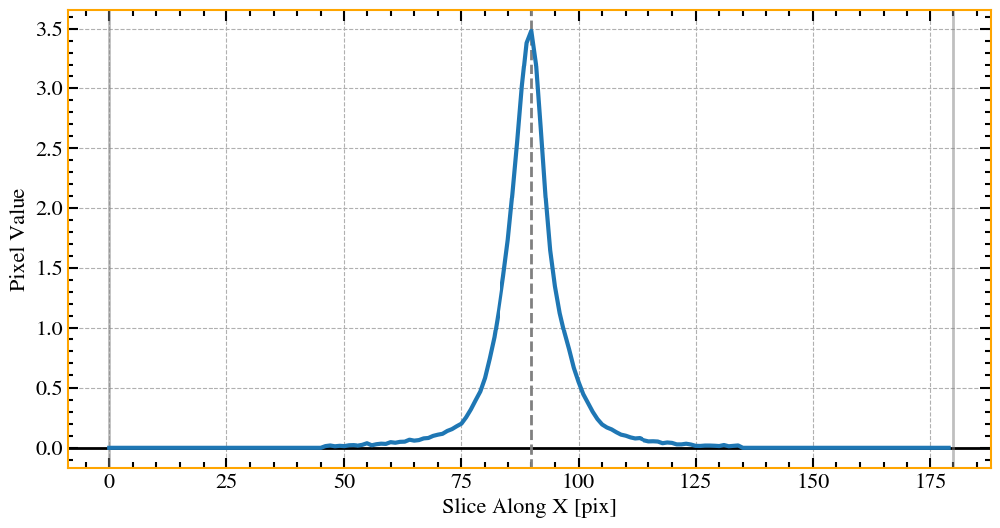

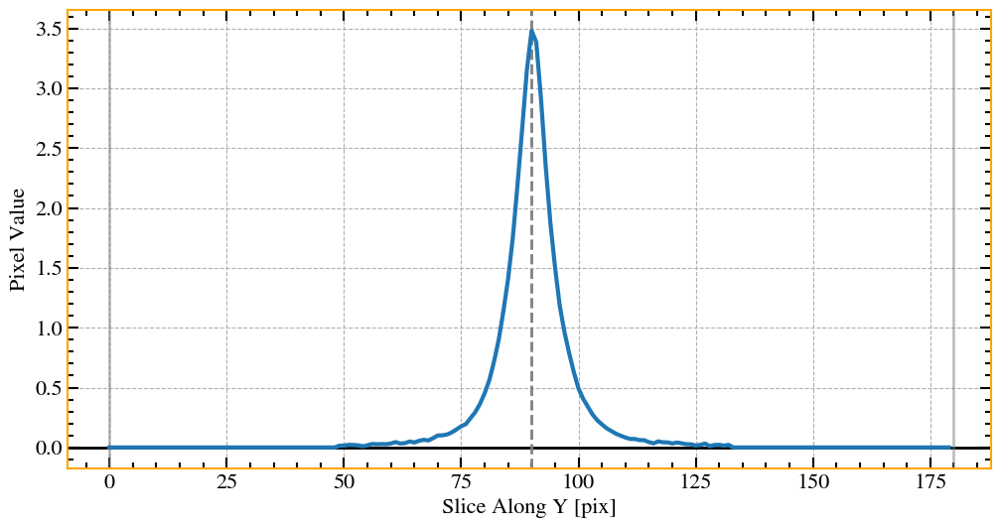

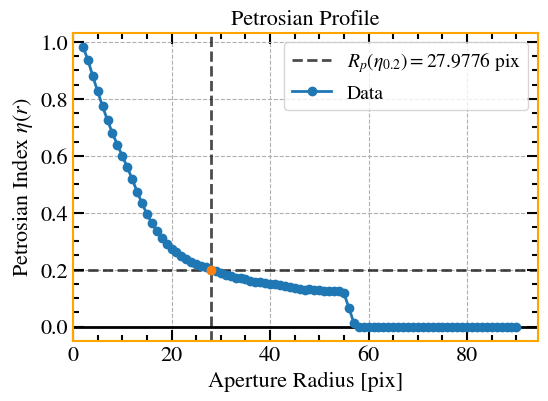

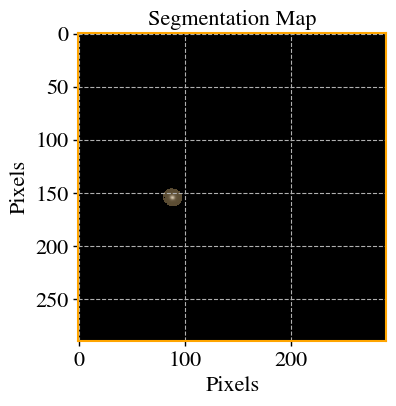

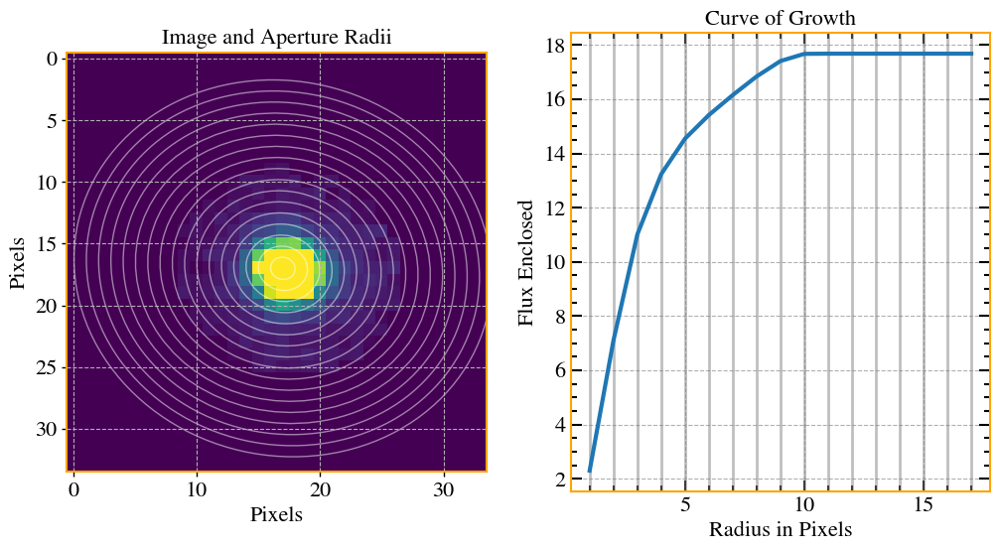

# of structures (IDs) to be fitted = 2
# of model components (COMPS) to be fitted = 3


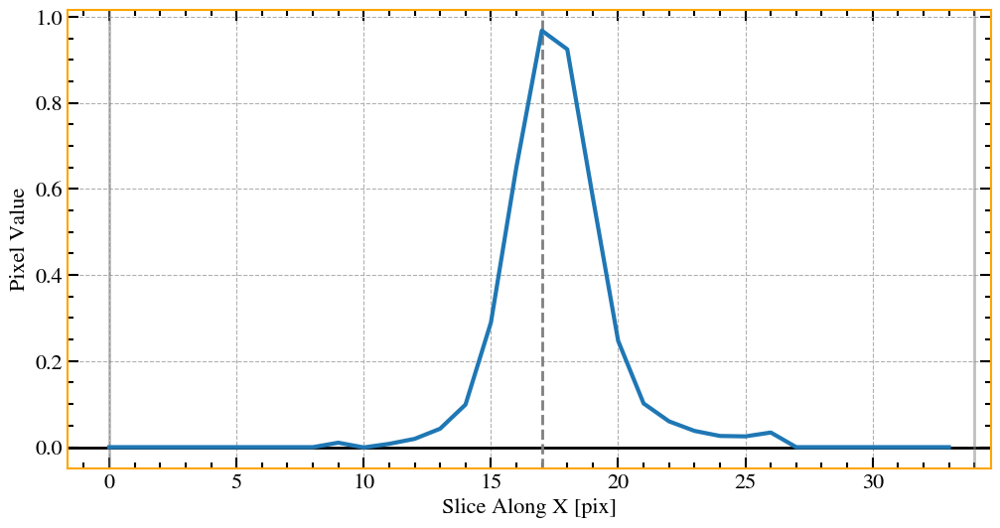

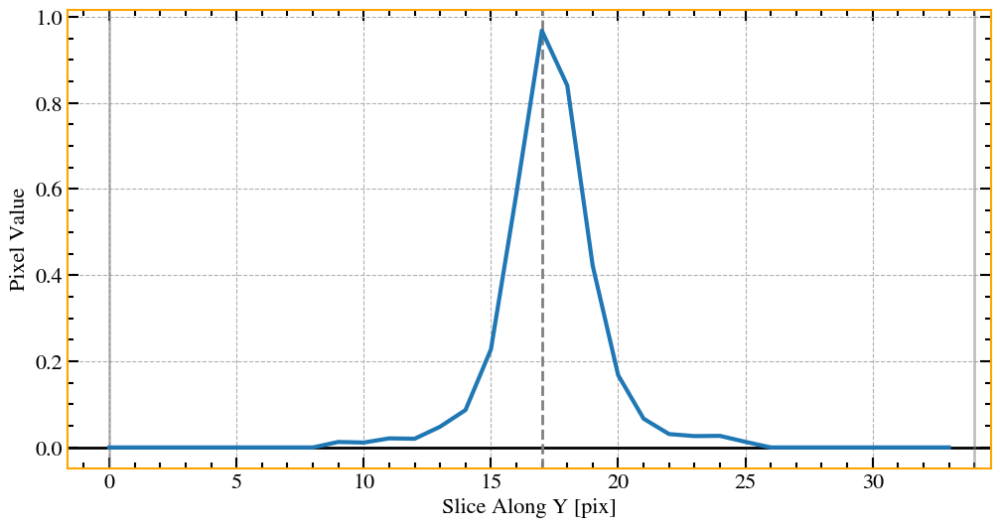

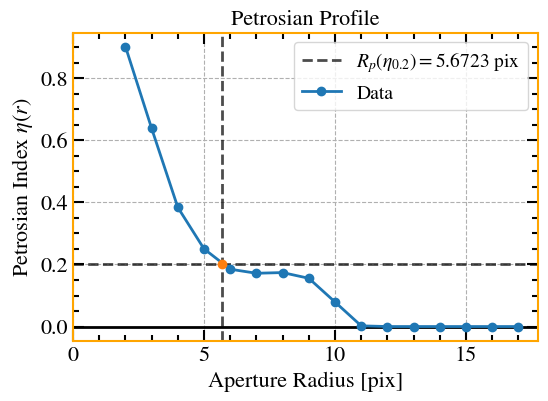

In [11]:
SE = mp.source_extraction(input_data, ids_to_add=[1],
                          ell_size_factor = ell_size_factor, sigma = sigma,
                          bwf=bwf, bhf=bhf, fwf=fwf, fhf=fhf,
                          clean_param=clean_param, 
                          deblend_cont=deblend_cont, minarea_factor=1.0,
                          deblend_nthresh=deblend_nthresh,
                          apply_mask=True,sigma_mask=25,
                          show_petro_plots=True,obs_type = 'other',
                          dry_run=False)

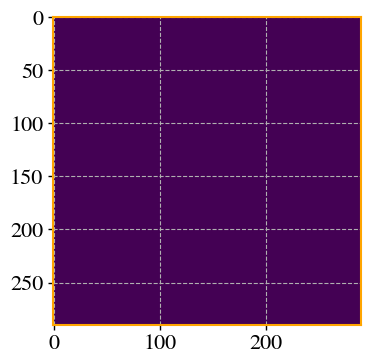

In [12]:
plt.imshow(SE.bkg)

In [13]:
SE.sources_photometries

{'c1_PA': -41.441352512722375,
 'c1_q': 0.6589736699204242,
 'c1_area': 6388.0,
 'c1_Re': 45.09283261164744,
 'c1_x0c': 144.35782238930312,
 'c1_y0c': 144.57555307232147,
 'c1_label': 1,
 'c1_R50': 12.412082416483296,
 'c1_R20': 5.824764952990598,
 'c1_R80': 27.33146629325865,
 'c1_C1': 0.6713845266361498,
 'c1_Snu': 797.1996351520625,
 'c1_Rp': 27.977595519103822,
 'c1_Rpidx': 55,
 'c1_rlast': 90,
 'c1_I50': 0.36846491415053606,
 'c2_PA': 12.784048151545688,
 'c2_q': 0.8923508261429937,
 'c2_area': 235.0,
 'c2_Re': 8.6488625410045,
 'c2_x0c': 88.63074135353611,
 'c2_y0c': 154.35498237985274,
 'c2_label': 1,
 'c2_R50': 2.4210842168433686,
 'c2_R20': 1.2624524904980996,
 'c2_R80': 4.760752150430086,
 'c2_C1': 0.5764605288310645,
 'c2_Snu': 17.6790876582801,
 'c2_Rp': 5.672334466893378,
 'c2_Rpidx': 11,
 'c2_rlast': 17,
 'c2_I50': 0.2931672274135053,
 'ncomps': 3,
 'c3_PA': -41.441352512722375,
 'c3_q': 0.6589736699204242,
 'c3_area': 6388.0,
 'c3_Re': 45.09283261164744,
 'c3_x0c': 144.3

In [14]:
input_data.rms_res

## We have now basic properties of each component of our radio emission:
- `x0 `  : x-coordinate centre position
- `y0 `  : y-coordinate centre position
- `q  `  : axis ratio
- `PA `  : position angle
- `Snu`  : total flux (sum of pixels)
- `Re `  : effective circular area radii 
- `Rp `  : Petrosian Radius
- `R50 ` : half-light radius
- `I50 ` : effective intensity (I at R50)

These parameters will be used to feed the initial hints for the Sersic Decomposition

```
 _____             ____                _          ____                                           _ _   _             
|___ /            / ___|  ___ _ __ ___(_) ___    |  _ \  ___  ___ ___  _ __ ___  _ __   ___  ___(_) |_(_) ___  _ __  
  |_ \    _____   \___ \ / _ \ '__/ __| |/ __|   | | | |/ _ \/ __/ _ \| '_ ` _ \| '_ \ / _ \/ __| | __| |/ _ \| '_ \ 
 ___) |  |_____|   ___) |  __/ |  \__ \ | (__    | |_| |  __/ (_| (_) | | | | | | |_) | (_) \__ \ | |_| | (_) | | | |
|____/            |____/ \___|_|  |___/_|\___|   |____/ \___|\___\___/|_| |_| |_| .__/ \___/|___/_|\__|_|\___/|_| |_|
                                                                                |_|                                  


```

# Using LMFIT Multi Purpose Sersic Decomposition <a id='image-fit-lmfit'></a>

## 2D Multi-Component Sersic Fitting Using Scipy+LMFIT

## This implementation is not easy and quite complex, but the function do_fit2D deals with everything if initial parameters are provided

In [15]:
reload_libs()


                                                          ..___|**_
                                                  .|||||||||*+@+*__*++.
                                              _||||.           .*+;].,#_
                                         _|||*_                _    .@@@#@.
                                   _|||||_               .@##@#| _||_
   Radio Morphen              |****_                   .@.,/\..@_.
                             #///#+++*|    .       .@@@;#.,.\@.
                              .||__|**|||||*||*+@#];_.  ;,;_
 Geferson Lucatelli                            +\*_.__|**#
                                              |..      .]]
                                               ;@       @.*.
                                                #|       _;]];|.
                                                 ]_          _+;]@.
                                                 _/_             |]\|    .  _
                                              ...._@* __ .

In [16]:
from astropy.stats import SigmaClip
from photutils.background import Background2D, MedianBackground
sigma_clip = SigmaClip(sigma=3.0)
bkg_estimator = MedianBackground()
bkg = Background2D(input_data.image_data_2D, 
                   (int(input_data.image_data_2D.shape[0]/10), int(input_data.image_data_2D.shape[0]/10)), 
                   filter_size=(3, 3),
                   sigma_clip=sigma_clip, bkg_estimator=bkg_estimator)

In [17]:
print(bkg.background_median)  

print(bkg.background_rms_median)  

0.001115747436415404
0.005896502066170994


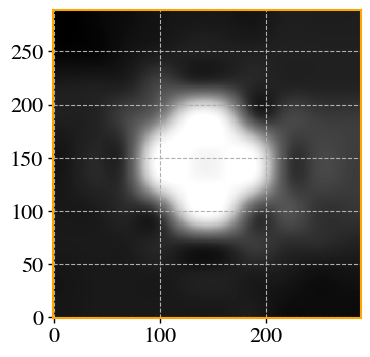

In [18]:
plt.imshow(bkg.background, origin='lower', cmap='Greys_r',
           interpolation='nearest')

[]

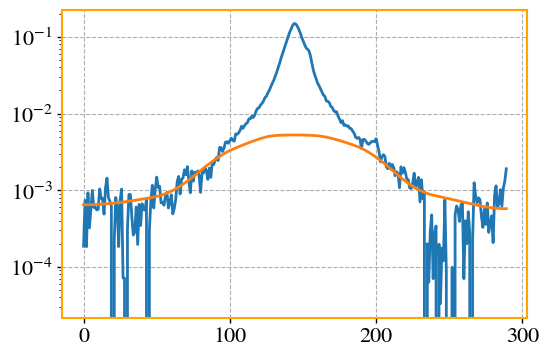

In [19]:
plt.plot(np.mean(input_data.image_data_2D,axis=1))
plt.plot(np.mean(bkg.background,axis=1))
plt.semilogy()

In [20]:
from photutils.segmentation import detect_threshold
from photutils.segmentation import detect_sources
from photutils.background import Background2D
from photutils.background import MedianBackground

In [21]:
threshold = detect_threshold(input_data.image_data_2D, nsigma=3)
segm = detect_sources(input_data.image_data_2D, threshold, npixels=50)

In [22]:
background_mask = segm.data == 0  # This assumes source labels start from 1
background_data = np.where(background_mask, input_data.image_data_2D, np.nan)

In [23]:
bkg_estimator = MedianBackground()
background = Background2D(background_data, (31, 31), 
                          filter_size=(1, 1), 
                          # window_size=(100, 100), 
                          bkg_estimator=bkg_estimator)
background_image = background.background

background2 = Background2D(background_data, (31, 31), 
                          filter_size=(3, 3), 
                          # window_size=(100, 100), 
                          bkg_estimator=bkg_estimator)
background_image2 = background2.background

[]

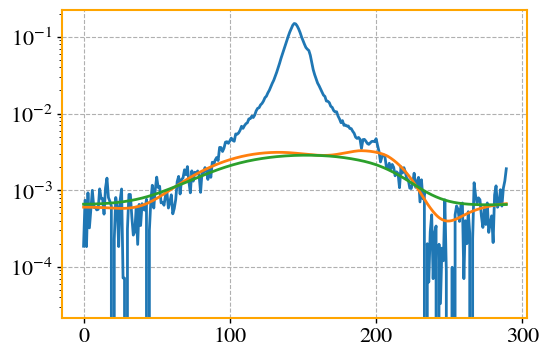

In [24]:
plt.plot(np.mean(input_data.image_data_2D,axis=1))
plt.plot(np.mean(background_image,axis=1))
plt.plot(np.mean(background_image2,axis=1))
plt.semilogy()

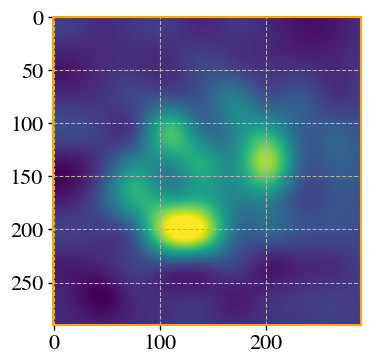

In [25]:
plt.imshow(background_image)

2023-10-18 04:53:27.787022: I external/xla/xla/pjrt/tfrt_cpu_pjrt_client.cc:458] TfrtCpuClient created.
2023-10-18 04:53:27.923250: I external/xla/xla/stream_executor/cuda/cuda_gpu_executor.cc:910] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-10-18 04:53:27.923703: I external/xla/xla/service/service.cc:168] XLA service 0x55c2259d6400 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-10-18 04:53:27.923728: I external/xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 2070, Compute Capability 7.5
2023-10-18 04:53:27.924095: I external/xla/xla/pjrt/gpu/se_gpu_pjrt_client.cc:627] Using BFC allocator.
2023-10-18 04:53:27.924128: I external/xla/xla/pjrt/gpu/gpu_helpers.cc:108] XLA backend will use up to 1003392860 bytes on de

Limiting  x0
Limiting  y0
Using general elliptical geometry during fitting... may take longer.
Limiting  x0
Limiting  y0
Using general elliptical geometry during fitting... may take longer.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 2  to 0.5.
Using general elliptical geometry during fitting... may take longer.
{'f1_x0': {'value': 144.35782238930312, 'min': 134.35782238930312, 'max': 154.35782238930312}, 'f1_y0': {'value': 144.57555307232147, 'min': 134.57555307232147, 'max': 154.57555307232147}, 'f1_PA': {'value': -41.441352512722375, 'min': -131.44135251272237, 'max': 48.558647487277625}, 'f1_ell': {'value': 0.34102633007957583, 'min': 0.06820526601591517, 'max': 0.75}, 'f1_n': {'value': 0.5, 'min': 0.2, 'max': 8.0}, 'f1_In': {'value': 0.36846491415053606, 'min': 0.0036846491415053607, 'max': 36.846491415053606}, 'f1_Rn': {'value': 12.412082416483296, 'min': 0.6206041208241648, 'max': 18.618123624724944}, 'f1_cg': {'value': 0.0, 'min': -2.0, 'max': 2.0}, 'f2_x0': {'va

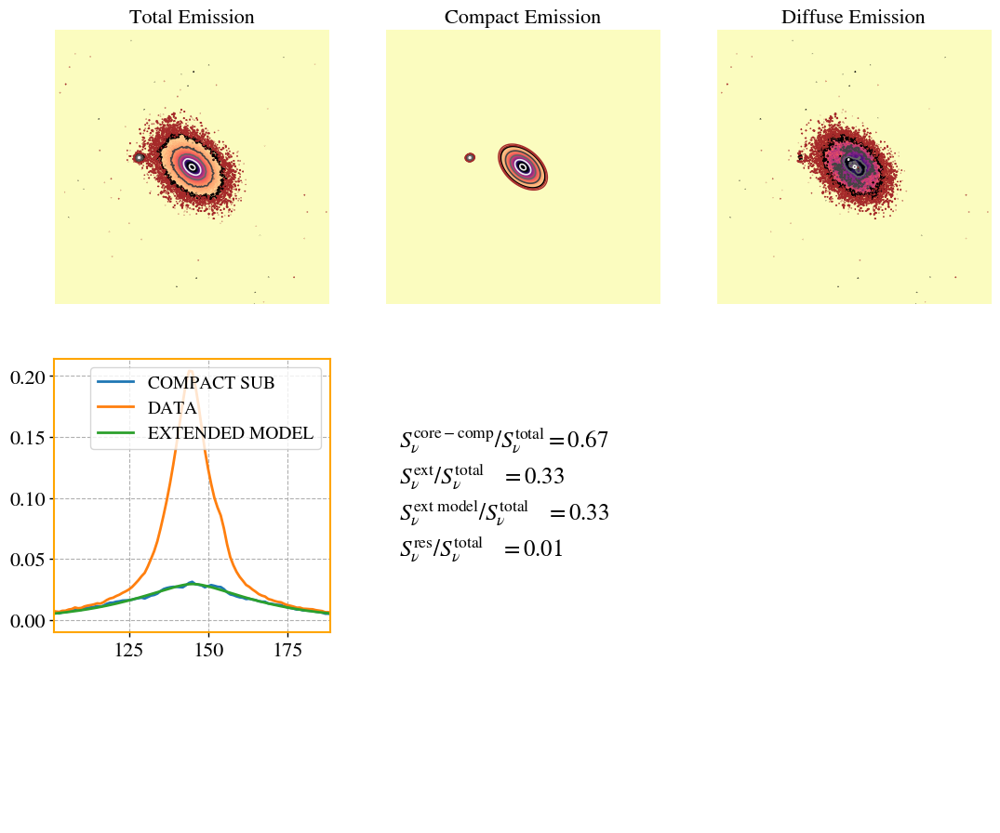

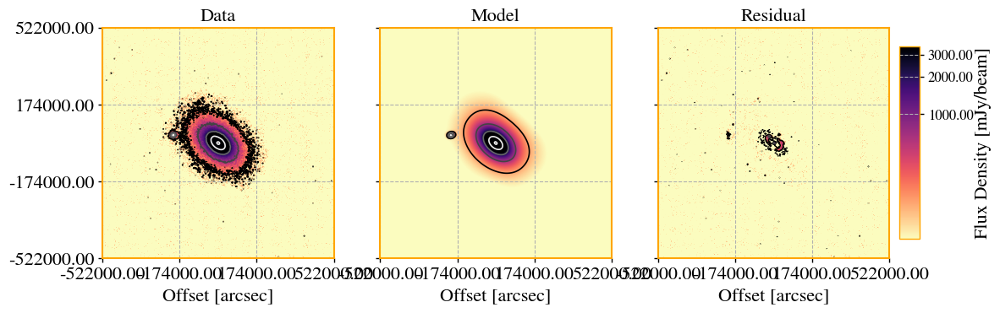

/home/sagauga/pCloudDrive/PhD/GitHub/morphen/image_decomposition/../libs/libs.py:9260: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(1e-7, -0.05 * np.log(ir[0]))


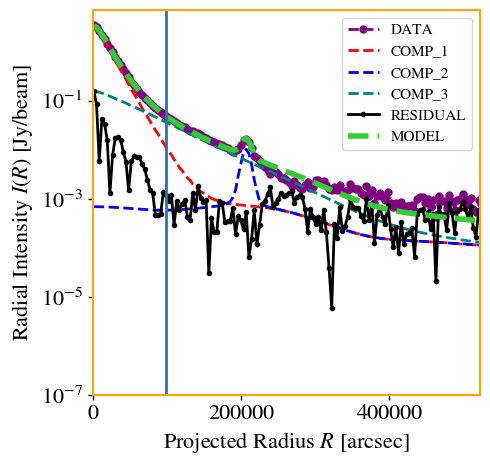

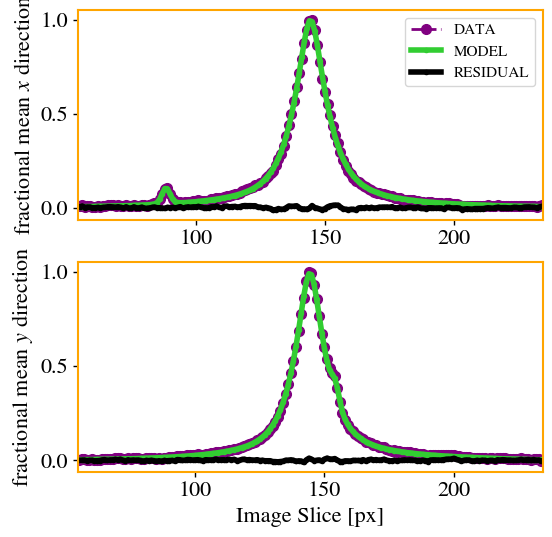

In [26]:
smfr = mp.sersic_multifit_general(input_data,
                                SE, #source extraction object, from previous step
                                convolution_mode='GPU',self_bkg=True,
                                # bkg_rms_map=bkg.background,
                                bkg_rms_map=background_image,
                                fix_geometry=False, #for stability purposes, keep True for now. 
                                comp_ids=['1','2'],# which component label is compact?
                                dr_fix=[15,15,15,15,25,25],#for each component, radial element size to fix (x0,y0) positions
                                fix_value_n=[1.0,1.0,1.0,1.0,1.0,1.0,1.0],#for each component, the Sersic index value to be fixed. 
                                fix_n=[False,False,True,False,True,False],#for each component, fix or not the Sersic index. 
                                z = 0.1)

In [78]:
smfr.result_mini.params

name,value,standard error,relative error,initial value,min,max,vary
f1_x0,144.138902,0.00284711,(0.00%),144.13867911466937,134.357822,154.357822,True
f1_y0,144.124984,0.00330376,(0.00%),144.1247611407905,134.575553,154.575553,True
f1_PA,-40.8870856,0.04308049,(0.11%),-40.88767393141655,-131.441353,48.5586475,True
f1_ell,0.38666338,6.4502e-04,(0.17%),0.38671600577615295,0.06820527,0.75000000,True
f1_n,0.99106270,0.00384924,(0.39%),0.9914855499843716,0.20000000,8.00000000,True
f1_In,0.90631493,0.00532323,(0.59%),0.9052318404751307,0.00368465,36.8464914,True
f1_Rn,8.75010899,0.08534868,(0.98%),8.76315465708393,0.62060412,18.6181236,True
f1_cg,-0.02547917,0.00545788,(21.42%),-0.024381682040232285,-2.00000000,2.00000000,True
f2_x0,88.2615075,0.00895643,(0.01%),88.26079265765787,78.6307414,98.6307414,True
f2_y0,154.153072,0.00603982,(0.00%),154.15372299506836,144.354982,164.354982,True


In [ ]:
smfr.result_mini.params

## Background Estimation

In [17]:
from astropy.modeling import models, fitting

In [18]:
input_data.image_data_2D

array([[-0.0044791 ,  0.00069494,  0.01683214, ...,  0.00110472,
        -0.00982237,  0.00398465],
       [ 0.01244393,  0.00685512, -0.00218993, ..., -0.01180813,
         0.00551906,  0.0077268 ],
       [ 0.01348768, -0.00347926, -0.00796886, ...,  0.00101535,
         0.00022657,  0.0053686 ],
       ...,
       [-0.01353831, -0.00265519, -0.00131119, ...,  0.0043903 ,
         0.01174719,  0.00354006],
       [-0.00938827, -0.00493099, -0.00094592, ...,  0.00621128,
         0.01136714,  0.00224131],
       [ 0.00444228,  0.01917369,  0.00785195, ..., -0.00624611,
        -0.0007997 ,  0.00935478]])

In [20]:
initial_background = np.median(input_data.image_data_2D)

In [22]:
background_subtracted_image = input_data.image_data_2D - initial_background


In [25]:
# Determine the shape of the image
height, width = input_data.image_data_2D.shape

# Create arrays of pixel coordinates using meshgrid
x, y = np.meshgrid(np.arange(width), np.arange(height))

In [26]:
# Define a model for a 2D polynomial (you can adjust the degree)
model = models.Polynomial2D(degree=3)

# Initialize a fitter and perform the fit
fitter = fitting.LevMarLSQFitter()
background_model = fitter(model, x, y, background_subtracted_image)

In [27]:
# Define a model for a 2D polynomial (you can adjust the degree)
model = models.Polynomial2D(degree=3)

# Initialize a fitter and perform the fit
fitter = fitting.LevMarLSQFitter()
background_model = fitter(model, x, y, background_subtracted_image)

# Evaluate the background model at each pixel position
background_estimation = background_model(x, y)

In [29]:
refined_image = input_data.image_data_2D - background_estimation

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


<Axes: xlabel='Offset [px]'>

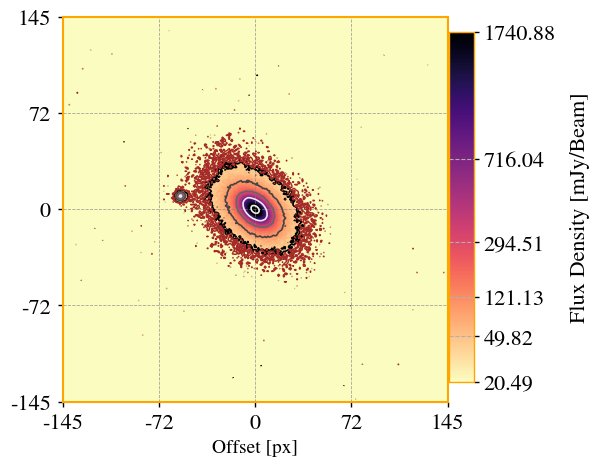

In [31]:
mlibs.eimshow(input_data.image_data_2D)

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


<Axes: xlabel='Offset [px]'>

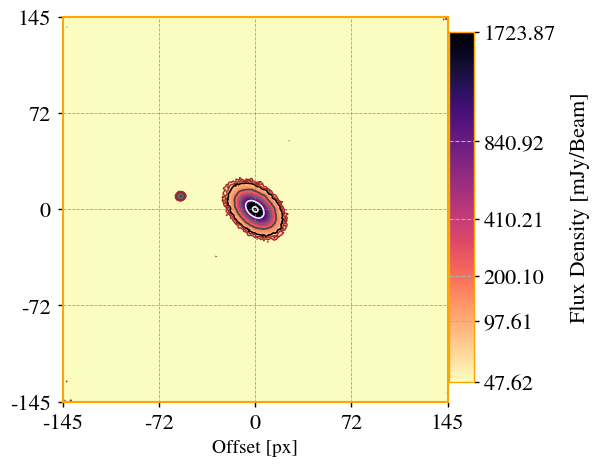

In [30]:
mlibs.eimshow(refined_image)

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


<Axes: xlabel='Offset [px]'>

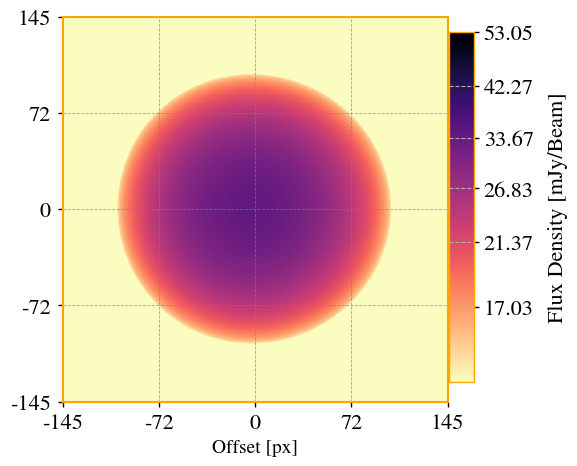

In [32]:
mlibs.eimshow(background_estimation)

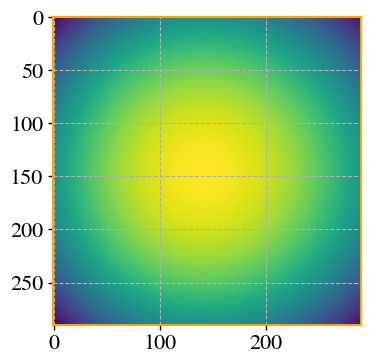

In [33]:
plt.imshow(background_estimation)

In [34]:
from astropy.stats import sigma_clipped_stats

In [42]:
from photutils.background import Background2D, MedianBackground

In [43]:
bkg_estimator = MedianBackground()

In [50]:
background = Background2D(input_data.image_data_2D, (15, 15), filter_size=(3, 3), bkg_estimator=bkg_estimator)

In [51]:
background_image = background.background

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


<Axes: xlabel='Offset [px]'>

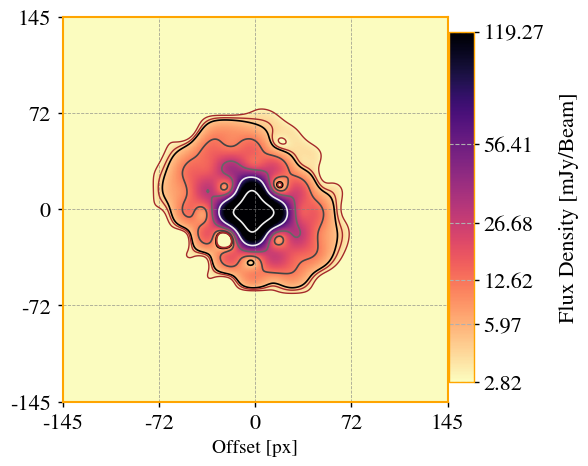

In [52]:
mlibs.eimshow(background_image)

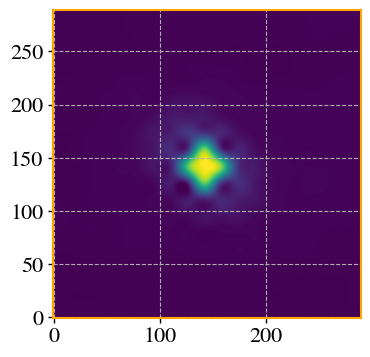

In [53]:
plt.imshow(background_image,origin='lower')

In [ ]:
import scipy.ndimage as ndi

def local_std_dev(image, size):
    return np.std(image)

local_std = ndi.generic_filter(input_data.image_data_2D, local_std_dev, size=your_filter_size)

In [54]:
from scipy.ndimage import generic_filter, label, minimum_filter

In [66]:
local_minima = minimum_filter(input_data.image_data_2D, size=input_data.image_data_2D.shape[0]/10)

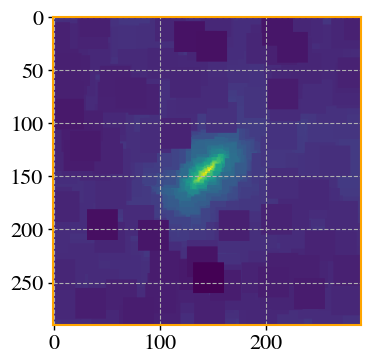

In [67]:
plt.imshow(local_minima)

In [87]:
threshold = 50 * mlibs.mad_std(input_data.image_data_2D)   # You'll need to determine this threshold
background_regions = local_minima < threshold

In [88]:
background_regions

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [89]:
labeled_regions, num_regions = label(background_regions)

In [90]:
num_regions

1

In [79]:
filter_sizes = [51 + region_size for region_size in range(1, num_regions + 1)]
window_sizes = [100 * region_size for region_size in range(1, num_regions + 1)]

In [80]:
filter_sizes

[52]

In [81]:
window_sizes

[100]

In [91]:
from astropy.stats import SigmaClip
from photutils.background import ModeEstimatorBackground
data = input_data.image_data_2D
sigma_clip = SigmaClip(sigma=3.0)
bkg = ModeEstimatorBackground(median_factor=3.0, mean_factor=2.0,
                              sigma_clip=sigma_clip)


In [92]:
bkg_value = bkg.calc_background(data)
print(bkg_value)  

0.0013016665350908223


In [93]:
bkg??

Signature:   bkg(data, axis=None, masked=False)
Type:        ModeEstimatorBackground
String form: <ModeEstimatorBackground(sigma_clip=SigmaClip(sigma=3.0, sigma_lower=3.0, sigma_upper=3.0, maxiters=5, cenfunc='median', stdfunc='std', grow=False))>
File:        ~/miniconda3/envs/morphen38/lib/python3.8/site-packages/photutils/background/core.py
Source:     
class ModeEstimatorBackground(BackgroundBase):
    """
    Class to calculate the background in an array using a mode estimator
    of the form ``(median_factor * median) - (mean_factor * mean)``.

    Parameters
    ----------
    median_factor : float, optional
        The multiplicative factor for the data median.  Defaults to 3.
    mean_factor : float, optional
        The multiplicative factor for the data mean.  Defaults to 2.
    sigma_clip : `astropy.stats.SigmaClip` object, optional
        A `~astropy.stats.SigmaClip` object that defines the sigma
        clipping parameters.  If `None` then no sigma clipping will be
     

In [94]:
from astropy.stats import SigmaClip
from photutils.background import Background2D, MedianBackground
sigma_clip = SigmaClip(sigma=3.0)
bkg_estimator = MedianBackground()
bkg = Background2D(data, (50, 50), filter_size=(3, 3),
                   sigma_clip=sigma_clip, bkg_estimator=bkg_estimator)

In [95]:
print(bkg.background_median)  

print(bkg.background_rms_median)  

0.0017868283189031802
0.005934835589998253


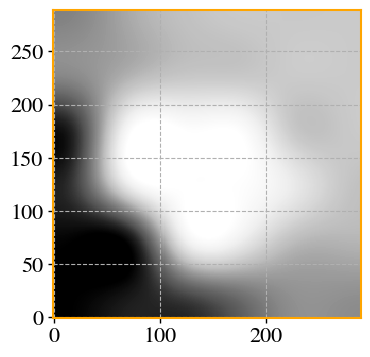

In [96]:
plt.imshow(bkg.background, origin='lower', cmap='Greys_r',
           interpolation='nearest')

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


<Axes: xlabel='Offset [px]'>

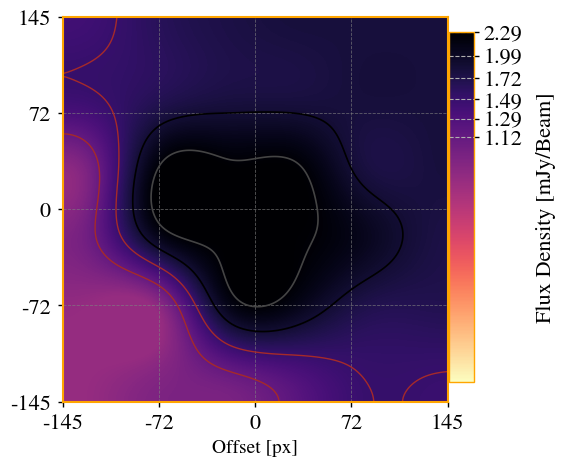

In [100]:
mlibs.eimshow(bkg.background,vmin_factor=0.0,vmax_factor=1.0)

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


<Axes: xlabel='Offset [px]'>

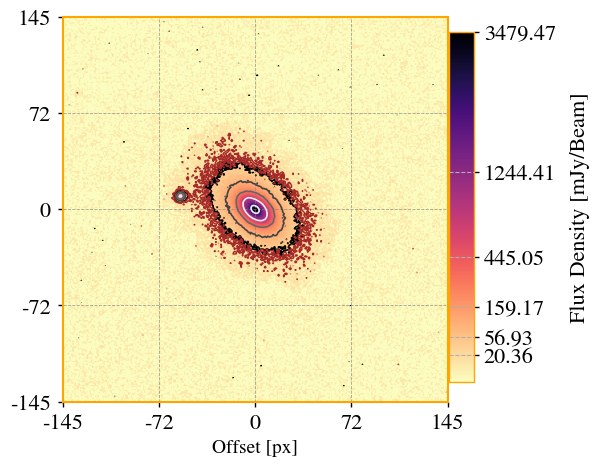

In [101]:
mlibs.eimshow(data - bkg.background,vmin_factor=0.0,vmax_factor=1.0)

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.


<Axes: xlabel='Offset [px]'>

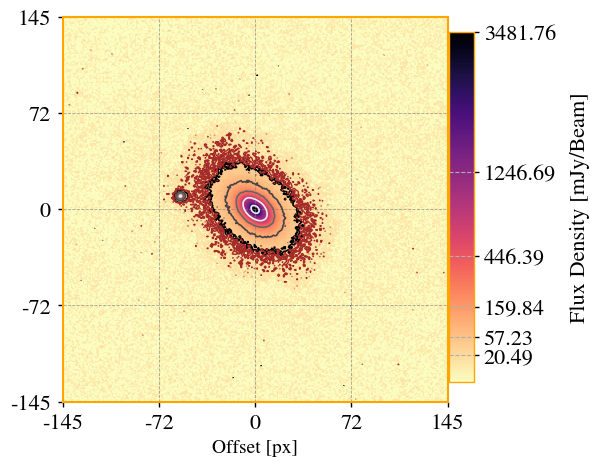

In [102]:
mlibs.eimshow(data - 0*bkg.background,vmin_factor=0.0,vmax_factor=1.0)

[]

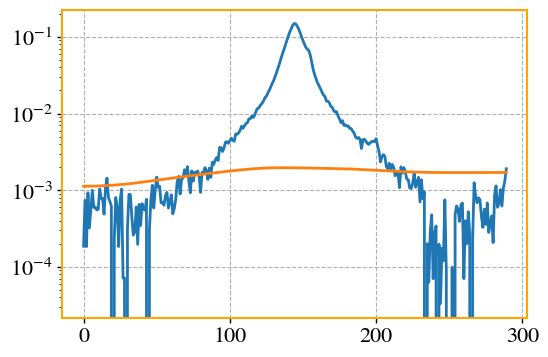

In [106]:
plt.plot(np.mean(data,axis=1))
plt.plot(np.mean(bkg.background,axis=1))
plt.semilogy()

In [88]:
from photutils.segmentation import detect_threshold
from photutils.segmentation import detect_sources
from photutils.background import Background2D
from photutils.background import MedianBackground

In [96]:
threshold = detect_threshold(input_data.image_data_2D, nsigma=3)
segm = detect_sources(input_data.image_data_2D, threshold, npixels=50)

In [98]:
background_mask = segm.data == 0  # This assumes source labels start from 1
background_data = np.where(background_mask, input_data.image_data_2D, np.nan)

In [125]:
bkg_estimator = MedianBackground()
background = Background2D(background_data, (31, 31), 
                          filter_size=(3, 3), 
                          # window_size=(100, 100), 
                          bkg_estimator=bkg_estimator)
background_image = background.background

[]

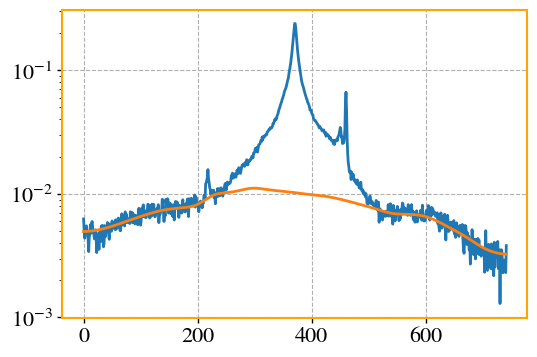

In [126]:
plt.plot(np.mean(input_data.image_data_2D,axis=1))
plt.plot(np.mean(background_image,axis=1))
plt.semilogy()

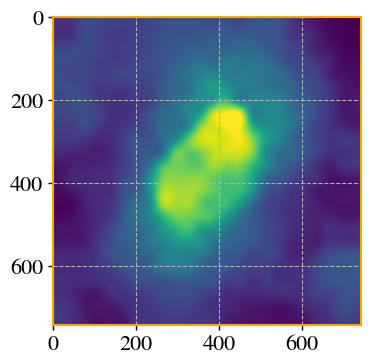

In [127]:
plt.imshow(background_image)

In [103]:
Background2D??

Init signature:
Background2D(
    data,
    box_size,
    *,
    mask=None,
    coverage_mask=None,
    fill_value=0.0,
    exclude_percentile=10.0,
    filter_size=(3, 3),
    filter_threshold=None,
    edge_method='pad',
    sigma_clip=SigmaClip(sigma=3.0, sigma_lower=3.0, sigma_upper=3.0, maxiters=10, cenfunc='median', stdfunc='std', grow=False),
    bkg_estimator=<SExtractorBackground(sigma_clip=None)>,
    bkgrms_estimator=<StdBackgroundRMS(sigma_clip=None)>,
    interpolator=<photutils.background.interpolators.BkgZoomInterpolator object at 0x7fc362714bb0>,
)
Source:        
class Background2D:
    """
    Class to estimate a 2D background and background RMS noise in an
    image.

    The background is estimated using (sigma-clipped) statistics in
    each box of a grid that covers the input ``data`` to create a
    low-resolution, and possibly irregularly-gridded, background map.

    The final background map is calculated by interpolating the
    low-resolution background map.


In [90]:
detect_threshold??

Signature:
detect_threshold(
    data,
    nsigma,
    *,
    background=None,
    error=None,
    mask=None,
    sigma_clip=SigmaClip(sigma=3.0, sigma_lower=3.0, sigma_upper=3.0, maxiters=10, cenfunc='median', stdfunc='std', grow=False),
)
Source:   
def detect_threshold(data, nsigma, *, background=None, error=None, mask=None,
                     sigma_clip=SigmaClip(sigma=3.0, maxiters=10)):
    """
    Calculate a pixel-wise threshold image that can be used to detect
    sources.

    This is a simple convenience function that uses sigma-clipped
    statistics to compute a scalar background and noise estimate. In
    general, one should perform more sophisticated estimates, e.g.,
    using `~photutils.background.Background2D`.

    Parameters
    ----------
    data : 2D `~numpy.ndarray`
        The 2D array of the image.

    nsigma : float
        The number of standard deviations per pixel above the
        ``background`` for which to consider a pixel as possibly being
        p

In [59]:
"""
Run the fitting again, now including the additional component. 
For this run, we keep the sersic indeces fixed to 0.5 and 1.0. 
"""
## We use 2 solver methods for better convergence. 
save_name_append=''
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, \
                    smodel2D, model_temp = mlibs.do_fit2D(imagename=crop_image,residualname=None,
                                                   init_constraints=sources_photometies_new,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new,
                                                   constrained=True,self_bkg=True,
                                                   rms_map = bkg_.back(),#rms_map=1*rms_map,
                                                   fix_n=[False,False,False,True,
                                                          False,False,False,False],
#                                                     mask_region=mask_component,
                                                   fix_value_n = [3.0,1.0,1.0,1.0,
                                                                  1.0,1.0,1.0,1.0],
                                                    fix_x0_y0=[True,True,True,True,
                                                               True,True,True,True],
                                                    dr_fix = [20,20,20,20,
                                                              20,20,20,20],
                                                   # n_to_fix = [0.5,None,1.0,None]
                                                   convolution_mode='GPU',fix_geometry=True,workers=36,
                                                   #do not fix the n of the extra component
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   init_params = 0.2,final_params = 5.0,loss='cauchy',tr_solver='exact',
                                                   regularize  = True, f_scale = 1.,ftol=1e-12, xtol=1e-12, gtol=1e-12,
                                                   save_name_append=save_name_append)



# special_name = '_'+str(n_components_new)+'C'+save_name_append
# plot_decomp_results(imagename=crop_image,
#                     compact=model_dict['model_c1_conv'] + model_dict['model_c2_conv'] + model_dict['model_c3_conv'] + model_dict['model_c4_conv'],
#                     extended_model=model_dict['model_c5_conv'],
#                     # compact=model_dict['model_total_conv'],
#                     # extended_model=model_dict['best_residual_conv'],
#                     special_name=special_name)
# plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new,
#                  crop=False,box_size=200,
#                  vmax_factor=0.3,vmin_factor=1.0)
# # plt.xlim(0,3)

# plot_slices(data_2D=ctn(crop_image),model_dict=model_dict,image_results_conv=image_results_conv[-2],Rp_props=sources_photometies_new,residual_2D=None)
# result_mini.params

Limiting  x0
Limiting  y0
Limiting  x0
Limiting  y0
Limiting  x0
Limiting  y0
Limiting  x0
Limiting  y0
{'f1_x0': {'value': 155.9736872031197, 'min': 135.9736872031197, 'max': 175.9736872031197}, 'f1_y0': {'value': 156.018965259117, 'min': 136.018965259117, 'max': 176.018965259117}, 'f1_PA': {'value': -66.49165189393507, 'min': -156.49165189393506, 'max': 23.50834810606493}, 'f1_ell': {'value': 0.41413472363879844, 'min': 0.0828269447277597, 'max': 0.75}, 'f1_n': {'value': 0.5, 'min': 0.3, 'max': 8.0}, 'f1_In': {'value': 0.4039604216814041, 'min': 0.04039604216814041, 'max': 40.39604216814041}, 'f1_Rn': {'value': 13.440888177635527, 'min': 0.13440888177635527, 'max': 26.881776355271054}, 'f1_cg': {'value': 0.0, 'min': -0.01, 'max': 0.01}, 'f2_x0': {'value': 224.7971594034847, 'min': 204.7971594034847, 'max': 244.7971594034847}, 'f2_y0': {'value': 276.0819725203771, 'min': 256.0819725203771, 'max': 296.0819725203771}, 'f2_PA': {'value': 34.993327800287524, 'min': -55.006672199712476, 'm

No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.
No cell or pixel size information in the image wcs/header. Setting cell/pixel size = 1.
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
Not able to determine cell size. Please, provide a cell size with the parameter `cell_size`.
Flux on compact (self rms) =  2618571.533203125
Flux on compact (data rms) =  2448103.515625
Flux on extended (self rms) =  416801.6080732718
Flux on extended (data rms) =  407396.5821119868
Flux on extended2 (data rms) =  555683.0396058809
Flux on extended model (d

Error adding beam.


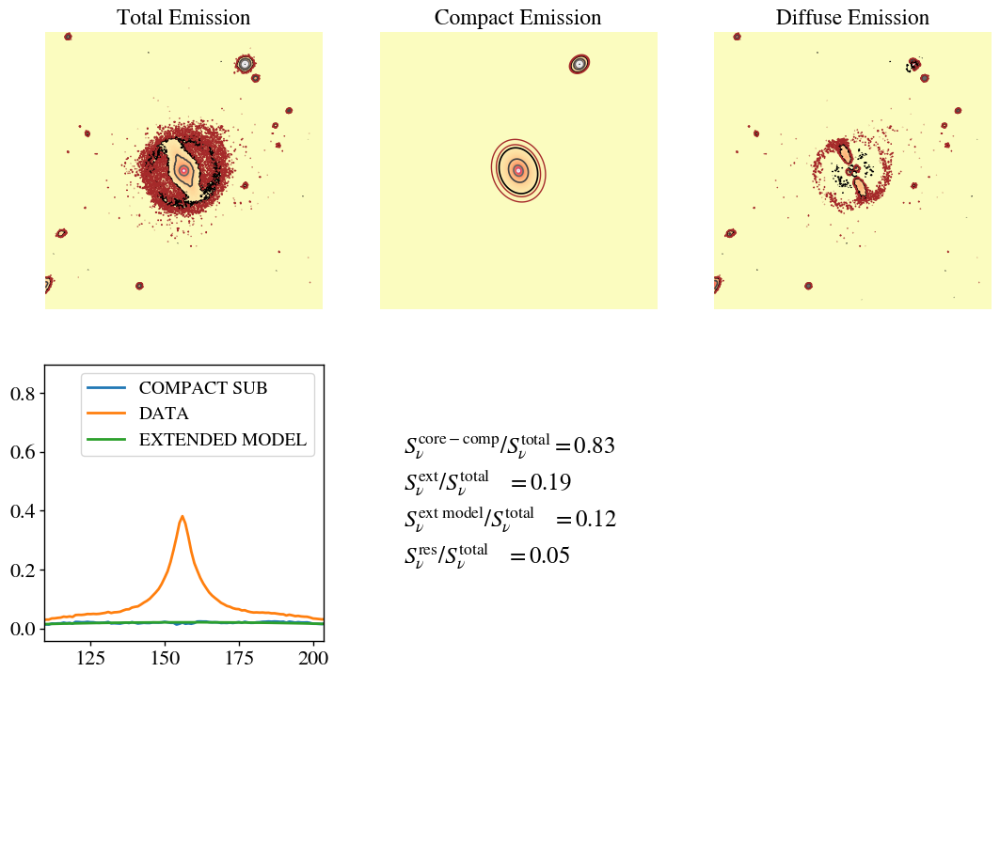

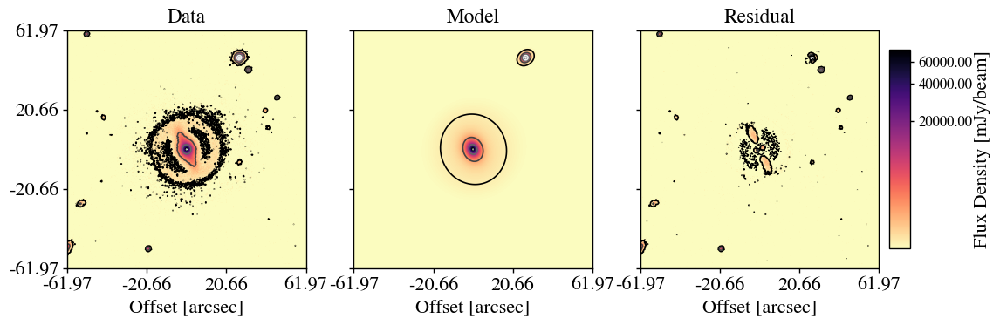

/home/lucatell/pCloudDrive/PhD/GitHub/morphen/image_decomposition/../libs/libs.py:9231: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(1e-7, -0.05 * np.log(ir[0]))


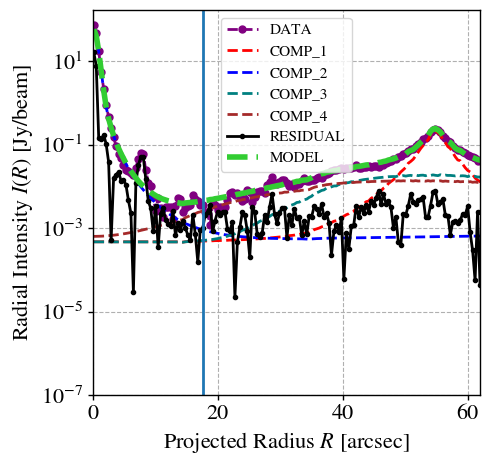

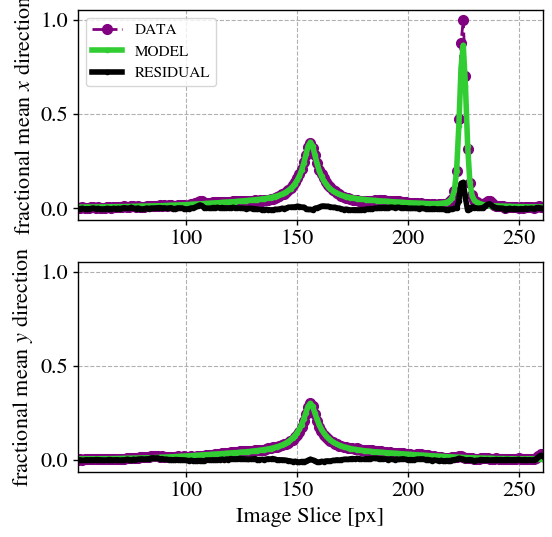

name,value,standard error,relative error,initial value,min,max,vary
f1_x0,155.702125,0.01209427,(0.01%),155.7015090248613,135.973687,175.973687,True
f1_y0,155.749139,0.01434969,(0.01%),155.74976348946385,136.018965,176.018965,True
f1_PA,-69.7998303,0.87003878,(1.25%),-69.78535991529208,-156.491652,23.5083481,True
f1_ell,0.20999266,0.00590622,(2.81%),0.20985159036702866,0.08282694,0.75000000,True
f1_n,1.82349568,0.06456736,(3.54%),1.8216148853041376,0.30000000,8.00000000,True
f1_In,1.14468240,0.12558287,(10.97%),1.1463112372997917,0.04039604,40.3960422,True
f1_Rn,8.07175957,0.90689229,(11.24%),8.066522804295536,0.13440888,26.8817764,True
f1_cg,-0.00993035,0.05588982,(562.82%),-0.009865007693826856,-0.01000000,0.01000000,True
f2_x0,224.458183,0.00370589,(0.00%),224.4599648557796,204.797159,244.797159,True
f2_y0,275.850314,0.00526760,(0.00%),275.84878473368883,256.081973,296.081973,True


In [61]:

special_name = '_'+str(n_components_new)+'C'+save_name_append
mlibs.plot_decomp_results(imagename=crop_image,
                    compact=model_dict['model_c1_conv'] + model_dict['model_c2_conv'] + model_dict['model_c3_conv'], #+ model_dict['model_c4_conv'],
                    extended_model=model_dict['model_c4_conv'],
                    # compact=model_dict['model_total_conv'],
                    # extended_model=model_dict['best_residual_conv'],
                    special_name=special_name)
mlibs.plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new,
                 crop=False,box_size=200,
                 vmax_factor=0.3,vmin_factor=1.0)
# plt.xlim(0,3)

mlibs.plot_slices(data_2D=mlibs.ctn(crop_image),model_dict=model_dict,image_results_conv=image_results_conv[-2],Rp_props=sources_photometies_new,residual_2D=None)
result_mini.params

In [59]:
model_dict

{'model_c1': array([[0.0011629 , 0.00116045, 0.001158  , ..., 0.00040106, 0.00039861,
         0.00039616],
        [0.00116087, 0.00115843, 0.00115598, ..., 0.0004007 , 0.00039826,
         0.00039581],
        [0.00115885, 0.00115641, 0.00115397, ..., 0.00040035, 0.00039791,
         0.00039547],
        ...,
        [0.00053232, 0.00053154, 0.00053077, ..., 0.00029112, 0.00029035,
         0.00028957],
        [0.00053029, 0.00052952, 0.00052875, ..., 0.00029077, 0.00029   ,
         0.00028923],
        [0.00052826, 0.0005275 , 0.00052673, ..., 0.00029041, 0.00028965,
         0.00028889]], dtype=float32),
 'model_c1_conv': array([[0.00049508, 0.00066728, 0.00073719, ..., 0.0002557 , 0.00022996,
         0.00016984],
        [0.00066739, 0.00089954, 0.00099378, ..., 0.00034482, 0.00031012,
         0.00022906],
        [0.00073753, 0.00099406, 0.00109819, ..., 0.00038129, 0.00034293,
         0.00025329],
        ...,
        [0.00033917, 0.00045725, 0.00050538, ..., 0.00027739, 0.

In [46]:
# """
# Run the fitting again, now including the additional component. 
# For this run, we keep the sersic indeces fixed to 0.5 and 1.0. 
# """
# ## We use 2 solver methods for better convergence. 
# save_name_append='_ls_n0n1'
# result_mini, mini,result_1,result_extra,model_dict, \
# image_results_conv,image_results_deconv, \
#                     smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=None,
#                                                    init_constraints=sources_photometies_new,psf_name=psf_name,
#                                                    params_values_init = None,#imfit_conf_values[0:-1],
# #                                                    fix_n = False,fix_x0_y0=[False,False,False],
#                                                    ncomponents=n_components_new,constrained=True,self_bkg=False,rms_map=rms_map,
#                                                    fix_n=[False,True,False,False,True,True,False],
#                                                    fix_value_n = [0.5,1.0,1.0, 1.0],fix_x0_y0=[True,True,True,True],dr_fix = [7.5,7.5,7.5,7.5],
#                                                    # n_to_fix = [0.5,None,1.0,None]
#                                                    convolution_mode='GPU',fix_geometry=True,workers=6,
#                                                    #do not fix the n of the extra component
#                                                    method1 = 'least_squares',method2 = 'least_squares',
#                                                    init_params = 0.25,final_params = 4.0,
#                                                    save_name_append=save_name_append)

Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


/raid1/scratch/lucatelli/PhD/GitHub/morphen/image_decomposition/../../phd_lucatelli_work/analysis/libs.py:10313: UserWarning: No contour levels were found within the data range.
  ax.contour(g, levels=levels_neg[::-1], colors='k', linewidths=1.0,extent=extent,


Flux on compact (self rms) =  2754215.576171875
Flux on compact (data rms) =  2754126.46484375
Flux on extended (self rms) =  7399238.211214536
Flux on extended (data rms) =  7399238.211214536
Flux on extended2 (data rms) =  7399238.211214536
Flux on extended model (data rms) =  6860678.22265625
Flux on data =  10153453.998037886
Flux on residual =  538649.3105378859


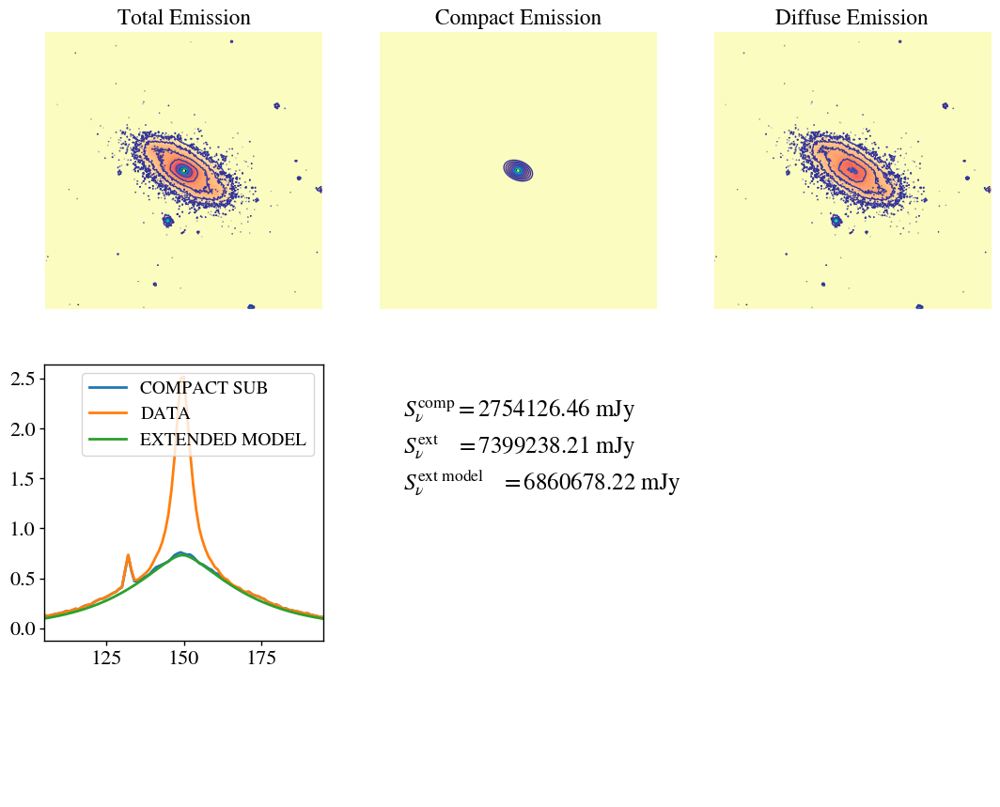

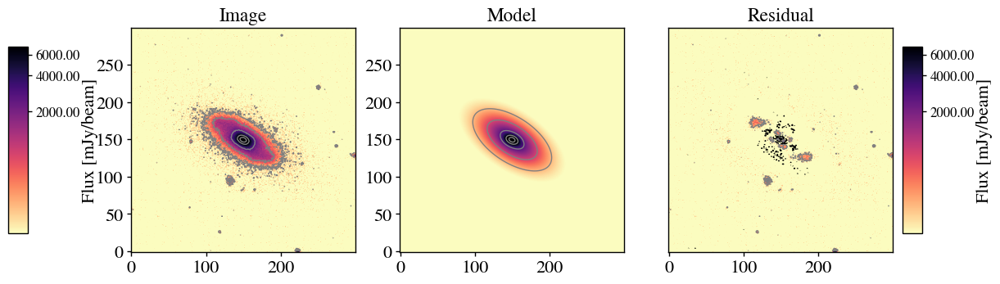

/raid1/scratch/lucatelli/PhD/GitHub/morphen/image_decomposition/../../phd_lucatelli_work/analysis/libs.py:9228: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(1e-7, -0.05 * np.log(ir[0]))


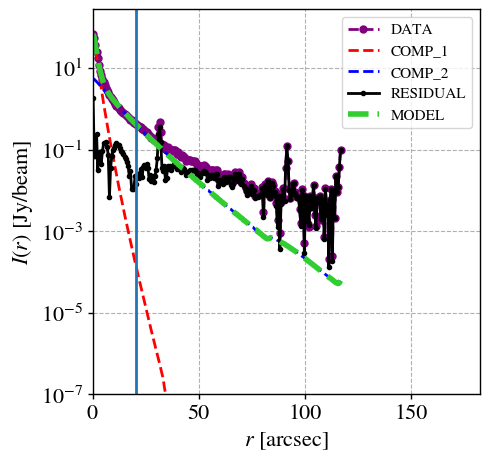

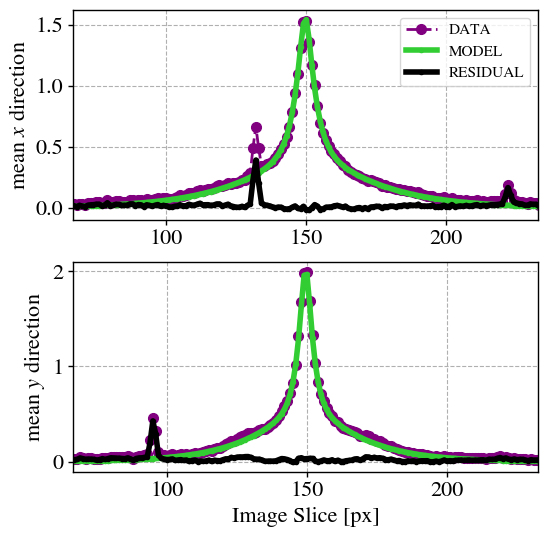

In [76]:
special_name = '_'+str(n_components_new)+'C'+save_name_append
plot_decomp_results(imagename=crop_image,
                    compact=model_dict['model_c1_conv'],
                    extended_model=model_dict['model_c2_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new,
                 crop=False,box_size=200,
                 vmax_factor=0.3,vmin_factor=1.0)
# plt.xlim(0,3)

plot_slices(data_2D=ctn(crop_image),model_dict=model_dict,image_results_conv=image_results_conv[-2],Rp_props=sources_photometies_new,residual_2D=None)

In [54]:
"""
Run the fitting again, now including the additional component. 
For this run, we keep the sersic indeces fixed to 0.5 and 1.0. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n10D10D'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, \
                    smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=None,
                                                   init_constraints=sources_photometies_new,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new,constrained=True,self_bkg=True,#rms_map=rms_map,
                                                   fix_n=[False,False,False,False,True,True,False],
#                                                     mask_region=mask_component,
                                                   fix_value_n = [0.5,0.5,1.0, 1.0,1.0,1.0,1.0],
                                                    fix_x0_y0=[True,True,True,True,True,True,True],dr_fix = [3.5,3.5,3.5,27.5,27.5,7.5,7.5],
                                                   # n_to_fix = [0.5,None,1.0,None]
                                                   convolution_mode='GPU',fix_geometry=True,workers=6,
                                                   #do not fix the n of the extra component
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   init_params = 0.25,final_params = 4.0,loss='cauchy',tr_solver='exact',
                                                   save_name_append=save_name_append)

No residual/background provided. Using image bkg map...
---------------------------------------
<<< PERFORMING CONVOLUTION WITH GPU >>>
---------------------------------------
Limiting  x0
Limiting  y0
Limiting  x0
Limiting  y0
Limiting  x0
Limiting  y0
Limiting  x0
Limiting  y0
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 4  to 0.5.
{'f1_x0': {'value': 216.72250592732433, 'min': 213.22250592732433, 'max': 220.22250592732433}, 'f1_y0': {'value': 213.31702108682893, 'min': 209.81702108682893, 'max': 216.81702108682893}, 'f1_PA': {'value': 58.399378317914625, 'min': -31.600621682085375, 'max': 148.39937831791462}, 'f1_ell': {'value': 0.19743602274130012, 'min': 0.039487204548260026, 'max': 0.5}, 'f1_n': {'value': 0.5, 'min': 0.45, 'max': 8.0}, 'f1_In': {'value': 0.6235350628693899, 'min': 0.06235350628693899, 'max': 31.176753143469494}, 'f1_Rn': {'value': 18.096619323864775, 'min': 1.8096619323864775, 'max': 54.28985797159433}, 'f1_cg': {'value': 0.0, 'min': -0.01, 'max': 0

In [55]:
# """
# Run the fitting again, now including the additional component. 
# For this run, we keep the sersic indeces fixed to 0.5 and 1.0. 
# """
# ## We use 2 solver methods for better convergence. 
# save_name_append='_ls_n0n1'
# result_mini, mini,result_1,result_extra,model_dict, \
# image_results_conv,image_results_deconv, \
#                     smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=None,
#                                                    init_constraints=sources_photometies_new,psf_name=psf_name,
#                                                    params_values_init = None,#imfit_conf_values[0:-1],
# #                                                    fix_n = False,fix_x0_y0=[False,False,False],
#                                                    ncomponents=n_components_new,constrained=True,self_bkg=False,rms_map=rms_map,
#                                                    fix_n=[False,True,False,False,True,True,False],
#                                                    fix_value_n = [0.5,1.0,1.0, 1.0],fix_x0_y0=[True,True,True,True],dr_fix = [7.5,7.5,7.5,7.5],
#                                                    # n_to_fix = [0.5,None,1.0,None]
#                                                    convolution_mode='GPU',fix_geometry=True,workers=6,
#                                                    #do not fix the n of the extra component
#                                                    method1 = 'least_squares',method2 = 'least_squares',
#                                                    init_params = 0.25,final_params = 4.0,
#                                                    save_name_append=save_name_append)

In [56]:
result_mini.params

name,value,initial value,min,max,vary
f1_x0,216.722506,216.72250592732433,213.222506,220.222506,True
f1_y0,213.318342,213.31834212551863,209.817021,216.817021,True
f1_PA,58.3993783,58.399378317914625,-31.6006217,148.399378,True
f1_ell,0.19743602,0.19743602274130012,0.03948720,0.50000000,True
f1_n,0.50000000,0.5,0.45000000,8.00000000,True
f1_In,0.63062357,0.6306235717235905,0.06235351,31.1767531,True
f1_Rn,18.0966193,18.096619323864775,1.80966193,54.2898580,True
f1_cg,0.00000000,0.0,-0.01000000,0.01000000,True
f2_x0,280.204504,280.20450376622745,276.704504,283.704504,True
f2_y0,150.713745,150.7137448790002,147.213745,154.213745,True


## PSF Tests 1

In [110]:
PSF_BEAM_raw = pf.getdata(psf_name)
PSF_BEAM_jax = jnp.array(PSF_BEAM_raw)

In [111]:
PSF_BEAM_raw.shape

(21, 21)

In [112]:
@jit
def jitted_convolve(image, psf):
    return jax.scipy.signal.fftconvolve(image, psf, mode='same')

In [113]:
data_conv_gpu = jitted_convolve(data2D, PSF_BEAM_jax)
# data_2D.shape
data_conv_sp = scipy.signal.fftconvolve(data2D, PSF_BEAM_raw, 'same')

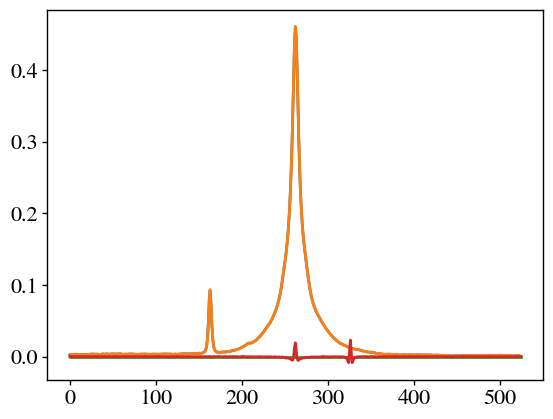

In [117]:
plt.plot(np.mean(data_conv_sp,axis=1))
plt.plot(np.mean(data_conv_gpu,axis=1))
# plt.plot(np.mean(data_conv_gpu2,axis=1))
plt.plot(np.mean(data_conv_sp,axis=0)- np.mean(data_conv_gpu,axis=0))
plt.plot(np.mean(data_2D,axis=0)- np.mean(data_conv_sp,axis=0))
# plt.plot(np.mean(data_2D,axis=0)- np.mean(data_conv_gpu,axis=0))

## PSF Tests 2

In [115]:
PSF_BEAM_raw = pf.getdata(psf_name)
PSF_BEAM_jax = jnp.array(PSF_BEAM_raw)

In [87]:
PSF_BEAM_raw.shape

(51, 51)

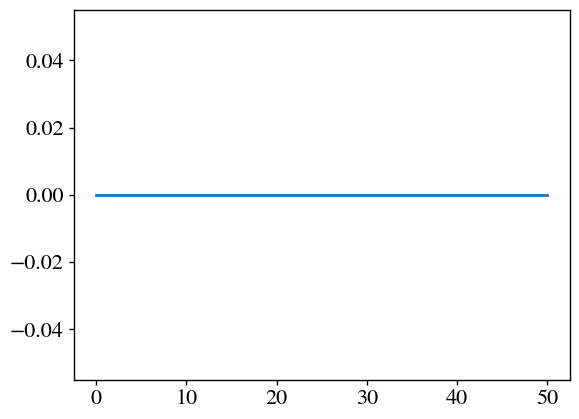

In [88]:
# plt.plot(np.mean(PSF_BEAM_jax,axis=1))
# plt.plot(np.mean(PSF_BEAM_raw,axis=1))
plt.plot(np.mean(PSF_BEAM_raw,axis=1) - np.mean(PSF_BEAM_raw,axis=1))

In [89]:
import jax
# @jit
def convolve_on_gpu(image, psf):
    image_fft = fft2(image)
    psf_fft = fft2(psf)
    conv_fft = image_fft * psf_fft
    return fftshift(jnp.real(ifft2(conv_fft)))
    # return jnp.real(ifft2(conv_fft))

jax_convolve = jit(convolve_on_gpu)

# amplitude okay, horizontal offset present
# def convolve_jax(image, psf):
#     # Calculate the shape of the result
#     result_shape = tuple(i + p - 1 for i, p in zip(image.shape, psf.shape))

#     # Compute the FFTs of the image and PSF
#     image_fft = jnp.fft.fft2(image, result_shape)
#     psf_fft = jnp.fft.fft2(psf, result_shape)

#     # Perform the convolution in the frequency domain
#     conv_fft = image_fft * psf_fft

#     # Compute the inverse FFT
#     convolved = jnp.fft.ifft2(conv_fft)

#     # Crop the result to match the original image shape
#     convolved = convolved[:image.shape[0], :image.shape[1]]

#     return jnp.real(convolved)

# # Optional: JIT compile the function for improved performance
# # jax_convolve = jax.jit(convolve_jax)
# jax_convolve2 = jax.jit(convolve_jax)



def convolve_jax(image, psf):
    # Calculate the shape of the result
    result_shape = tuple(i + p - 1 for i, p in zip(image.shape, psf.shape))

    # Calculate the center offsets
    center_offsets = [(r // 2) - (p // 2) for r, p in zip(result_shape, psf.shape)]

    # Compute the FFTs of the image and PSF
    image_fft = jnp.fft.fft2(image, result_shape)
    psf_fft = jnp.fft.fft2(jnp.roll(psf, center_offsets), result_shape)

    # Perform the convolution in the frequency domain
    conv_fft = image_fft * psf_fft

    # Compute the inverse FFT
    convolved = jnp.fft.ifft2(conv_fft)
    print(convolved.shape)
    # Crop the result to match the original image shape
    convolved = convolved[
        int(psf.shape[0]//2):int(image.shape[0]+psf.shape[0]//2), 
        int(psf.shape[1]//2):int(image.shape[1]+psf.shape[1]//2)]
    print(convolved.shape)
    return jnp.real(convolved)
jax_convolve = jax.jit(convolve_jax)

def pad_for_convolution(input_array, target_shape):
    # Calculate the padding shape
    pad_shape = [(0, ts - s) for s, ts in zip(input_array.shape, target_shape)]
    return jnp.pad(input_array, pad_shape, mode='constant')

def convolve_on_gpu(image, psf):
    # Calculate the new padded shape
    padded_shape = (image.shape[0] + psf.shape[0] - 1, 
                    image.shape[1] + psf.shape[1] - 1)
    
    # Pad both image and psf to the new shape
    # image_padded = pad_for_convolution(image, padded_shape)
    pad_shape = [(0, ts - s) for s, ts in zip(image.shape, padded_shape)]
    image_padded = jnp.pad(image, pad_shape, mode='constant')
    pad_shape = [(0, ts - s) for s, ts in zip(psf.shape, padded_shape)]
    psf_padded = jnp.pad(psf, pad_shape, mode='constant')
    # psf_padded = pad_for_convolution(psf, padded_shape)
    image_fft = jnp.fft.fft2(image_padded)
    psf_fft = jnp.fft.fft2(psf_padded)

    conv_fft = image_fft * psf_fft
    
    # Get the real part of the inverse FFT and crop to the original image size
    result_full = jnp.real(jnp.fft.ifft2(conv_fft))
    return result_full[psf.shape[0]//2:image.shape[0]+psf.shape[0]//2, 
                       psf.shape[1]//2:image.shape[1]+psf.shape[1]//2]

jax_convolve = jit(convolve_on_gpu)

In [90]:
# def pad_for_convolution(input_array, target_shape):
#     # Calculate the padding shape
#     pad_shape = [(0, ts - s) for s, ts in zip(input_array.shape, target_shape)]
#     return jnp.pad(input_array, pad_shape, mode='constant')

# def convolve_on_gpu_padded(image, psf):
#     # Calculate the new padded shape
#     padded_shape = (image.shape[0] + psf.shape[0] - 1, 
#                     image.shape[1] + psf.shape[1] - 1)
    
#     # Pad both image and psf to the new shape
#     image_padded = pad_for_convolution(image, padded_shape)
#     psf_padded = pad_for_convolution(psf, padded_shape)

#     image_fft = jnp.fft.fft2(image_padded)
#     psf_fft = jnp.fft.fft2(psf_padded)

#     conv_fft = image_fft * psf_fft
    
#     # Get the real part of the inverse FFT and crop to the original image size
#     result_full = jnp.real(jnp.fft.ifft2(conv_fft))
#     return result_full[psf.shape[0]//2:image.shape[0]+psf.shape[0]//2, 
#                        psf.shape[1]//2:image.shape[1]+psf.shape[1]//2]

# jax_convolve_padded = jit(convolve_on_gpu_padded)

In [91]:
data_conv_gpu = jax_convolve(data2D, PSF_BEAM_jax)
# data_2D.shape
data_conv_sp = scipy.signal.fftconvolve(data2D, PSF_BEAM_raw, 'same')
# data_conv_gpu2 = jax_convolve2(data2D, PSF_BEAM_jax)
# data_conv_gpu2 = jax_convolve_padded(data2D, PSF_BEAM_jax)
# data_2D.shape
# data_conv_gpu2.shape

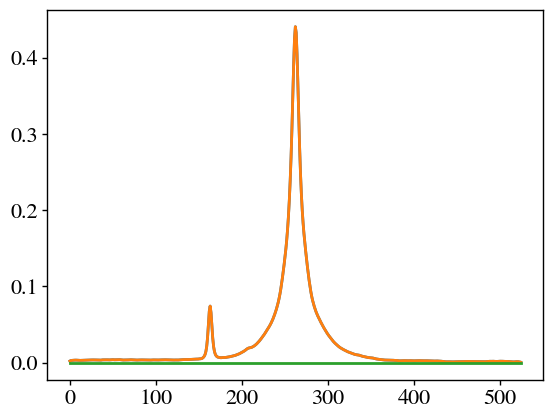

In [92]:
plt.plot(np.mean(data_conv_sp,axis=1))
plt.plot(np.mean(data_conv_gpu,axis=1))
# plt.plot(np.mean(data_conv_gpu2,axis=1))
plt.plot(np.mean(data_conv_sp,axis=0)- np.mean(data_conv_gpu,axis=0))
# plt.plot(np.mean(data_conv_sp,axis=0)- np.mean(data_conv_gpu2,axis=0))
# plt.plot(np.mean(data_conv_sp,axis=1)- np.mean(data_conv_sp2,axis=1))
# plt.plot(np.mean(data_conv_gpu2,axis=1data_conv_sp

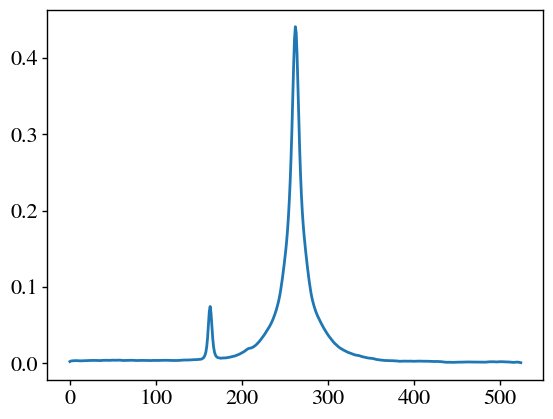

In [93]:
plt.plot(np.mean(data_conv_sp,axis=1))

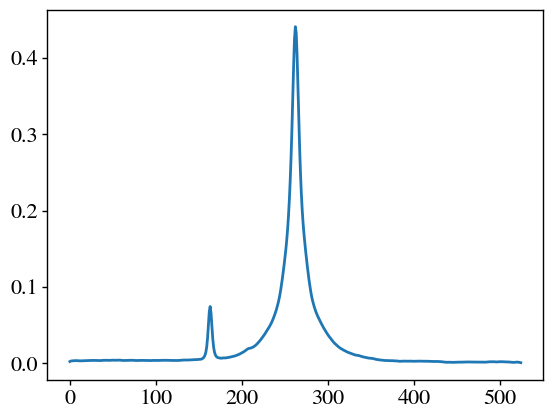

In [94]:
plt.plot(np.mean(data_conv_gpu,axis=1))

In [95]:
np.asarray(data_conv_gpu).copy()

array([[ 2.0921507e-03,  2.1354472e-03,  1.9758937e-03, ...,
        -4.5540673e-05, -8.8240267e-05, -1.6647077e-04],
       [ 2.3326795e-03,  2.5729015e-03,  2.4137024e-03, ...,
        -1.7239097e-05, -2.2350308e-04, -4.2094925e-04],
       [ 1.5756196e-03,  1.7698276e-03,  1.4661042e-03, ...,
         3.5274628e-04, -1.4487226e-04, -5.9513160e-04],
       ...,
       [-4.2253302e-04, -5.0087337e-04, -8.9178524e-05, ...,
        -1.0506265e-03, -1.2974461e-03, -1.0510718e-03],
       [-1.6183883e-04,  1.2611710e-04,  7.9211144e-04, ...,
        -2.2228169e-03, -2.0674486e-03, -1.3802818e-03],
       [ 2.1233746e-04,  8.0471887e-04,  1.4960038e-03, ...,
        -2.7450067e-03, -2.2588910e-03, -1.3716457e-03]], dtype=float32)

In [96]:
data_conv_sp

array([[ 2.09214962e-03,  2.13544408e-03,  1.97588733e-03, ...,
        -4.54759421e-05, -8.81772878e-05, -1.66415764e-04],
       [ 2.33268689e-03,  2.57290559e-03,  2.41370083e-03, ...,
        -1.71903679e-05, -2.23455249e-04, -4.20909631e-04],
       [ 1.57562420e-03,  1.76983075e-03,  1.46610264e-03, ...,
         3.52795723e-04, -1.44822322e-04, -5.95086463e-04],
       ...,
       [-4.22524643e-04, -5.00867843e-04, -8.91718668e-05, ...,
        -1.05061881e-03, -1.29743647e-03, -1.05106008e-03],
       [-1.61835286e-04,  1.26118906e-04,  7.92113768e-04, ...,
        -2.22281008e-03, -2.06744077e-03, -1.38027175e-03],
       [ 2.12350261e-04,  8.04726866e-04,  1.49601167e-03, ...,
        -2.74499669e-03, -2.25888138e-03, -1.37163592e-03]])

Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


<Axes: xlabel='x pix', ylabel='y pix'>

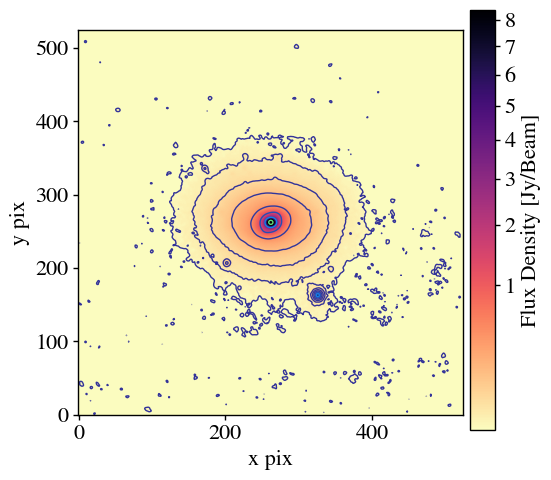

In [97]:
eimshow(data_conv_gpu)

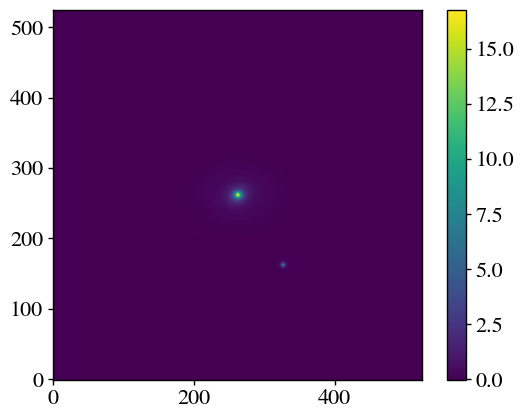

In [98]:
plt.imshow(data_conv_sp,origin='lower')
plt.colorbar()

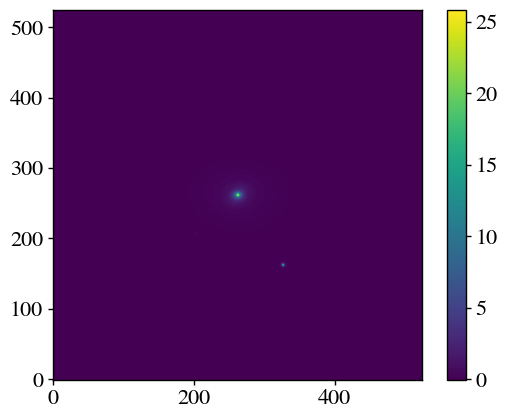

In [99]:
plt.imshow(data_2D,origin='lower')
plt.colorbar()

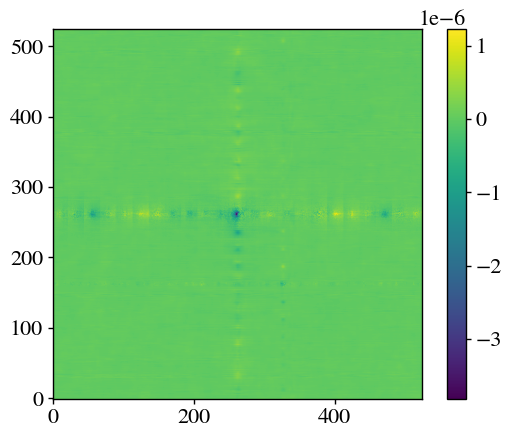

In [100]:
plt.imshow(data_conv_sp - data_conv_gpu,origin='lower')
plt.colorbar()

In [57]:
special_name = '_'+str(n_components_new)+'C'+save_name_append
plot_decomp_results(imagename=crop_image,
                    compact=model_dict['model_c1_conv']+model_dict['model_c2_conv']+model_dict['model_c3_conv']+model_dict['model_c4_conv'],
                    extended_model=model_dict['model_c5_conv']+model_dict['model_c6_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new,
                 crop=False,box_size=200,
                 vmax_factor=0.3,vmin_factor=1.0)
# plt.xlim(0,3)

plot_slices(data_2D=ctn(crop_image),model_dict=model_dict,image_results_conv=image_results_conv[-2],Rp_props=sources_photometies_new,residual_2D=None)

KeyError: 'model_c6_conv'

Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender
Flux on compact (self rms) =  3310969.970703125
Flux on compact (data rms) =  3304985.107421875
Flux on extended (self rms) =  1061818.9018954744
Flux on extended (data rms) =  1055729.5422169135
Flux on extended2 (data rms) =  1111308.755648288
Flux on extended model (data rms) =  1111308.755648288
Flux on data =  4416174.043481116
Flux on residual =  -119.8195890467614


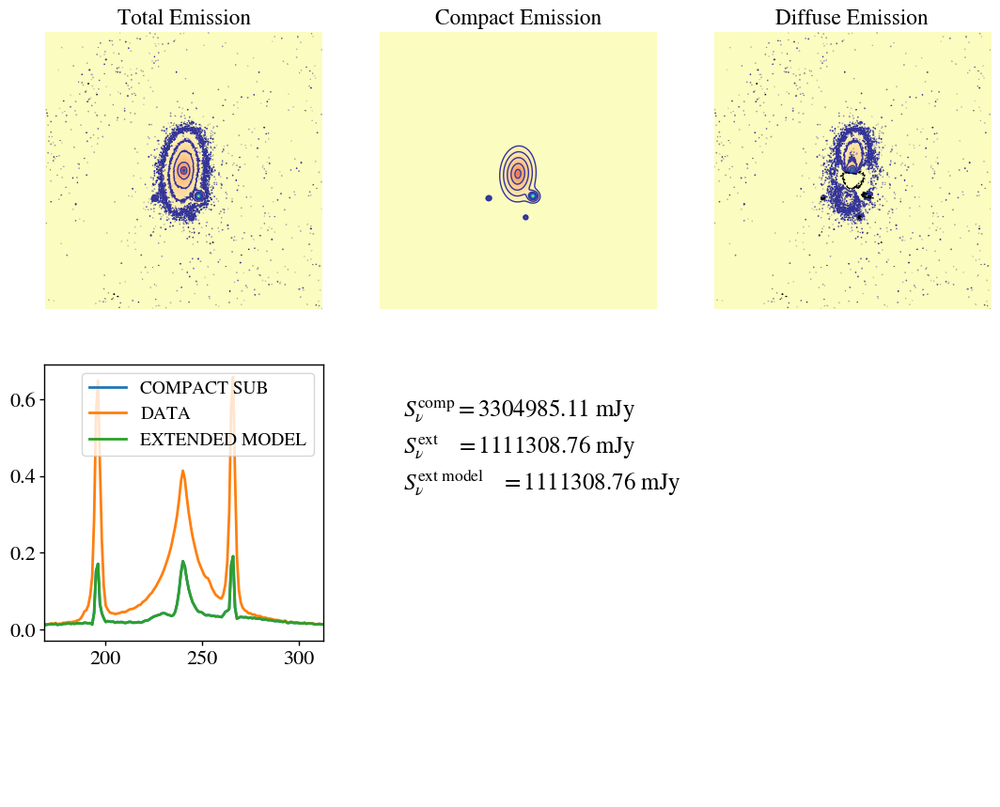

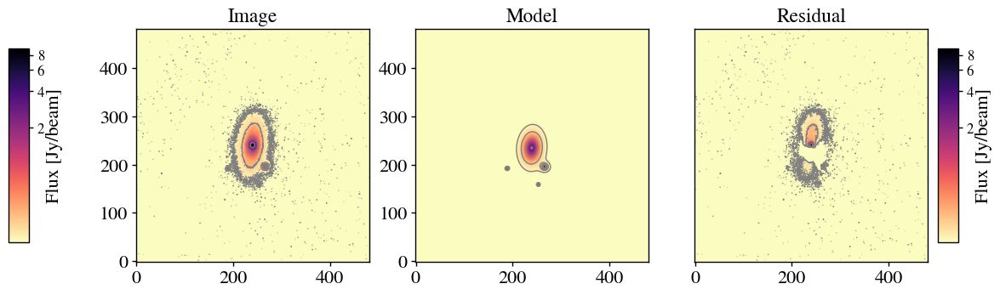

/run/media/sagauga/storage_wd_2/cloud/pcloud_void/PhD/GitHub/morphen/image_decomposition/../../phd_lucatelli_work/analysis/libs.py:9228: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(1e-7, -0.05 * np.log(ir[0]))


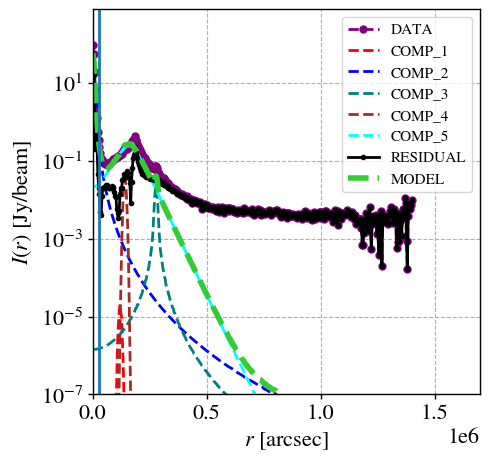

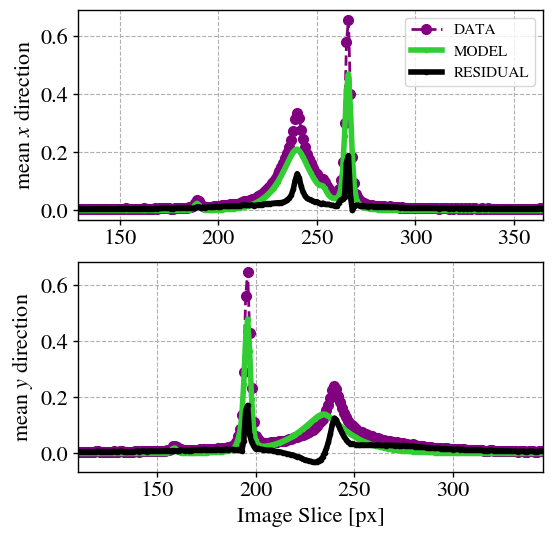

In [205]:
special_name = '_'+str(n_components_new)+'C'+save_name_append
plot_decomp_results(imagename=crop_image,compact=model_dict['model_total_conv'],
                    extended_model=ctn(crop_image) - model_dict['model_total_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new,
                 crop=False,box_size=200,
                 vmax_factor=0.3,vmin_factor=1.0)
# plt.xlim(0,3)

plot_slices(data_2D=ctn(crop_image),model_dict=model_dict,image_results_conv=image_results_conv[-2],Rp_props=sources_photometies_new,residual_2D=None)

In [106]:
def run_mcmc_mini(imagename,psf_name,mini_results,residualname=None,rms_map=None,
                  n_components=None,nwalkers_multiplier=20,
                  burn_in_phase=1000, production_steps = 6000):
    """
    GPU Optimized function to run a MCMC of a multi-dimensional sersic model.
    It uses JAX. 
    This function is not feasible to be run on a CPU. 
    
    Please, only use if you have a GPU, if not, it can take days....
    
    """
    import emcee
    import corner 
    
    if residualname is not None:
        residual_2D = pf.getdata(residualname)
        residual_2D_shuffled = shuffle_2D(residual_2D)
        background = jnp.array(residual_2D_shuffled)
    else:
        background = jnp.array(rms_map)
    data_2D_gpu = jnp.array(pf.getdata(imagename))
    PSF_BEAM = jnp.array(ctn(psf_name))
    size = data_2D.shape
    xy = jnp.meshgrid(jnp.arange((size[1])), jnp.arange((size[0])))
    FlatSky_level_GPU = jnp.array(mad_std(data_2D))
    
    # Read input parameters and std
    params = mini_results.params.copy()
#     opt_params = jnp.asarray(list(params.valuesdict().values()))
    opt_params = jnp.array(list(params.valuesdict().values()))
    stderr = jnp.array([params[name].stderr for name in params.valuesdict().keys()])
    
    if n_components is None:
        n_components = int((stderr.shape[0] - 1) / 8)
    
    nfunctions = n_components
    @jit
    def convolve_on_gpu(image, psf):
        image_fft = fft2(image)
        psf_fft = fft2(psf)
        conv_fft = image_fft * psf_fft
        return fftshift(jnp.real(ifft2(conv_fft)))

    @jit
    def log_likelihood(random_params):
        for i in range(1, nfunctions + 1):
            mcmc_params = random_params[int(8 * (i - 1)):int(8 * (i))]
            model = sersic2D_GPU(xy,
                                  mcmc_params[0],
                                  # params['f' + str(i) + '_x0'],
                                  mcmc_params[1],
                                  # params['f' + str(i) + '_y0'],
                                  mcmc_params[2],
                                  # params['f' + str(i) + '_PA'],
                                  mcmc_params[3],
                                  # params['f' + str(i) + '_ell'],
                                  mcmc_params[4],  # params['f' + str(i) + '_n'],
                                  mcmc_params[5],
                                  # params['f' + str(i) + '_In'],
                                  mcmc_params[6],
                                  # params['f' + str(i) + '_Rn'],
                                  mcmc_params[7]) + background / nfunctions + \
                         FlatSky(FlatSky_level_GPU, random_params[-1]) / nfunctions
        
        MODEL_2D_conv = convolve_on_gpu(model, PSF_BEAM)
        residual = data_2D_gpu - MODEL_2D_conv
        chi2 = jnp.sum(residual ** 2)
        
#         inv_sigma2 = 1.0/(1+MODEL_2D_conv**2*jnp.exp(2))
#     #     return -0.5*(chi2*inv_sigma2 - np.log(inv_sigma2)))
#         dof = len(model) - len(params)
#         log_like = -0.5 * (chi2 + dof * jnp.log(2 * jnp.pi))
        log_like = chi2
#         log_like = -0.5*(jnp.sum(residual ** 2*inv_sigma2 - jnp.log(inv_sigma2)))
        return (log_like)

    def ln_prob(p, params):
        # Calculate log-prior probability
        log_prior_prob = log_prior(p, params)
        if jnp.isinf(log_prior_prob):
            return log_prior_prob

        # Update parameter values based on proposed step
        for i, (param_name, param) in enumerate(params.items()):
            param.value = p[i]

        params_model = jnp.array(list(params.valuesdict().values()))
        log_likelihood_prob = log_likelihood(params_model)
        return log_prior_prob + log_likelihood_prob

    # @jit
#     def log_prior(p, params):
#         out_of_bounds = []
#         for i, (param_name, param) in enumerate(params.items()):
#             if '_cg' in param_name:
#                 if (p[i] < -0.2 or p[i] > 0.2):
#                     out_of_bounds.append(param_name)
#             if 's_a' in param_name:
#                 if (p[i] < 0.0 or p[i] > 10.0):
#                     out_of_bounds.append(param_name)
#             else:
#                 if (p[i] < param.min or p[i] > param.max):
#                     out_of_bounds.append(param_name)
#         if len(out_of_bounds) == 0:
#             return 0.0  # Return zero for in-bounds parameters
#         else:
#             return -jnp.inf  # Return negative infinity for out-of-bounds parameters
        
#     def log_prior(p, params):
#         for i, (param_name, param) in enumerate(params.items()):
# #             if (p[i] < param.min or p[i] > param.max):
#             if (p[i] < param.min or p[i] > param.max):
#                 return -jnp.inf  # Return negative infinity for out-of-bounds parameters
#         return 0.0  # Return zero for in-bounds parameters
#     def log_prior(p, params):
#         for i, (param_name, param) in enumerate(params.items()):
#             if (p[i] < 0.4 or p[i] > param.max+1) and '_n' in param_name:
#                 return -jnp.inf  # Return negative infinity for out-of-bounds parameters
#             if (p[i] < param.min or p[i] > param.max*10.0) and '_In' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min or p[i] > param.max) and '_Rn' in param_name:
#                 return -jnp.inf
#             if (p[i] < 0.0 or p[i] > 0.8) and '_ell' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min or p[i] > param.max) and '_PA' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min*0.9 or p[i] > param.max*1.1) and '_x0' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min*0.9 or p[i] > param.max*1.1) and '_y0' in param_name:
#                 return -jnp.inf
#             if (p[i] < 0.0 or p[i] > 10.0) and 's_a' in param_name:
#                 return -jnp.inf
#         return 0.0  # Return zero for in-bounds parameters

    def log_prior(p, params):
        out_of_bounds = []
        for i, (param_name, param) in enumerate(params.items()):
            pvalue = param.value
            if (p[i] < pvalue*0.8 or p[i] > pvalue*1.25) and '_n' in param_name:
                out_of_bounds.append(param_name)
            if (p[i] < pvalue*0.8 or p[i] > pvalue*1.25) and '_In' in param_name:
                out_of_bounds.append(param_name)
            if (p[i] < pvalue*0.8 or p[i] > pvalue*1.25) and '_Rn' in param_name:
                out_of_bounds.append(param_name)
            if (p[i] < 0.0 or p[i] > pvalue+0.2) and '_ell' in param_name:
                out_of_bounds.append(param_name)
            if (p[i] < pvalue-20 or p[i] > pvalue+20) and '_PA' in param_name:
                out_of_bounds.append(param_name)
            if (p[i] < pvalue-10 or p[i] > pvalue+10) and '_x0' in param_name:
                out_of_bounds.append(param_name)
            if (p[i] < pvalue-10 or p[i] > pvalue+10) and '_y0' in param_name:
                out_of_bounds.append(param_name)
            if (p[i] < pvalue-0.1 or p[i] > pvalue+0.1) and '_cg' in param_name:
                out_of_bounds.append(param_name)
            if (p[i] < 0.0 or p[i] > pvalue+1) and 's_a' in param_name:
                out_of_bounds.append(param_name)
        if len(out_of_bounds) == 0:
            return 0.0  # Return zero for in-bounds parameters
        else:
            return -jnp.inf  # Return negative infinity for out-of-bounds parameters


#     def log_prior(p, params):
#         out_of_bounds = []
#         for i, (param_name, param) in enumerate(params.items()):
#             if (p[i] < param.min-0.1 or p[i] > param.max+0.1) and '_n' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min or p[i] > param.max) and '_In' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min or p[i] > param.max) and '_Rn' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min or p[i] > param.max) and '_ell' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min or p[i] > param.max) and '_PA' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min-10 or p[i] > param.max+10) and '_x0' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min-10 or p[i] > param.max+10) and '_y0' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min-0.1 or p[i] > param.max+0.1) and '_cg' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < 0.0 or p[i] > 10) and 's_a' in param_name:
#                 out_of_bounds.append(param_name)
#         if len(out_of_bounds) == 0:
#             return 0.0  # Return zero for in-bounds parameters
#         else:
#             return -jnp.inf  # Return negative infinity for out-of-bounds parameters

        
        
        
#     def log_prior(p, params):
#         out_of_bounds = []
#         for i, (param_name, param) in enumerate(params.items()):
#             if (p[i] < param.min-0.1 or p[i] > param.max+0.1) and '_n' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min or p[i] > param.max) and '_In' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min or p[i] > param.max) and '_Rn' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min or p[i] > param.max) and '_ell' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min or p[i] > param.max) and '_PA' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min-30 or p[i] > param.max+30) and '_x0' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min-30 or p[i] > param.max+30) and '_y0' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < param.min-0.5 or p[i] > param.max+0.5) and '_cg' in param_name:
#                 out_of_bounds.append(param_name)
#             if (p[i] < 0.0 or p[i] > 10) and 's_a' in param_name:
#                 out_of_bounds.append(param_name)
#         if len(out_of_bounds) == 0:
#             return 0.0  # Return zero for in-bounds parameters
#         else:
#             return -jnp.inf  # Return negative infinity for out-of-bounds parameters
    
#     def log_prior(p, params):
#         for i, (param_name, param) in enumerate(params.items()):
#             if (p[i] < 0.25 or p[i] > param.max+1) and '_n' in param_name:
#                 return -jnp.inf  # Return negative infinity for out-of-bounds parameters
#             if (p[i] < param.min or p[i] > param.max*10.0) and '_In' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min or p[i] > param.max) and '_Rn' in param_name:
#                 return -jnp.inf
#             if (p[i] < 0.0 or p[i] > 1.0) and '_ell' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min or p[i] > param.max) and '_PA' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min*0.9 or p[i] > param.max*1.1) and '_x0' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min*0.9 or p[i] > param.max*1.1) and '_y0' in param_name:
#                 return -jnp.inf
#             if (p[i] < 0.0 or p[i] > 10.0) and 's_a' in param_name:
#                 return -jnp.inf
#         return 0.0  # Return zero for in-bounds parameters
#     def log_prior(p, params):
#         for i, (param_name, param) in enumerate(params.items()):
#             if (p[i] < 0.25 or p[i] > 6.0) and '_n' in param_name:
#                 return -jnp.inf  # Return negative infinity for out-of-bounds parameters
#             if (p[i] < 0.0 or p[i] > 10.0) and '_In' in param_name:
#                 return -jnp.inf
#             if (p[i] < 1.0 or p[i] > param.max) and '_Rn' in param_name:
#                 return -jnp.inf
#             if (p[i] < 0.0 or p[i] > 1.0) and '_ell' in param_name:
#                 return -jnp.inf
#             if (p[i] < -180. or p[i] > 180) and '_PA' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min*0.9 or p[i] > param.max*1.1) and '_x0' in param_name:
#                 return -jnp.inf
#             if (p[i] < param.min*0.9 or p[i] > param.max*1.1) and '_y0' in param_name:
#                 return -jnp.inf
#             if (p[i] < 0.0 or p[i] > 10.0) and 's_a' in param_name:
#                 return -jnp.inf
#         return 0.0  # Return zero for in-bounds parameters

    # Define the log-posterior function for the MCMC
    # @jit
    def log_posterior(params):
        lp = log_prior(params)
        if not jnp.isfinite(lp):
            return -jnp.inf  # Return negative infinity for out-of-bounds parameters
        return lp + log_likelihood(params)
    
    # prepare the mcmc
    nwalkers = nwalkers_multiplier*len(params) 
    ndim = len(params)
    print('    ### Initi of MCMC ###')
    print('--------------------------------')
    print('    >> Number of Sersics:',n_components)
    print('    >> Number of parameters:',ndim)
    print('    >> Number of walkers:   ',nwalkers)
    print('--------------------------------')
    print('    >> Burn-in:   ',burn_in_phase)
    print('    >> Main-Phase Steps:   ',production_steps)
    p0 = []
    for i in range(nwalkers):
        walker_params = []
        random_params = jnp.array(generate_random_params_normal(np.asarray(list(params.valuesdict().values())),stderr))
        p0.append(random_params)
    
    sampler = emcee.EnsembleSampler(nwalkers, ndim, ln_prob, args=(params,),threads=1)    
    sampler.run_mcmc(p0, production_steps,progress=True)
#     samples = sampler.chain[:, burn_in_phase:, :].reshape((-1, ndim))
    samples = sampler.get_chain(discard=burn_in_phase, flat=True)
    
    print('--------------------------------')
    print('    Parameter Errors            ')
    # Compute the median and 1-sigma error bars for each parameter
    params_median = np.median(samples, axis=0)
    params_err_minus = np.percentile(samples, 16, axis=0) - params_median
    params_err_plus = np.percentile(samples, 84, axis=0) - params_median
    params_err = 0.5 * (params_err_minus + params_err_plus)

    # Print the results
    for i, param_name in enumerate(params):
        print(f"{param_name} = {params_median[i]} +/- {params_err[i]}")
    
    idx_cut = [] # only select n, In and Rn parameters
    for i in range(0, n_components):
        idx_cut.append(int(i * 8 + 4))
        idx_cut.append(int(i * 8 + 5))
        idx_cut.append(int(i * 8 + 6))


    labels = [f"{param_name}" for param_name in params]
    # Plot the corner plot
    fig = corner.corner(samples[:,idx_cut], 
                        labels=np.asarray(labels)[idx_cut], 
                        truths=list(params_median[idx_cut]))

    plt.show()
    
    # Plot the chains
    fig, axes = plt.subplots(len(idx_cut), figsize=(10, 27), sharex=True)
    labels = [f"{param_name}" for param_name in params]
    for i in range(0,len(idx_cut)):
    # for i in idx_cut:
        ax = axes[i]
        ax.plot(sampler.get_chain()[:, :, idx_cut[i]], color="k", alpha=0.1)
        ax.set_xlim(0, len(sampler.get_chain()))
        ax.set_ylabel(labels[idx_cut[i]])
    axes[-1].set_xlabel("Step")
    
    return(samples,sampler)

# def run_mcmc_mini(imagename,residualname,psf_name,mini_results,
#                   n_components=None,
#                   burn_in_phase=500, production_steps = 3000):

def generate_random_params_uniform(params, param_errors):
    # Generate a set of random numbers from a normal distribution with mean 0 and standard deviation 1
    # try:
    #     # Scale the random numbers by the standard errors of the parameters
    param_errors_corr = param_errors.copy()
    random_nums = np.random.uniform(-0.1, 0.1, size=len(params))
    scaled_random_nums = random_nums * params
    random_params = params + scaled_random_nums
    return random_params

def generate_random_params_normal(params, param_errors):
    # Generate a set of random numbers from a normal distribution with mean 0 and standard deviation 1    
    param_errors_corr = param_errors.copy()
    random_nums = np.random.normal(0.0, 3, size=len(params))
    scaled_random_nums = random_nums * param_errors
#     random_nums = np.random.normal(0.0, 0.1, size=len(params))
#     scaled_random_nums = random_nums * params
    random_params = params + scaled_random_nums
    return random_params

def generate_random_params_tukeylambda(params, param_errors):
    from scipy.stats import tukeylambda
    # Generate a set of random numbers from a normal distribution with mean 0 and standard deviation 1    
    param_errors_corr = param_errors.copy()
    random_nums =  tukeylambda.rvs(0.5, size=len(params)) *10
    scaled_random_nums = random_nums * param_errors
#     random_nums =  tukeylambda.rvs(0.5, size=len(params)) *0.1
#     scaled_random_nums = random_nums * params
    random_params = params + scaled_random_nums
    return random_params

    ### Initi of MCMC ###
--------------------------------
    >> Number of Sersics: 2
    >> Number of parameters: 17
    >> Number of walkers:    850
--------------------------------
    >> Burn-in:    500
    >> Main-Phase Steps:    10000


  0%|                                                                                                                                                                                                               | 0/10000 [00:00<?, ?it/s]/raid1/scratch/lucatelli/apps/miniconda3/envs/casa6/lib/python3.8/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10000/10000 [1:55:30<00:00,  1.44it/s]


--------------------------------
    Parameter Errors            
f1_x0 = 149.9961395263672 +/- -0.05904388427734375
f1_y0 = 149.6025848388672 +/- 0.05191802978515625
f1_PA = -16.234848022460938 +/- 2.119711399078369
f1_ell = 0.23148275911808014 +/- 0.0035312138497829437
f1_n = 1.1382101774215698 +/- 0.00048673152923583984
f1_In = 20.87432861328125 +/- 0.19215774536132812
f1_Rn = 4.461461544036865 +/- 0.04183173179626465
f1_cg = -0.030865022912621498 +/- -0.000283251516520977
f2_x0 = 159.26080322265625 +/- -6.708717346191406
f2_y0 = 158.80963134765625 +/- -6.828056335449219
f2_PA = -40.94011688232422 +/- -1.0200557708740234
f2_ell = 0.8231405019760132 +/- -0.03355863690376282
f2_n = 0.7774505019187927 +/- 0.008026093244552612
f2_In = 0.3280876874923706 +/- 0.0399802029132843
f2_Rn = 4.791219234466553 +/- 2.2957763671875
f2_cg = 0.4081055223941803 +/- -0.008223623037338257
s_a = 0.009681803174316883 +/- 0.030215933686122298
Too few points to create valid contours


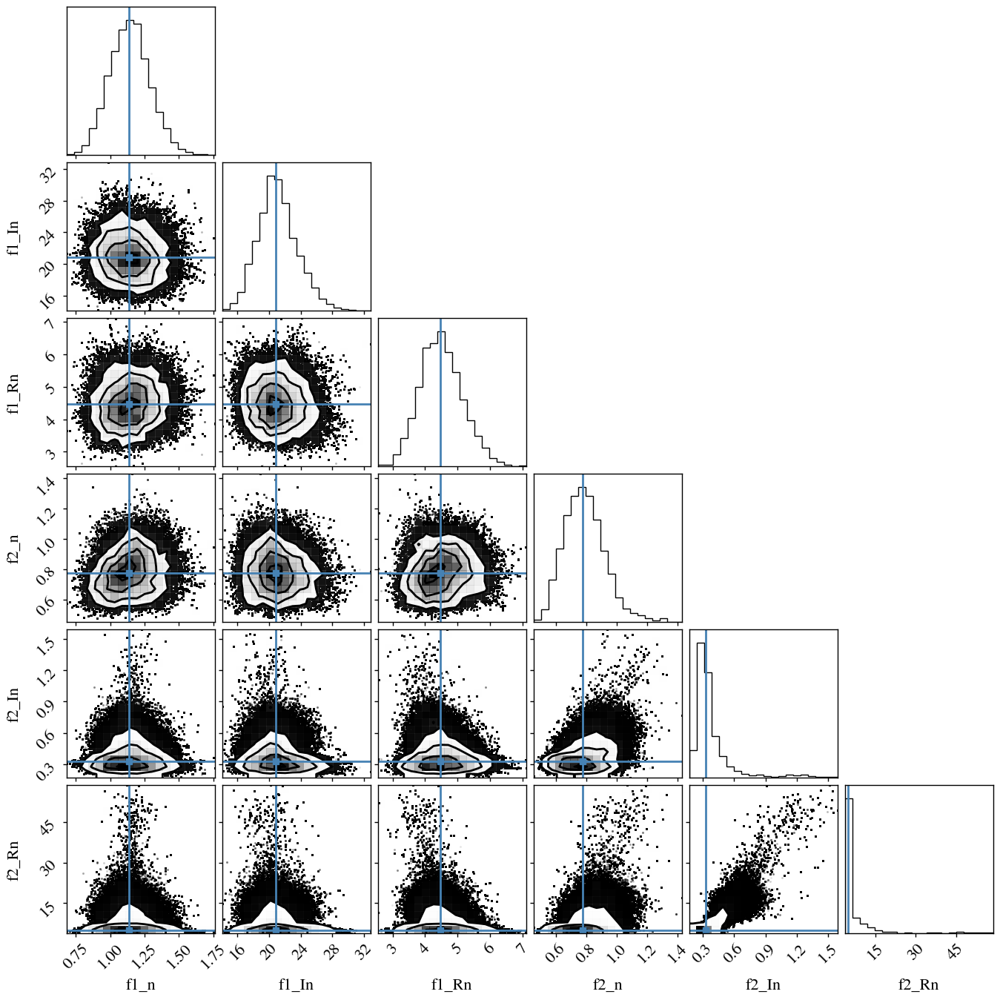

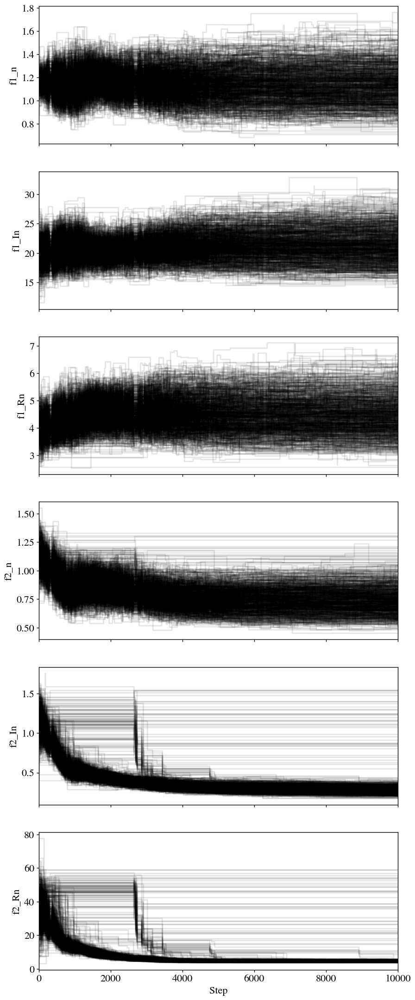

In [107]:
samples,sampler = run_mcmc_mini(imagename = crop_image,
                                psf_name=psf_name,
                                mini_results=result_mini,
                                rms_map = bkg_,
                                burn_in_phase=500,
                                production_steps=10000,
                                nwalkers_multiplier=50)

f1_x0 = 150.07102966308594 +/- -0.14356231689453125
f1_y0 = 149.6288604736328 +/- 0.02718353271484375
f1_PA = -14.946730613708496 +/- 1.3095784187316895
f1_ell = 0.21401211619377136 +/- 0.017960842698812485
f1_n = 1.1367857456207275 +/- 0.0022251904010772705
f1_In = 20.919527053833008 +/- 0.19838619232177734
f1_Rn = 4.482629776000977 +/- 0.038481831550598145
f1_cg = -0.0310222040861845 +/- -0.00026014260947704315
f2_x0 = 160.03480529785156 +/- -7.674049377441406
f2_y0 = 159.54037475585938 +/- -7.596900939941406
f2_PA = -41.99256134033203 +/- -0.42214012145996094
f2_ell = 0.8278305530548096 +/- 0.007274627685546875
f2_n = 0.7662455439567566 +/- 0.0072099268436431885
f2_In = 0.31678855419158936 +/- 0.01584114134311676
f2_Rn = 4.693426132202148 +/- 0.810222864151001
f2_cg = 0.4187462627887726 +/- 0.0007554888725280762
s_a = 0.008978835307061672 +/- 0.0019734716089443542
Too few points to create valid contours


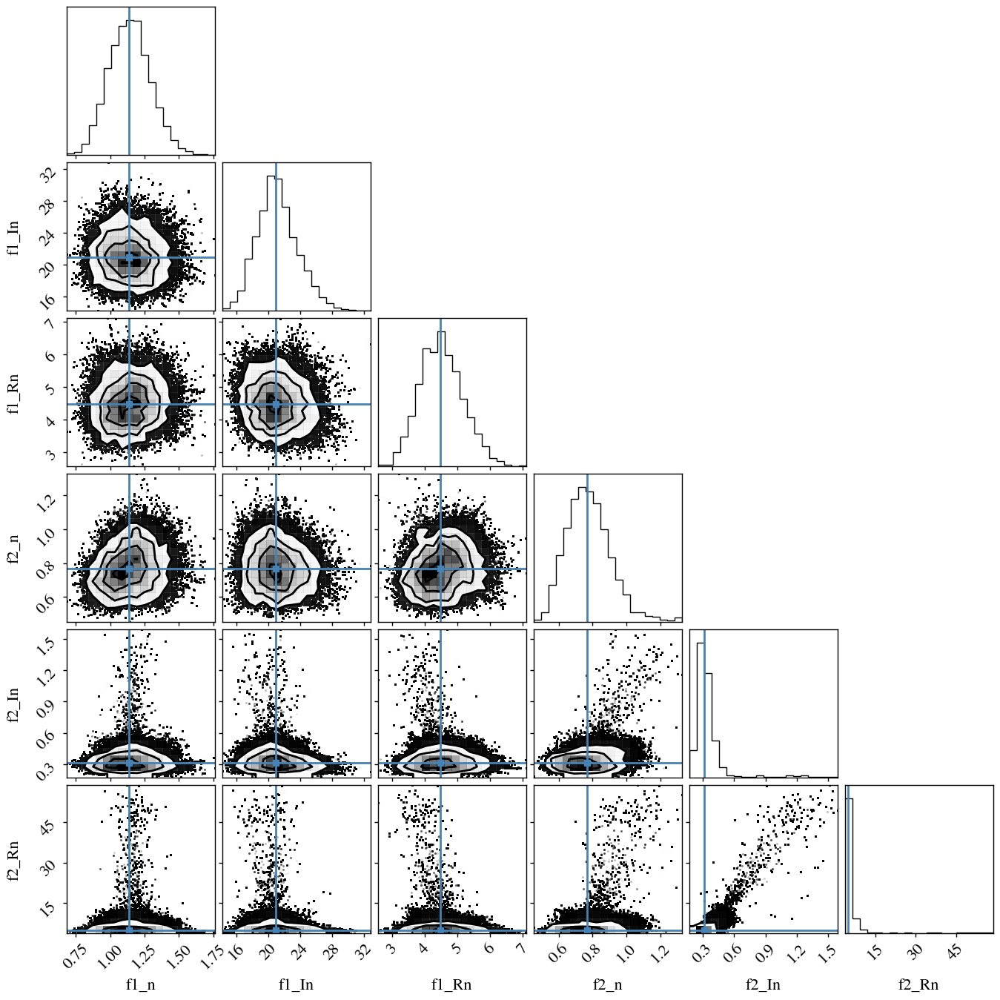

Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours
Too few points to create valid contours


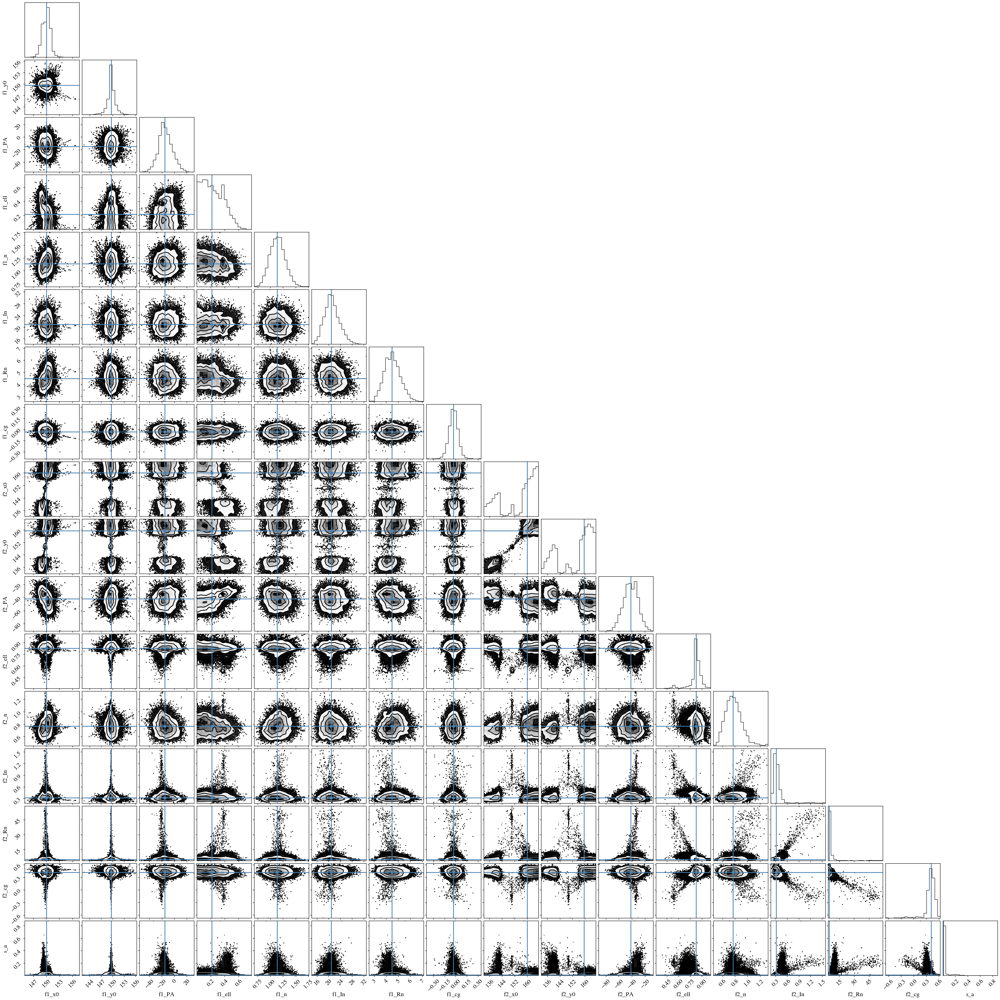

In [108]:
# Compute the median and 1-sigma error bars for each parameter
samples = sampler.get_chain(discard=1500, flat=True)
params = result_mini.params.copy()
params_median = np.median(samples, axis=0)
params_err_minus = np.percentile(samples, 16, axis=0) - params_median
params_err_plus = np.percentile(samples, 84, axis=0) - params_median
params_err = 0.5 * (params_err_minus + params_err_plus)

# Print the results
for i, param_name in enumerate(params):
    print(f"{param_name} = {params_median[i]} +/- {params_err[i]}")

idx_cut = [] # only select n, In and Rn parameters
for i in range(0, n_components_new):
    idx_cut.append(int(i * 8 + 4))
    idx_cut.append(int(i * 8 + 5))
    idx_cut.append(int(i * 8 + 6))


labels = [f"{param_name}" for param_name in params]
# Plot the corner plot
fig = corner.corner(samples[:,idx_cut], 
                    labels=np.asarray(labels)[idx_cut], 
                    truths=list(params_median[idx_cut]))

plt.show()

fig = corner.corner(samples[:,:], 
                    labels=np.asarray(labels), 
                    truths=list(params_median))

plt.show()

# # Plot the chains
# fig, axes = plt.subplots(len(idx_cut), figsize=(10, 27), sharex=True)
# labels = [f"{param_name}" for param_name in params]
# for i in range(0,len(idx_cut)):
# # for i in idx_cut:
#     ax = axes[i]
#     ax.plot(sampler.get_chain()[:, :, idx_cut[i]], color="k", alpha=0.1)
#     ax.set_xlim(0, len(sampler.get_chain()))
#     ax.set_ylabel(labels[idx_cut[i]])
# axes[-1].set_xlabel("Step")

## Lets work with the possibility that we need another additional component, on a larger scale. 

In [156]:
sources_photometies_new_3 = add_extra_component(sources_photometies_new,copy_from_id=2)
n_components_new3 = sources_photometies_new_3['ncomps']
print("# of components to be fitted =", n_components_new3)
sources_photometies_new_3

# of components to be fitted = 3


{'c1_PA': -40.74677392265625,
 'c1_q': 0.44783074044178695,
 'c1_area': 27391.0,
 'c1_Re': 93.37465444359198,
 'c1_x0c': 200.93729881498905,
 'c1_y0c': 200.9610470022825,
 'c1_label': 1,
 'c1_R50': 22.14522904580916,
 'c1_R20': 8.56631326265253,
 'c1_R80': 53.38047609521904,
 'c1_C1': 0.7945884907747589,
 'c1_Snu': 2785.580262913504,
 'c1_Rp': 55.5875175035007,
 'c1_Rpidx': 111,
 'c1_rlast': 187,
 'c1_I50': 0.28401531876229186,
 'ncomps': 3,
 'c2_PA': -40.74677392265625,
 'c2_q': 0.44783074044178695,
 'c2_area': 27391.0,
 'c2_Re': 93.37465444359198,
 'c2_x0c': 200.93729881498905,
 'c2_y0c': 200.9610470022825,
 'c2_label': 1,
 'c2_R50': 44.29045809161832,
 'c2_R20': 8.56631326265253,
 'c2_R80': 53.38047609521904,
 'c2_C1': 0.7945884907747589,
 'c2_Snu': 2785.580262913504,
 'c2_Rp': 55.5875175035007,
 'c2_Rpidx': 111,
 'c2_rlast': 187,
 'c2_I50': 0.14200765938114593,
 'c3_PA': -40.74677392265625,
 'c3_q': 0.44783074044178695,
 'c3_area': 27391.0,
 'c3_Re': 93.37465444359198,
 'c3_x0c': 2

In [161]:
# """
# Run the fitting again., with free Sersic indexes. 
# """
# ## We use 2 solver methods for better convergence. 
# save_name_append='_ls_n000'
# result_mini, mini,result_1,result_extra,model_dict, \
# image_results_conv,image_results_deconv,smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
#                                                    init_constraints=sources_photometies_new_3,psf_name=psf_name,
#                                                    params_values_init = None,#imfit_conf_values[0:-1],
# #                                                    fix_n = False,fix_x0_y0=[False,False,False],
#                                                    ncomponents=n_components_new3,constrained=True,
#                                                    fix_n=[False,False,False,False], #do not fix the n of the extra component
#                                                    fix_value_n = [0.5,0.5,0.5,None],fix_x0_y0=[True,True,True,True],dr_fix = [5,25,50,10],
#                                                    method1 = 'least_squares',method2 = 'least_squares',
#                                                    convolution_mode='GPU',fix_geometry=True,
#                                                    init_params = 0.25,final_params = 4.0,
#                                                    save_name_append=save_name_append)




"""
Run the fitting again, now including the additional component. 
For this run, we keep the sersic indeces fixed to 0.5 and 1.0. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n0'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, \
                    smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=None,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,self_bkg=True,rms_map=shuffle_2D(1*bkg_.back()),
                                                   fix_n=[False,False,True,True,True,True,False],
                                                   fix_value_n = [0.5,1.0,1.0, 1.0],fix_x0_y0=[True,True,True],dr_fix = [30,30,20],
                                                   # n_to_fix = [0.5,None,1.0,None]
                                                   convolution_mode='GPU',fix_geometry=False,workers=6,
                                                   #do not fix the n of the extra component
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

Using provided RMS map.
---------------------------------------
<<< PERFORMING CONVOLUTION WITH GPU >>>
---------------------------------------
Limiting  x0
Limiting  y0
Using general elliptical geometry during fitting... may take longer.
Limiting  x0
Limiting  y0
Using general elliptical geometry during fitting... may take longer.
Limiting  x0
Limiting  y0
Fixing Sersic Index of component 2  to 0.5.
Using general elliptical geometry during fitting... may take longer.
{'f1_x0': {'value': 200.93729881498905, 'min': 170.93729881498905, 'max': 230.93729881498905}, 'f1_y0': {'value': 200.9610470022825, 'min': 170.9610470022825, 'max': 230.9610470022825}, 'f1_PA': {'value': -40.74677392265625, 'min': -130.74677392265625, 'max': 49.25322607734375}, 'f1_ell': {'value': 0.552169259558213, 'min': 0.1656507778674639, 'max': 0.9}, 'f1_n': {'value': 0.5, 'min': 0.45, 'max': 4.0}, 'f1_In': {'value': 0.28401531876229186, 'min': 0.028401531876229187, 'max': 5.680306375245837}, 'f1_Rn': {'value': 22.1

      62             74         1.6660e+00      5.71e-08       3.01e-03       1.34e-02    
      63             84         1.6660e+00      0.00e+00       0.00e+00       1.34e-02    
`xtol` termination condition is satisfied.
Function evaluations 84, initial cost 6.2417e+02, final cost 1.6660e+00, first-order optimality 1.34e-02.
 >> Using least_squares  solver for second optimisation run... 
   Iteration     Total nfev        Cost      Cost reduction    Step norm     Optimality   
       0              1         1.6660e+00                                    1.34e-02    
       1              2         1.6660e+00      3.28e-06       8.18e-01       5.24e-01    
       2              3         1.6660e+00      1.09e-07       2.79e-01       1.64e-01    
       3              4         1.6660e+00      6.63e-06       6.75e-02       3.70e-02    
       4              5         1.6660e+00      1.57e-06       4.96e-02       7.87e-02    
       5              6         1.6660e+00      2.69e-06   

In [162]:
result_mini.params

name,value,standard error,relative error,initial value,min,max,vary
f1_x0,201.180610,8.4232e-04,(0.00%),201.18050062348837,170.937299,230.937299,True
f1_y0,200.572434,8.5740e-04,(0.00%),200.57239902842508,170.961047,230.961047,True
f1_PA,-43.4041942,0.06061099,(0.14%),-43.398355751875656,-130.746774,49.2532261,True
f1_ell,0.16565078,0.00175541,(1.06%),0.165650805896961,0.16565078,0.90000000,True
f1_n,1.06300193,0.00263134,(0.25%),1.0640462871261434,0.45000000,4.00000000,True
f1_In,1.88195969,0.01302692,(0.69%),1.8792818997666725,0.02840153,5.68030638,True
f1_Rn,6.34526163,0.03540217,(0.56%),6.361414159648071,4.42904581,44.2904581,True
f1_cg,0.14691430,0.00460531,(3.13%),0.14764616232726446,-2.00000000,2.00000000,True
f2_x0,201.065191,0.00471377,(0.00%),201.06523561253792,170.937299,230.937299,True
f2_y0,200.672358,0.00456633,(0.00%),200.67343555256093,170.961047,230.961047,True


Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender
Imported cmasher for density maps.If you would like to use, examples:CM = cmr.ember,CM = cmr.flamingo,CM = cmr.gothicCM = cmr.lavender


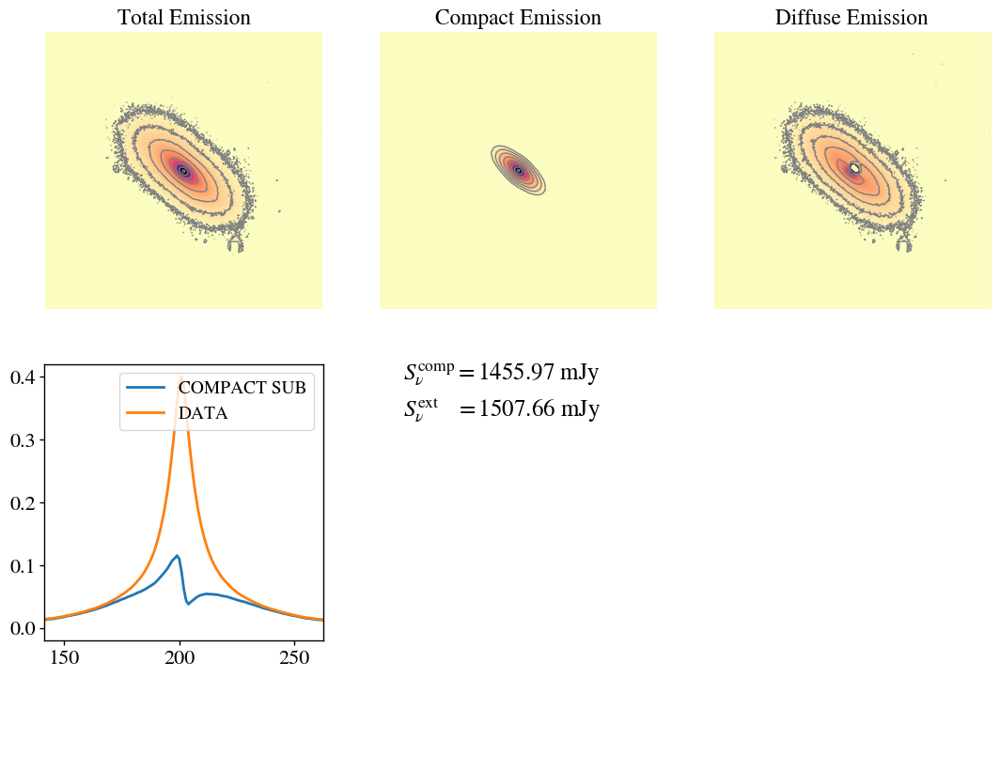

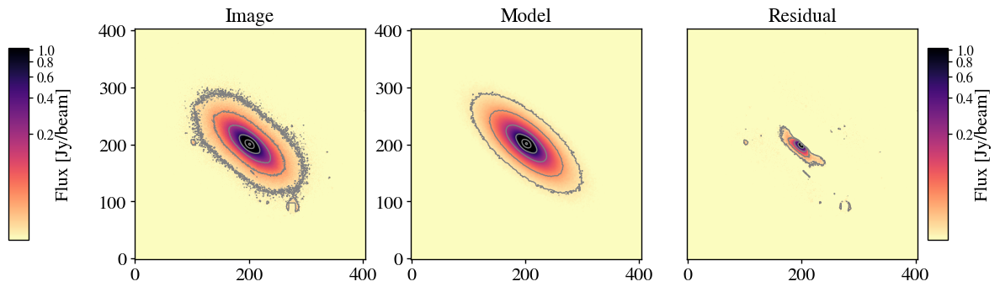

Peak Pos= [201 201]


/home/sagauga/pCloudDrive/PhD/GitHub/morphen/image_decomposition/libs.py:3204: RuntimeWarning: invalid value encountered in true_divide
  radial_prof = np.histogram(r, bins, weights=(image * weights * mask))[0] / \
/home/sagauga/pCloudDrive/PhD/GitHub/morphen/image_decomposition/libs.py:7512: UserWarning: Attempt to set non-positive ylim on a log-scaled axis will be ignored.
  plt.ylim(1e-7, -0.05 * np.log(ir[0]))


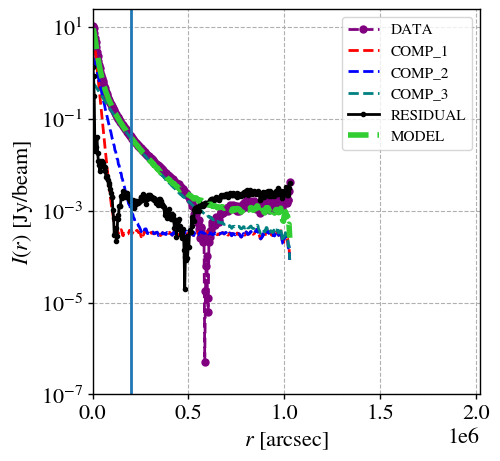

NameError: name 'crop_residual' is not defined

In [163]:
special_name = '_'+str(n_components_new3)+'C'+save_name_append


plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv']+1*model_dict['model_c2_conv']+0*model_dict['model_c3_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,
                 crop=False,box_size=200,
                 vmax_factor=0.5,vmin_factor=1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)

In [ ]:
result_mini

In [ ]:
eimshow(model_dict['model_c1'],vmin_factor=5)

In [ ]:
eimshow(model_dict['model_c1_conv'],vmin_factor=5)

# Now, estimate multi-component statistics
Now, since we have the minimization results (best parameters, number of components and associated errors) we can do many things.
First, since the errors of parameters can induce different values for the total fluxes on the models, we may need to 
run a second approach to proper estimate what are the errors on the total flux due to these uncertainties. 
This is critical if we want to disentangle the diffuse emission from the compact. 

$\rm MCMC$ <br>
We perform a simple MCMC simulation to propagate those errors to the total flux as well the total flux of each individual component and to the residuals.

$\rm \bf Multi\ Component \ Characteristics$ <br>

Since we have our radio emission decomposed into multiple components, we can extract properties for each one of these, such as sizes, etc. 
We also have our deconvolved component models, which are the best-component models before the convolution. From this we can establish what are the minimum limiting sizes of our radio structures.

The function call bellow will deal with this. 

In [ ]:
samples,sampler = run_mcmc_mini(crop_image,crop_residual,psf_name,result_mini)

In [ ]:
ndim

In [ ]:

labels = [f"{param_name}" for param_name in params]
# Plot the corner plot
fig = corner.corner(samples[:,idx_cut], 
                    labels=np.asarray(labels)[idx_cut], 
                    truths=list(params_median[idx_cut]))

plt.show()

# Plot the chains
fig, axes = plt.subplots(len(idx_cut), figsize=(10, 27), sharex=True)
labels = [f"{param_name}" for param_name in params]
for i in range(0,len(idx_cut)):
# for i in idx_cut:
    ax = axes[i]
    ax.plot(sampler.get_chain()[:, :, idx_cut[i]], color="k", alpha=0.1)
    ax.set_xlim(0, len(sampler.get_chain()))
    ax.set_ylabel(labels[idx_cut[i]])
axes[-1].set_xlabel("Step")


In [ ]:

labels = [f"{param_name}" for param_name in params]
# Plot the corner plot
fig = corner.corner(samples, 
                    labels=np.asarray(labels), 
                    truths=list(params_median))

plt.show()

In [ ]:

# imagename = crop_image
# residualname = crop_residual
# residual_2D = pf.getdata(residualname)
# residual_2D_shuffled = shuffle_2D(residual_2D)
# print('Using clean background for optmization...')
# #         background = residual_2D #residual_2D_shuffled
# background = jnp.array(residual_2D_shuffled)
# data_2D_gpu = jnp.array(pf.getdata(imagename))
# PSF_BEAM = jnp.array(ctn(psf_name))
# size = data_2D.shape
# xy = jnp.meshgrid(jnp.arange((size[1])), jnp.arange((size[0])))
# FlatSky_level_GPU = jnp.array(mad_std(data_2D))
# # nfunctions = 4
# @jit
# def convolve_on_gpu(image, psf):
#     image_fft = fft2(image)
#     psf_fft = fft2(psf)
#     conv_fft = image_fft * psf_fft
#     return fftshift(jnp.real(ifft2(conv_fft)))

# @jit
# def log_likelihood(params):
#     dict_model = {}
# #     model = 0
#     random_params = jnp.array(list(params.valuesdict().values()))
#     for i in range(1, nfunctions + 1):
#         mcmc_params = random_params[int(8 * (i - 1)):int(8 * (i))]
# #         model = model + sersic2D_GPU(xy, params['f' + str(i) + '_x0'].value,
# #                                      params['f' + str(i) + '_y0'].value,
# #                                      params['f' + str(i) + '_PA'].value,
# #                                      params['f' + str(i) + '_ell'].value,
# #                                      params['f' + str(i) + '_n'].value,
# #                                      params['f' + str(i) + '_In'].value,
# #                                      params['f' + str(i) + '_Rn'].value,
# #                                      params['f' + str(i) + '_cg'].value)
# #     # print(model.shape)
# #     model = FlatSky(FlatSky_level_GPU,
# #                             params['s_a'].value) + background
#         model = sersic2D_GPU(xy,
#                               mcmc_params[0],
#                               # params['f' + str(i) + '_x0'],
#                               mcmc_params[1],
#                               # params['f' + str(i) + '_y0'],
#                               mcmc_params[2],
#                               # params['f' + str(i) + '_PA'],
#                               mcmc_params[3],
#                               # params['f' + str(i) + '_ell'],
#                               mcmc_params[4],  # params['f' + str(i) + '_n'],
#                               mcmc_params[5],
#                               # params['f' + str(i) + '_In'],
#                               mcmc_params[6],
#                               # params['f' + str(i) + '_Rn'],
#                               mcmc_params[7]) + background / ncomponents + \
#                      FlatSky(FlatSky_level, random_params[-1]) / ncomponents
    
#     MODEL_2D_conv = convolve_on_gpu(model, PSF_BEAM)
#     residual = data_2D_gpu - MODEL_2D_conv
#     chi2 = jnp.sum(residual ** 2 / MODEL_2D_conv)
#     dof = len(model) - len(params)
#     log_like = -0.5 * (chi2 + dof * jnp.log(2 * jnp.pi))
# #     return (np.asarray(log_like).copy())
#     return (log_like)

# @jit
# def ln_prob(p, params):
#     # Calculate log-prior probability
#     log_prior_prob = log_prior(p, params)
#     if jnp.isinf(log_prior_prob):
#         return log_prior_prob
    
#     # Update parameter values based on proposed step
#     for i, (param_name, param) in enumerate(params.items()):
#         param.value = p[i]

    
#     log_likelihood_prob = log_likelihood(params)
#     return log_prior_prob + log_likelihood_prob
# @jit
# def log_prior(p, params):
#     for i, (param_name, param) in enumerate(params.items()):
#         if (p[i] < param.min or p[i] > param.max):
#             return -jnp.inf  # Return negative infinity for out-of-bounds parameters
#     return 0.0  # Return zero for in-bounds parameters


# # Define the log-posterior function for the MCMC
# @jit
# def log_posterior(params):
#     lp = log_prior(params)
#     if not jnp.isfinite(lp):
#         return -jnp.inf  # Return negative infinity for out-of-bounds parameters
#     return lp + log_likelihood(params)



# def compute_model_stats_CPU(mini_results, imagename, residualname,psf_name,
#                         ncomponents, num_simulations=2000,
#                         sigma = 6, iterations = 2,max_pool=6,
#                         save_results=False, special_name=''):
#     """
#     Function to run a Monte Carlo simulation from the best optmized fit parameters.
#     This can be used to expand the range where parameters erros are computed as well
#     compute a proper error for the total flux on the model.
#     Be aweare that this function is compuing expensive as it requires to
#     run a 2D convolution on each iteration. However, this function is optmized to run
#     on multiple threads.

#     PS. GPU is not working if running on multi-thread.
#     """
#     convolution_mode = 'CPU'
#     import multiprocessing
#     params = mini_results.params
#     BA = beam_area2(imagename)
#     data_2D = ctn(imagename)
#     residual_2D = ctn(residualname)
#     residual_2D_shuffled = shuffle_2D(residual_2D)
#     background = residual_2D_shuffled
#     model_temp = Model(sersic2D)
#     PSF_BEAM_raw = ctn(psf_name)

#     if convolution_mode == 'GPU':
#         PSF_BEAM = cp.asarray(PSF_BEAM_raw)
#     if convolution_mode == 'CPU':
#         PSF_BEAM = PSF_BEAM_raw

#     omaj, omin, _, _, _ = beam_shape(imagename)
#     dilation_size = int(np.sqrt(omaj * omin) / (2 * get_cell_size(imagename)))
#     _, mask = mask_dilation(imagename, sigma=sigma, iterations=iterations,
#                                 dilation_size=dilation_size, PLOT=True)

#     values = mini_results.params.valuesdict()
#     stderr = np.asarray(
#         [mini_results.params[name].stderr for name in values.keys()])
#     #     dfstderr = pd.DataFrame({'value': list(values.values()), 'stderr': stderr},
#     #                       index=values.keys())
#     params_values = np.asarray(list(values.values()))
#     #     random_params = generate_random_params(params_values,stderr)

#     size = ctn(imagename).shape
#     FlatSky_level = mad_std(data_2D)
#     xy = np.meshgrid(np.arange((size[0])), np.arange((size[1])))
#     model_dict = {}
#     image_results_conv = []
#     image_results_deconv = []

#     #     num_simulations = 50

#     # Generate a set of random parameters for each simulation and compute the total flux
#     #     total_fluxes = []
#     #     random_params_list = []
#     print('Running MCMC on best-fit parameters (using cpu).')

#     def mcmc_sim(random_params):
#         #         params_values, stderr = params_result
#         #     for l in tqdm(range(num_simulations)):
#         #         random_params_list.append(random_params)
#         model = 0
#         #         model_comps = []
#         sub_com_res_results = np.zeros(ncomponents)
#         sub_com_flux_results = np.zeros(ncomponents)
#         for i in range(1, ncomponents + 1):
#             mcmc_params = random_params[int(8 * (i - 1)):int(8 * (i))]
#             model_temp = sersic2D(xy,
#                                   mcmc_params[0],
#                                   # params['f' + str(i) + '_x0'],
#                                   mcmc_params[1],
#                                   # params['f' + str(i) + '_y0'],
#                                   mcmc_params[2],
#                                   # params['f' + str(i) + '_PA'],
#                                   mcmc_params[3],
#                                   # params['f' + str(i) + '_ell'],
#                                   mcmc_params[4],  # params['f' + str(i) + '_n'],
#                                   mcmc_params[5],
#                                   # params['f' + str(i) + '_In'],
#                                   mcmc_params[6],
#                                   # params['f' + str(i) + '_Rn'],
#                                   mcmc_params[7]) + background / ncomponents + \
#                          FlatSky(FlatSky_level, random_params[-1]) / ncomponents
#             # print(model_temp[0])
#             model_temp_dec = model_temp
#             model_temp_conv = scipy.signal.fftconvolve(model_temp_dec, PSF_BEAM,
#                                                        'same')
#             #             model_comps.append(model_temp_conv)
#             model = model + model_temp_conv
#             total_flux_comp_i = np.sum(model_temp_conv * mask) / BA
#             sub_com_flux_results[i - 1] = total_flux_comp_i

#             total_res_flux_sub_comp_i = np.sum((data_2D - model) * mask) / BA
#             sub_com_res_results[i - 1] = total_res_flux_sub_comp_i
            
#         model_total_conv = model
#         total_flux_random_model = np.sum(model_total_conv * mask) / BA
#         residual_model = np.sum(((data_2D - model_total_conv) * mask) ** 2.0)
#         residual_nrss_model = calc_nrss(data_2D * mask, model_total_conv * mask)

#         if np.isnan(total_flux_random_model) == True:
#             good_model = False
#         else:
#             good_model = True

#         #         total_fluxes.append(total_flux_random_model)
#         return (
#         total_flux_random_model, good_model, residual_model, residual_nrss_model,
#         sub_com_flux_results, sub_com_res_results)

#     from multiprocess import Pool
#     # from magic_functions import process_frame
#     max_pool = max_pool
#     #     params_result = params_values, stderr
#     random_params_list = []
#     for i in range(num_simulations):
#         random_params = generate_random_params(params_values, stderr)
#         random_params_list.append(random_params)
#     random_params_list = np.asarray(random_params_list)

#     with Pool(max_pool) as p:
#         results = list(
#             tqdm(
#                 p.imap(mcmc_sim, random_params_list),
#                 total=num_simulations
#             )
#         )

#     total_fluxes_all = []
#     residuals = []
#     residuals_nrss = []
#     flags = []
#     sub_comp_fluxes = []
#     sub_comp_residuals = []
#     for dict_temp in results:
#         total_fluxes_all.append(dict_temp[0])
#         flags.append(dict_temp[1])
#         residuals.append(dict_temp[2])
#         residuals_nrss.append(dict_temp[3])
#         sub_comp_fluxes.append(dict_temp[4])
#         sub_comp_residuals.append(dict_temp[5])

#     total_fluxes_all = np.asarray(total_fluxes_all)
#     flags = np.asarray(flags)
#     residuals = np.asarray(residuals)
#     residuals_nrss = np.asarray(residuals_nrss)
#     sub_comp_fluxes = np.asarray(sub_comp_fluxes)[flags]
#     sub_comp_residuals = np.asarray(sub_comp_residuals)[flags]

#     total_fluxes = total_fluxes_all[flags]
#     random_params_list = random_params_list[flags]
#     residuals = residuals[flags]
#     residuals_nrss = residuals_nrss[flags]

#     add_flags = np.where(abs(total_fluxes) > 100 * mad_std(abs(total_fluxes)))[0]
    
#     total_fluxes = np.delete(total_fluxes, add_flags, axis=0)
#     random_params_list = np.delete(random_params_list, add_flags, axis=0)
#     residuals = np.delete(residuals, add_flags, axis=0)
#     residuals_nrss = np.delete(residuals_nrss, add_flags, axis=0)
#     sub_comp_fluxes = np.delete(sub_comp_fluxes, add_flags, axis=0)
#     sub_comp_residuals = np.delete(sub_comp_residuals, add_flags, axis=0)
    
    
#     mean_flux = np.mean(total_fluxes)
#     std_flux = np.std(total_fluxes)
#     print("Estimated total flux = %.4f +/- %.4f" % (mean_flux, std_flux))
#     #     labels_names = list(mini_results.params.valuesdict().keys())
#     #     #     labels = ["Parameter {}".format(i+1) for i in range(len(params))] + ["Total Flux"]
#     #     labels = ["Parameter "+i for i in labels_names] + ["Total Flux"]

#     data_results = np.column_stack([random_params_list, total_fluxes])
#     #     fig = corner.corner(data_results, labels=labels, quantiles=[0.16, 0.5, 0.84],
#     #                         show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})
#     #     fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)

#     #     model_dict['best_residual'] = data_2D - model_dict['model_total']
#     #     model_dict['best_residual_conv'] = data_2D - model_dict['model_total_conv']
#     return (
#     total_fluxes, random_params_list, data_results, residuals, residuals_nrss,
#     sub_comp_fluxes, sub_comp_residuals)


# def compute_model_stats_GPU(mini_results, imagename, residualname, psf_name,
#                             ncomponents, num_simulations=2000,
#                             sigma=6, iterations=2,
#                             save_results=False, special_name=''):
#     """
#     Function to run a Monte Carlo simulation from the best optmized fit parameters.
#     This can is used to  compute a proper error for the total flux on the model.
#     Be aweare that this function is computing expensive as it requires to
#     run a 2D convolution on each iteration. This function is optmized to run
#     on a CUDA GPU.
#     """
#     params = mini_results.params
#     BA = beam_area2(imagename)
#     data_2D_cpu = ctn(imagename)
#     data_2D = cp.asarray(data_2D_cpu)
#     residual_2D_cpu = ctn(residualname)
#     residual_2D = cp.asarray(residual_2D_cpu)
#     residual_2D_shuffled = shuffle_2D(residual_2D_cpu)
#     background = cp.asarray(residual_2D_shuffled)
#     model_temp = Model(sersic2D)
#     PSF_BEAM_raw = ctn(psf_name)

#     PSF_BEAM = cp.asarray(PSF_BEAM_raw)
#     omaj, omin, _, _, _ = beam_shape(imagename)
#     dilation_size = int(np.sqrt(omaj * omin) / (2 * get_cell_size(imagename)))
#     _, mask_cpu = mask_dilation(imagename, sigma=sigma, iterations=iterations,
#                                 dilation_size=dilation_size, PLOT=True)
#     mask = cp.asarray(mask_cpu)
#     values = mini_results.params.valuesdict()
#     stderr = np.asarray(
#         [mini_results.params[name].stderr for name in values.keys()])
#     #     dfstderr = pd.DataFrame({'value': list(values.values()), 'stderr': stderr},
#     #                       index=values.keys())
#     params_values = np.asarray(list(values.values()))
#     #     random_params = generate_random_params(params_values,stderr)

#     size = ctn(imagename).shape
#     FlatSky_level = mad_std(data_2D_cpu)
#     xy = cp.meshgrid(cp.arange((size[0])), cp.arange((size[1])))
#     model_dict = {}
#     image_results_conv = []
#     image_results_deconv = []

#     #     num_simulations = 50

#     # Generate a set of random parameters for each simulation and compute the total flux
#     #     total_fluxes = []
#     #     random_params_list = []
#     print('Running MCMC on best-fit parameters (using cuda gpu).')

#     def mcmc_sim(random_params):
#         #         params_values, stderr = params_result
#         #     for l in tqdm(range(num_simulations)):
#         #         random_params_list.append(random_params)
#         model = 0
#         #         model_comps = []
#         sub_com_res_results = cp.zeros(ncomponents)
#         sub_com_flux_results = cp.zeros(ncomponents)
#         for i in range(1, ncomponents + 1):
#             # 8 means that we have 8 parameters per model-component.
#             # e.g. In, Rn, n, q, c, PA, x0 and y0,
#             mcmc_params = random_params[int(8 * (i - 1)):int(8 * (i))]
#             model_temp = sersic2D(xy,
#                                   mcmc_params[0],
#                                   # params['f' + str(i) + '_x0'],
#                                   mcmc_params[1],
#                                   # params['f' + str(i) + '_y0'],
#                                   mcmc_params[2],
#                                   # params['f' + str(i) + '_PA'],
#                                   mcmc_params[3],
#                                   # params['f' + str(i) + '_ell'],
#                                   mcmc_params[4],  # params['f' + str(i) + '_n'],
#                                   mcmc_params[5],
#                                   # params['f' + str(i) + '_In'],
#                                   mcmc_params[6],
#                                   # params['f' + str(i) + '_Rn'],
#                                   mcmc_params[7]) + background / ncomponents + \
#                          FlatSky(FlatSky_level, random_params[-1]) / ncomponents
#             # print(model_temp[0])
#             model_temp_dec = model_temp
#             model_temp_conv = cupyx.scipy.signal.fftconvolve(model_temp_dec,
#                                                              PSF_BEAM, 'same')
#             cp.cuda.Stream.null.synchronize()
#             #             model_comps.append(model_temp_conv)
#             model = model + model_temp_conv
#             total_flux_comp_i = cp.sum(model_temp_conv * mask) / BA
#             sub_com_flux_results[i - 1] = total_flux_comp_i

#             total_res_flux_sub_comp_i = cp.sum((data_2D - model) * mask) / BA
#             sub_com_res_results[i - 1] = total_res_flux_sub_comp_i

#         model_total_conv = model 
#         total_flux_random_model = cp.sum(model_total_conv * mask) / BA
#         residual_model = cp.sum(((data_2D - model_total_conv) * mask) ** 2.0)
#         residual_nrss_model = calc_nrss(data_2D * mask, model_total_conv * mask)

#         if np.isnan(total_flux_random_model) == True:
#             good_model = False
#         else:
#             good_model = True

#         #         total_fluxes.append(total_flux_random_model)
#         return (
#             total_flux_random_model, good_model, residual_model,
#             residual_nrss_model,
#             sub_com_flux_results, sub_com_res_results)

#     random_params_list = []
#     for i in range(num_simulations):
#         random_params = generate_random_params(params_values, stderr)
#         random_params_list.append(random_params)
#     random_params_list = np.asarray(random_params_list)

#     #     with Pool(max_pool) as p:
#     #         results = list(
#     #             tqdm(
#     #                 p.imap(mcmc_sim,random_params_list),
#     #                 total=num_simulations
#     #             )
#     #         )

#     results = []
#     for i in tqdm(range(len(random_params_list))):
#         results.append(mcmc_sim(random_params_list[i]))
    
#     total_fluxes_all_gpu = []
#     residuals_gpu = []
#     residuals_nrss_gpu = []
#     flags_gpu = []
#     sub_comp_fluxes_gpu = []
#     sub_comp_residuals_gpu = []
#     for dict_temp in results:
#         total_fluxes_all_gpu.append(dict_temp[0])
#         flags_gpu.append(dict_temp[1])
#         residuals_gpu.append(dict_temp[2])
#         residuals_nrss_gpu.append(dict_temp[3])
#         sub_comp_fluxes_gpu.append(dict_temp[4])
#         sub_comp_residuals_gpu.append(dict_temp[5])

#     total_fluxes_all = cp.asarray(total_fluxes_all_gpu).get()
#     flags = cp.asarray(flags_gpu).get()
#     residuals = cp.asarray(residuals_gpu).get()
#     residuals_nrss = cp.asarray(residuals_nrss_gpu).get()
#     sub_comp_fluxes = cp.asarray(sub_comp_fluxes_gpu).get()[flags]
#     sub_comp_residuals = cp.asarray(sub_comp_residuals_gpu).get()[flags]

#     total_fluxes = total_fluxes_all[flags]
#     random_params_list = random_params_list[flags]
#     residuals = residuals[flags]
#     residuals_nrss = residuals_nrss[flags]
#     add_flags = np.where(abs(total_fluxes) > 100 * mad_std(abs(total_fluxes)))[0]
#     total_fluxes = np.delete(total_fluxes, add_flags, axis=0)
#     random_params_list = np.delete(random_params_list, add_flags, axis=0)
#     residuals = np.delete(residuals, add_flags, axis=0)
#     residuals_nrss = np.delete(residuals_nrss, add_flags, axis=0)
#     sub_comp_fluxes = np.delete(sub_comp_fluxes, add_flags, axis=0)
#     sub_comp_residuals = np.delete(sub_comp_residuals, add_flags, axis=0)
    
#     mean_flux = np.mean(total_fluxes)
#     std_flux = np.std(total_fluxes)
#     print("Estimated total flux = %.4f +/- %.4f" % (mean_flux, std_flux))
#     labels_names = list(mini_results.params.valuesdict().keys())
#     #     labels = ["Parameter {}".format(i+1) for i in range(len(params))] + ["Total Flux"]
#     labels = ["Parameter " + i for i in labels_names] + ["Total Flux"]

#     data_results = np.column_stack([random_params_list, total_fluxes])
#     #     fig = corner.corner(data_results, labels=labels, quantiles=[0.16, 0.5, 0.84],
#     #                         show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})
#     #     fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)

#     #     model_dict['best_residual'] = data_2D - model_dict['model_total']
#     #     model_dict['best_residual_conv'] = data_2D - model_dict['model_total_conv']
#     return (
#         total_fluxes, random_params_list, data_results, residuals,
#         residuals_nrss,
#         sub_comp_fluxes, sub_comp_residuals)

# #     return(total_fluxes)

# def compute_multi_component_analysis(imagename,
#                                      image_results_deconv,
#                                      image_results_conv, n_components,
#                                      compact_flux_ids,plot=False,
#                                      merged_dict={}):
#     """
#     This function handles to perform a multi-component analysis of the results
#     coming from the image fitting. What it does:
#         - Compute the petrosian properties of each individual component,
#           both the convolved and deconvolved ones
#         - Compute the petrosian properties of the full model, convolved and
#           deconvolved
#         - Compute the petrosian properties of the compact structure, convolved
#           and deconvolved
#         - Compute the petrosian properties of the extended emission (convolved only)
#     Everything is stored into a dictionary that it is returned at the end.

#     """
#     import re
#     omaj, omin, _, _, _ = beam_shape(imagename)
#     dilation_size = int(np.sqrt(omaj * omin) / (2 * get_cell_size(imagename)))

#     _, mask = mask_dilation(imagename, sigma=7, iterations=2,
#                             dilation_size=dilation_size, PLOT=False)

#     """
#     Calculate the petrosian properties for each individual 
#     deconvolved component.
#     """
#     dec_model_petro_properties = {}
#     for k in range(n_components):
#         model_petro_properties = compute_petro_source(
#             ctn(image_results_deconv[k]), mask_component=mask, sigma_level=1,
#             i=k, plot=plot, source_props=dec_model_petro_properties)

#     # rename names stored on dictionary
#     dec_model_petro_properties_new = {}
#     pattern = r'c(\d+)_(.*)'
#     replacement = r'c\1_deconv_\2'

#     for key, value in dec_model_petro_properties.items():
#         new_key = re.sub(pattern, replacement, key)
#         dec_model_petro_properties_new[new_key] = value

#     """
#     Calculate the petrosian properties for each individual 
#     convolved component.
#     """

#     conv_model_petro_properties = {}
#     for k in range(n_components):
#         conv_model_petro_properties = compute_petro_source(
#             ctn(image_results_conv[k]), mask_component=mask, sigma_level=1,
#             i=k, plot=plot, source_props=conv_model_petro_properties)

#     # rename names stored on dictionary
#     conv_model_petro_properties_new = {}
#     pattern = r'c(\d+)_(.*)'
#     replacement = r'c\1_conv_\2'

#     for key, value in conv_model_petro_properties.items():
#         new_key = re.sub(pattern, replacement, key)
#         conv_model_petro_properties_new[new_key] = value

#     """
#     Calculate the petrosian properties for the full deconvolved model.
#     """
#     deconv_model_petro_props = compute_petro_source(
#         ctn(image_results_deconv[-1]), mask_component=mask, sigma_level=1,
#         i=0, plot=plot, source_props={})

#     deconv_model_petro_props_new = {}
#     pattern = r'c(\d+)_(.*)'
#     replacement = r'source_deconv_\2'

#     for key, value in deconv_model_petro_props.items():
#         new_key = re.sub(pattern, replacement, key)
#         deconv_model_petro_props_new[new_key] = value

#     """
#     Calculate the petrosian properties for the full convolved model.
#     """
#     conv_model_petro_props = compute_petro_source(ctn(image_results_conv[-2]),
#                                                   mask_component=mask,
#                                                   sigma_level=1,
#                                                   i=0, plot=plot,
#                                                   source_props={})

#     conv_model_petro_props_new = {}
#     pattern = r'c(\d+)_(.*)'
#     replacement = r'source_conv_\2'

#     for key, value in conv_model_petro_props.items():
#         new_key = re.sub(pattern, replacement, key)
#         conv_model_petro_props_new[new_key] = value

#     #
#     """
#     Now, lets estimate the total compact flux.
#     """
#     compact_model_conv = 0
#     compact_model_deconv = 0
#     for k in compact_flux_ids:
#         compact_model_conv = compact_model_conv + ctn(image_results_conv[k])
#         compact_model_deconv = compact_model_deconv + ctn(
#             image_results_deconv[k])
#     #
#     # """
#     # Then, compute the petrosian properties for the
#     # compact model (in this case, convolved.)
#     # """
#     # # compute Petrosian information for the compact emission alone
#     # compact_conv_petro_props = compute_petro_source(compact_model_conv,
#     #                                                 mask_component=mask,
#     #                                                 sigma_level=1,
#     #                                                 i=0, plot=plot,
#     #                                                 source_props={})
#     #
#     # compact_conv_petro_props_new = {}
#     # pattern = r'c(\d+)_(.*)'
#     # replacement = r'compact_conv_\2'
#     #
#     # for key, value in compact_conv_petro_props.items():
#     #     new_key = re.sub(pattern, replacement, key)
#     #     compact_conv_petro_props_new[new_key] = value
#     #
#     # """
#     # Then, compute the petrosian properties for the
#     # compact model (in this case, deconvolved.)
#     # """
#     # # compute Petrosian information for the compact emission alone
#     # compact_deconv_petro_props = compute_petro_source(compact_model_deconv,
#     #                                                   mask_component=mask,
#     #                                                   sigma_level=1,
#     #                                                   i=0, plot=plot,
#     #                                                   source_props={})
#     #
#     # compact_deconv_petro_props_new = {}
#     # pattern = r'c(\d+)_(.*)'
#     # replacement = r'compact_deconv_\2'
#     #
#     # for key, value in compact_deconv_petro_props.items():
#     #     new_key = re.sub(pattern, replacement, key)
#     #     compact_deconv_petro_props_new[new_key] = value
#     #
#     # """
#     # Now, compute the petrosian properties for the extended emission alone.
#     # Note that the extended emission can be only be computed on the
#     # convolved image.
#     # """
#     # # compute Petrosian information for the extended emission alone

#     extended_emission = ctn(imagename) - compact_model_conv

#     extended_petro_props = compute_petro_source(extended_emission,
#                                                 mask_component=mask,
#                                                 sigma_level=1,
#                                                 i=0, plot=plot, source_props={})

#     extended_petro_props_new = {}
#     pattern = r'c(\d+)_(.*)'
#     replacement = r'extended_conv_\2'

#     for key, value in extended_petro_props.items():
#         new_key = re.sub(pattern, replacement, key)
#         extended_petro_props_new[new_key] = value

#     dicts_petro_list = [extended_petro_props_new,
#                         # petrosian properties for the extended emission
#                         # compact_deconv_petro_props_new,
#                         # properties for the compact deconvolved model
#                         # compact_conv_petro_props_new,
#                         # properties for the compact convolved model
#                         conv_model_petro_props_new,
#                         # properties for the full convolved model
#                         deconv_model_petro_props_new,
#                         # properties for the full deconvolved model
#                         conv_model_petro_properties_new,
#                         # individual components convolved properties
#                         dec_model_petro_properties_new]  # individual components deconvolved properties
#     #     merged_dict = {}
#     for d in dicts_petro_list:
#         merged_dict.update(d)
#     # now, store all measurements into a single table.
#     df_measures = pd.DataFrame.from_dict(merged_dict,
#                                          orient='index').T
#     return (merged_dict)


# def do_corner_plot(imagename,
#                    n_components,
#                    result_mini,
#                    random_params_list,
#                    total_fluxes,
#                    residuals,
#                    save_fig=True, show_plot=True, special_name=''):
#     idx_cut = []
#     for i in range(0, n_components):
#         idx_cut.append(int(i * 8 + 4))
#         idx_cut.append(int(i * 8 + 5))
#         idx_cut.append(int(i * 8 + 6))

#     #     # data_results_slice = np.column_stack([random_params_list[:, idx_cut], np.asarray(total_fluxes)*1000])
#     #     # fig = corner.corner(data_results_slice, labels=labels_slice, quantiles=[0.16, 0.5, 0.84],
#     #     #                     show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})
#     #     # fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)

#     #     data_results_slice = np.column_stack([random_params_list[:, idx_cut], np.asarray(total_fluxes)*1000, residuals])
#     #     fig = corner.corner(data_results_slice, labels=labels_slice, quantiles=[0.16, 0.5, 0.84],
#     #                         show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})

#     #     # Highlight the parameter values that correspond to the smallest residual
#     #     # for i in range(len(params)):
#     #     #     ax = fig.get_axes()[i]
#     #     #     ax.axvline(x=random_params_list[:, idx_cut][np.argmin(residuals)][i], color='red')

#     #     # for i in range(len(random_params_list[:, idx_cut])):
#     #     #         ax = fig.get_axes()[i]
#     #     #         ax.axvline(x=data_results_slice[np.argmin(data_results_slice[:, -1]), i], color='red')

#     #     for i in range(random_params_list[:, idx_cut].shape[1]):
#     #             ax = fig.get_axes()[i*(n_components_new*3+3)]
#     #             ax.axvline(x=random_params_list[:, idx_cut][opt_params_id][i], color='red')

#     #     # Display the plot
#     #     fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)
#     #     plt.show()
#     labels = np.asarray(list(result_mini.params.valuesdict().keys()))
#     labels_slice_names = labels[idx_cut]

#     labels_slice = ["" + i for i in labels_slice_names] + ["Total Flux",
#                                                            "Residual"]
#     opt_params_id = np.argmin(residuals)

#     data_results_slice = np.column_stack(
#         [random_params_list[:, idx_cut], np.asarray(total_fluxes) * 1000,
#          residuals])
#     fig = corner.corner(data_results_slice, labels=labels_slice,
#                         quantiles=[0.16, 0.5, 0.84],
#                         show_titles=True, title_kwargs={"fontsize": 12},
#                         label_kwargs={"fontsize": 12})

#     for i in range(random_params_list[:, idx_cut].shape[1]):
#         ax = fig.get_axes()[i * (n_components * 3 + 3)]
#         ax.axvline(x=random_params_list[:, idx_cut][opt_params_id][i],
#                    color='red')

#     # Display the plot
#     fig.suptitle("Monte Carlo Simulation", fontsize=16, y=1.0)
#     if save_fig == True:
#         plt.savefig(imagename.replace('.fits', '_mcmc' + special_name + '.jpg'),
#                     dpi=300, bbox_inches='tight')
#     if show_plot == True:
#         plt.show()
#     else:
#         plt.close()


# def estimate_decomposition_results(imagename, residualname, psf_name,
#                                    result_mini,
#                                    image_results_conv,
#                                    image_results_deconv,
#                                    n_components=None, plot=False,
#                                    special_name='', convolution_mode='CPU',
#                                    num_simulations=2000, max_pool=6,
#                                    compact_flux_ids=[0], ext_flux_ids=[0],
#                                    decomposition_results={}):
#     values = result_mini.params.valuesdict()
#     stderr = np.asarray(
#         [result_mini.params[name].stderr for name in values.keys()])
#     dfstderr = pd.DataFrame({'value': list(values.values()), 'stderr': stderr},
#                             index=values.keys())

#     if n_components is None:
#         n_components = int((stderr.shape[0] - 1) / 8)

#     #     omaj,omin , _, _, _ = beam_shape(imagename)
#     #     dilation_size = int(np.sqrt(omaj * omin) / (2*get_cell_size(imagename)))
#     #     dilation_size

#     #     _,mask = mask_dilation(imagename,sigma=7,iterations=2,
#     #                        dilation_size=dilation_size,PLOT=True)
#     #     total_flux(data2D = ctn(image_results_conv[-2]),
#     #                image = image_results_conv[-2],
#     #                mask = mask,
#     #                sigma=10,iterations=2,
#     #                dilation_size=10,
#     #                PLOT=False)
#     #     # pixel_values = ctn(image_results_conv[-2]).flatten()
#     #     pixel_values = ctn(crop_image).flatten()
#     #     variances = (pixel_values ** 2) *  (stderr.reshape(-1, 1) ** 2)

#     #     total_flux_model = 1000*total_flux(data2D = ctn(image_results_conv[-2]),
#     #                image = image_results_conv[-2],
#     #                mask = mask,
#     #                sigma=10,iterations=2,
#     #                dilation_size=10,
#     #                PLOT=False)
#     #     total_flux_model_error = 1000*np.sqrt(np.sum(variances))/beam_area2(crop_image)
#     #     print("Total flux: {:.4f} +/- {:.4f}".format(total_flux_model, total_flux_model_error))
#     """
#     Run a mcmc analysis to get flux error from model.
#     """

#     if convolution_mode == 'GPU':
#         total_fluxes, random_params_list, data_results, \
#             residuals, residuals_nrss, sub_comp_fluxes, \
#             sub_comp_residuals = compute_model_stats_GPU(
#             mini_results=result_mini,
#             imagename=imagename,
#             residualname=residualname,
#             psf_name=psf_name,
#             num_simulations=num_simulations,
#             ncomponents=n_components,
#             special_name=special_name)
#     if convolution_mode == 'CPU':
#         total_fluxes, random_params_list, data_results, \
#             residuals, residuals_nrss, sub_comp_fluxes, \
#             sub_comp_residuals = compute_model_stats_CPU(
#             mini_results=result_mini,
#             imagename=imagename,
#             residualname=residualname,
#             psf_name=psf_name,
#             max_pool=max_pool,
#             num_simulations=num_simulations,
#             ncomponents=n_components,
#             special_name=special_name)
# #     do_corner_plot(imagename=imagename,
# #                    n_components=n_components,
# #                    result_mini=result_mini,
# #                    random_params_list=random_params_list,
# #                    total_fluxes=total_fluxes,
# #                    residuals=residuals)

#     decomposition_results = {}
#     decomposition_results['#imagename'] = os.path.basename(imagename)
#     decomposition_results['fit_model_name'] = os.path.basename(
#         image_results_conv[-2])
#     decomposition_results = compute_multi_component_analysis(imagename=imagename,
#                                                              image_results_deconv=image_results_deconv,
#                                                              image_results_conv=image_results_conv,
#                                                              n_components=n_components,
#                                                              compact_flux_ids=compact_flux_ids,
#                                                              plot=plot,
#                                                              # the labels of the compact components.
#                                                              merged_dict=decomposition_results)

#     #     decomposition_results = {}
#     for k in range(n_components):
#         # flux on each component
#         decomposition_results['c' + str(k + 1) + '_flux'] = np.mean(
#             sub_comp_fluxes[:, k], axis=0)
#         # flux error on each component
#         decomposition_results['c' + str(k + 1) + '_flux_err'] = np.std(
#             sub_comp_fluxes[:, k], axis=0)
#         # accumulated residual flux
#         decomposition_results['c' + str(k + 1) + '_flux_res'] = np.mean(
#             sub_comp_residuals[:, k], axis=0)
#         # accumulated residual flux error
#         decomposition_results['c' + str(k + 1) + '_flux_res_err'] = np.std(
#             sub_comp_residuals[:, k], axis=0)

#     compact_flux = 0
#     for k in compact_flux_ids:
#         compact_flux = compact_flux + sub_comp_fluxes[:, k]

#     flux_comp = np.mean(compact_flux)
#     flux_comp_err = np.std(compact_flux)
#     ext_flux = 0
#     # for k in ext_flux_ids:
#     ext_flux = total_fluxes - compact_flux
#     flux_ext = np.mean(ext_flux)
#     flux_ext_err = np.std(ext_flux)
#     print('Compact Flux = ', flux_comp * 1000, '+/-', flux_comp_err * 1000,'mJy')
#     print('Extended Flux = ', flux_ext * 1000, '+/-', flux_ext_err * 1000, 'mJy')

#     decomposition_results['total_flux_res'] = np.mean(sub_comp_residuals[:, -1])
#     decomposition_results['total_flux_res_err'] = np.std(
#         sub_comp_residuals[:, -1])
#     decomposition_results['mean_flux'] = np.mean(total_fluxes)
#     decomposition_results['std_flux'] = np.std(total_fluxes)
#     decomposition_results['flux_comp'] = flux_comp
#     decomposition_results['flux_comp_err'] = flux_comp_err
#     decomposition_results['flux_ext'] = flux_ext
#     decomposition_results['flux_ext_err'] = flux_ext_err

#     df = pd.DataFrame.from_dict(decomposition_results, orient='index').T
#     df.to_csv(image_results_conv[-2].replace('.fits', '_decomposition.csv'),
#               header=True,
#               index=False)
#     return (decomposition_results, total_fluxes, data_results, \
#             residuals, residuals_nrss, sub_comp_fluxes, \
#             sub_comp_residuals)
# def generate_random_params(params, param_errors):
#     """
#     We generate a random parameter distribution with +/-3 sigma
#     from the BEST PARAMETERS obtained from the minimization problem
#     weighted  with their errors.
#     PS: This is not to compute the errors of the parameters, but to compute
#     the errors on the total flux, which is a complex calculation since multiple
#     parameters are at play. So, running a simple MCMC is enough to capture that.
#     """
#     # Generate a set of random numbers from a normal distribution with mean 0 and standard deviation 1
#     # try:
#     #     # Scale the random numbers by the standard errors of the parameters
#     param_errors_corr = param_errors.copy()
# #     for i in range(len(param_errors_corr)):
# #         if params[i] !=0:
# #             if abs(param_errors_corr[i]/params[i]) > 1.0:
# #                 param_errors_corr[i] = params[i] * 0.5
# #         else:
# #             param_errors_corr[i] = 0.0001
#     random_nums = np.random.normal(0.0, 1, size=len(params))
#     scaled_random_nums = random_nums * param_errors
#     # except:
#     #     # Scale the random numbers by q fraction of the actual the parameters.
#     #     # This works when the minimisation was done with nelder-mead, which
#     #     # does not contain standard errors.
#     #     random_nums = np.random.normal(0.0, 0.05, size=len(params))
#     #     scaled_random_nums = random_nums * params

#     random_params = params + scaled_random_nums
#     return random_params

In [ ]:
final_dict_results, total_fluxes, data_results, \
    residuals, residuals_nrss, sub_comp_fluxes, \
    sub_comp_residuals = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,psf_name=psf_name,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,
                                                    image_results_deconv=image_results_deconv,plot=True,convolution_mode='GPU',
                                                    n_components=None,special_name=special_name,
                                                    num_simulations = 5000,compact_flux_ids = [0],max_pool=8,
                                                    ext_flux_ids=[1],#[n_components - 2, -1]
                                                   )

In [ ]:
np.mean(sub_comp_fluxes[:,:],axis=0).sum()

In [ ]:
np.mean(total_fluxes)

For example, we may ask what are the convolved and deconvolved sizes of the most compact component? 
<br>

These are stored in the variables `compact_conv_Rp` and `compact_deconv_Rp`

In [ ]:
final_dict_results

In [ ]:
final_dict_results['compact_deconv_Rp'], final_dict_results['compact_conv_Rp']

We can also check the total model size (convolved and deconvolved)

In [ ]:
final_dict_results['source_deconv_Rp'], final_dict_results['source_conv_Rp']

In [ ]:
print(final_dict_results['c1_deconv_R50'], final_dict_results['c1_conv_R50'])
print(final_dict_results['c1_deconv_Rp'], final_dict_results['c1_conv_Rp'])


In [ ]:
result_mini

In [ ]:
imagename = crop_image
residualname = crop_residual
residual_2D = pf.getdata(residualname)
residual_2D_shuffled = shuffle_2D(residual_2D)
print('Using clean background for optmization...')
#         background = residual_2D #residual_2D_shuffled
background = residual_2D_shuffled
data_2D = pf.getdata(imagename)
PSF_BEAM = ctn(psf_name)

In [ ]:
size = data_2D.shape
xy = np.meshgrid(np.arange((size[1])), np.arange((size[0])))
FlatSky_level = mad_std(data_2D)
nfunctions = n_components_new

def residual_2D(params):
    dict_model = {}
    model = 0
    for i in range(1, nfunctions + 1):
        model = model + sersic2D(xy, params['f' + str(i) + '_x0'],
                                 params['f' + str(i) + '_y0'],
                                 params['f' + str(i) + '_PA'],
                                 params['f' + str(i) + '_ell'],
                                 params['f' + str(i) + '_n'],
                                 params['f' + str(i) + '_In'],
                                 params['f' + str(i) + '_Rn'],
                                 params['f' + str(i) + '_cg'], )
    # print(model.shape)
    model = model + FlatSky(FlatSky_level, params['s_a']) + background
    MODEL_2D_conv = scipy.signal.fftconvolve(model, PSF_BEAM, 'same')
    residual = data_2D - MODEL_2D_conv
    return (residual)


smodel2D, params = construct_model_parameters(
    params_values_init=None, n_components=nfunctions,
    init_constraints=sources_photometies_new,
    fix_n=[True,False,True,True,True,True,False], fix_value_n=[0.5,0.5,1.0, 1.0],
    fix_x0_y0=[True,True,True], dr_fix=[5,55,20], fix_geometry=True,
    init_params=0.25, final_params=4.0,
    constrained=True)

mini = lmfit.Minimizer(residual_2D, params, max_nfev=20000,
                       nan_policy='omit', reduce_fcn='neglogcauchy')

In [ ]:
result_1 = mini.minimize(method='least_squares',
                         max_nfev=30000, x_scale='jac',
                         tr_solver="exact",
                         tr_options={'regularize': True},
                         ftol=1e-12, xtol=1e-12, gtol=1e-12, verbose=2,
                         loss="cauchy")

In [ ]:
second_run_params = result_1.params
result = mini.minimize(method='least_squares', params=second_run_params,
                       max_nfev=30000,
                       tr_solver="exact",
                       tr_options={'regularize': True},
                       x_scale='jac',  # f_scale=0.5,
                       ftol=1e-12, xtol=1e-12, gtol=1e-12, verbose=2,
                       loss="cauchy")  # ,f_scale=0.5, max_nfev=5000, verbose=2)

In [ ]:
def log_likelihood(params):
    dict_model = {}
    model = 0
    for i in range(1, nfunctions + 1):
        model = model + sersic2D(xy, params['f' + str(i) + '_x0'],
                                 params['f' + str(i) + '_y0'],
                                 params['f' + str(i) + '_PA'],
                                 params['f' + str(i) + '_ell'],
                                 params['f' + str(i) + '_n'],
                                 params['f' + str(i) + '_In'],
                                 params['f' + str(i) + '_Rn'],
                                 params['f' + str(i) + '_cg'], )
    # print(model.shape)
    model = model + FlatSky(FlatSky_level, params['s_a']) + background
    MODEL_2D_conv = scipy.signal.fftconvolve(model, PSF_BEAM, 'same')
    residual = data_2D - MODEL_2D_conv
    chi2 = np.sum(residual ** 2 / MODEL_2D_conv)
    dof = len(model) - len(params)
    log_like = -0.5 * (chi2 + dof * np.log(2 * np.pi))
    return (log_like)

def ln_prob(p, params):
    # Calculate log-prior probability
    log_prior_prob = log_prior(p, params)
    if np.isinf(log_prior_prob):
        return log_prior_prob
    
    # Update parameter values based on proposed step
    for i, (param_name, param) in enumerate(params.items()):
        param.value = p[i]
    
    # Calculate log-likelihood probability
#     y_model = model_func(x, params)
#     log_likelihood_prob = -0.5 * np.sum(((y - y_model) / y_model)**2)
    
    log_likelihood_prob = log_likelihood(params)
    return log_prior_prob + log_likelihood_prob

def log_prior(p, params):
    for i, (param_name, param) in enumerate(params.items()):
        if (p[i] < param.min or p[i] > param.max):
            return -np.inf  # Return negative infinity for out-of-bounds parameters
    return 0.0  # Return zero for in-bounds parameters


# Define the log-posterior function for the MCMC
def log_posterior(params):
    lp = log_prior(params)
    if not np.isfinite(lp):
        return -np.inf  # Return negative infinity for out-of-bounds parameters
    return lp + log_likelihood(params)

In [ ]:
params = result.params
nwalkers = 2*len(params) 
ndim = len(params) 

In [ ]:
params

In [ ]:
stderr = [result.params[name].stderr for name in result.params.valuesdict().keys()]

In [ ]:
# p0 = []
# for i in range(nwalkers):
#     walker_params = []
#     for param_name in params:
#         param = params[param_name]
#         walker_params.append(param.value + 1 * np.random.randn())
#     p0.append(np.array(walker_params))
p0 = []
for i in range(nwalkers):
    walker_params = []
#     for param_name in params:
#         param = params[param_name]
#         walker_params.append(param.value + 1 * np.random.randn())
    random_params = generate_random_params(np.asarray(list(params.valuesdict().values())),stderr)
    p0.append(random_params)

In [ ]:
p0 = [np.array([params[param_name].value for param_name in params]) + 1 * np.random.randn(ndim) for i in range(nwalkers)]


In [ ]:
np.sum(p0[1]/params)/len(params)

In [ ]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, ln_prob, args=(params,), threads=8)

In [ ]:
def generate_random_params(params, param_errors):
    """
    We generate a random parameter distribution with +/-3 sigma
    from the BEST PARAMETERS obtained from the minimization problem
    weighted  with their errors.
    PS: This is not to compute the errors of the parameters, but to compute
    the errors on the total flux, which is a complex calculation since multiple
    parameters are at play. So, running a simple MCMC is enough to capture that.
    """
    # Generate a set of random numbers from a normal distribution with mean 0 and standard deviation 1
    # try:
    #     # Scale the random numbers by the standard errors of the parameters
    param_errors_corr = param_errors.copy()
    #     for i in range(len(param_errors_corr)):
    #         if params[i] !=0:
    #             if abs(param_errors_corr[i]/params[i]) > 1.0:
    #                 param_errors_corr[i] = params[i] * 0.5
    #         else:
    #             param_errors_corr[i] = 0.0001
    random_nums = np.random.normal(0.0, 15, size=len(params))
    scaled_random_nums = random_nums * param_errors
    # except:
    #     # Scale the random numbers by q fraction of the actual the parameters.
    #     # This works when the minimisation was done with nelder-mead, which
    #     # does not contain standard errors.
    #     random_nums = np.random.normal(0.0, 0.05, size=len(params))
    #     scaled_random_nums = random_nums * params

    random_params = params + scaled_random_nums
    return random_params

In [ ]:
from multiprocessing import Pool
burn_in_steps = 300  # Adjust as necessary
with Pool() as pool:
#     sampler = emcee.EnsembleSampler(nwalkers, ndim, log_prob, pool=pool)
    sampler = emcee.EnsembleSampler(nwalkers, ndim, ln_prob, args=(params,),pool=pool)
    start = time.time()
    pos, _, _ = sampler.run_mcmc(p0, burn_in_steps,progress=True)
    sampler.reset()
    production_steps = 1500
    sampler.run_mcmc(pos, production_steps,progress=True)
    samples = sampler.get_chain(discard=burn_in_steps, flat=True)


In [ ]:
# Compute the median and 1-sigma error bars for each parameter
params_median = np.median(samples, axis=0)
params_err_minus = np.percentile(samples, 16, axis=0) - params_median
params_err_plus = np.percentile(samples, 84, axis=0) - params_median
params_err = 0.5 * (params_err_minus + params_err_plus)

# Print the results
for i, param_name in enumerate(params):
    print(f"{param_name} = {params_median[i]} +/- {params_err[i]}")

In [ ]:
# Plot the chains
fig, axes = plt.subplots(ndim, figsize=(10, 7), sharex=True)
labels = [f"{param_name}" for param_name in params]
for i in range(ndim):
    ax = axes[i]
    ax.plot(sampler.get_chain()[:, :, i], color="k", alpha=0.1)
    ax.set_xlim(0, len(sampler.get_chain()))
    ax.set_ylabel(labels[i])
axes[-1].set_xlabel("Step")

# Plot the corner plot
fig = corner.corner(samples, labels=labels, truths=list(params_median))

plt.show()

In [ ]:
"""
Run the fitting again, now including the additional component. 
For this run, we keep the sersic indeces fixed to 0.5 and 1.0. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n00'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, \
                    smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new,constrained=True,
                                                   fix_n=[True,True,False,True,True,True,False],
                                                   fix_value_n = [0.5,1.0,1.0, 1.0],fix_x0_y0=[True,True,True],dr_fix = [5,25,45],
                                                   # n_to_fix = [0.5,None,1.0,None]
                                                   convolution_mode='CPU',fix_geometry=True,workers=6,
                                                   #do not fix the n of the extra component
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

In [ ]:
result_mini.params

In [ ]:
special_name = '_'+str(n_components_new)+'C'+save_name_append
plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv'] + 0*model_dict['model_c2_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new,
                 crop=False,box_size=200,
                 vmax_factor=0.3,vmin_factor=1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new)

In [ ]:
"""
Run the fitting again, now including the additional component. 
For this run, we keep the sersic indeces fixed to 0.5 and 1.0. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n01'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, \
                    smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new,constrained=True,
                                                   fix_n=[True,False,False,True,True,True,False],
                                                   fix_value_n = [0.5,0.5,1.0, 1.0],fix_x0_y0=[True,True,True],dr_fix = [5,25,45],
                                                   # n_to_fix = [0.5,None,1.0,None]
                                                   convolution_mode='CPU',fix_geometry=True,workers=6,
                                                   #do not fix the n of the extra component
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

In [ ]:
result_mini.params

In [ ]:
special_name = '_'+str(n_components_new)+'C'+save_name_append
plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv'] + 0*model_dict['model_c2_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new,
                 crop=False,box_size=200,
                 vmax_factor=0.3,vmin_factor=1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new)

# Now, estimate multi-component statistics
Now, since we have the minimization results (best parameters, number of components and associated errors) we can do many things.
First, since the errors of parameters can induce different values for the total fluxes on the models, we may need to 
run a second approach to proper estimate what are the errors on the total flux due to these uncertainties. 
This is critical if we want to disentangle the diffuse emission from the compact. 

$\rm MCMC$ <br>
We perform a simple MCMC simulation to propagate those errors to the total flux as well the total flux of each individual component and to the residuals.

$\rm \bf Multi\ Component \ Characteristics$ <br>

Since we have our radio emission decomposed into multiple components, we can extract properties for each one of these, such as sizes, etc. 
We also have our deconvolved component models, which are the best-component models before the convolution. From this we can establish what are the minimum limiting sizes of our radio structures.

The function call bellow will deal with this. 

In [ ]:
final_dict_results,total_fluxes, sub_comp_fluxes = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,psf_name=psf_name,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,
                                                    image_results_deconv=image_results_deconv,plot=True,convolution_mode='GPU',
                                                    n_components=None,special_name=special_name,
                                                    num_simulations = 10000,compact_flux_ids = [0,1],max_pool=8,
                                                    ext_flux_ids=[1],#[n_components - 2, -1]
                                                   )

For example, we may ask what are the convolved and deconvolved sizes of the most compact component? 
<br>

These are stored in the variables `compact_conv_Rp` and `compact_deconv_Rp`

In [ ]:
final_dict_results

In [ ]:
final_dict_results['compact_deconv_Rp'], final_dict_results['compact_conv_Rp']

We can also check the total model size (convolved and deconvolved)

In [ ]:
final_dict_results['source_deconv_Rp'], final_dict_results['source_conv_Rp']

In [ ]:
print(final_dict_results['c1_deconv_R50'], final_dict_results['c1_conv_R50'])
print(final_dict_results['c1_deconv_Rp'], final_dict_results['c1_conv_Rp'])


In [ ]:
result_mini

# HERE

In [ ]:
"""
Run the fitting again, now including the additional component. 
For this run, we keep the sersic indeces fixed to 0.5 and 1.0. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n101'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, \
                    smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new,constrained=True,
                                                   fix_n=[False,True,False,True,True,True,False],
                                                   fix_value_n = [0.5,0.5,1.0, 1.0],fix_x0_y0=[True,True,True],dr_fix = [5,5,45],
                                                   # n_to_fix = [0.5,None,1.0,None]
                                                   convolution_mode='CPU',fix_geometry=True,workers=6,
                                                   #do not fix the n of the extra component
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

In [ ]:
result_mini.params

In [ ]:
special_name = '_'+str(n_components_new)+'C'+save_name_append
plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv'] + 0*model_dict['model_c2_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new,
                 crop=False,box_size=200,
                 vmax_factor=0.3,vmin_factor=1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new)

# Now, estimate multi-component statistics
Now, since we have the minimization results (best parameters, number of components and associated errors) we can do many things.
First, since the errors of parameters can induce different values for the total fluxes on the models, we may need to 
run a second approach to proper estimate what are the errors on the total flux due to these uncertainties. 
This is critical if we want to disentangle the diffuse emission from the compact. 

$\rm MCMC$ <br>
We perform a simple MCMC simulation to propagate those errors to the total flux as well the total flux of each individual component and to the residuals.

$\rm \bf Multi\ Component \ Characteristics$ <br>

Since we have our radio emission decomposed into multiple components, we can extract properties for each one of these, such as sizes, etc. 
We also have our deconvolved component models, which are the best-component models before the convolution. From this we can establish what are the minimum limiting sizes of our radio structures.

The function call bellow will deal with this. 

In [ ]:
# reload_libs()

In [ ]:
final_dict_results, total_fluxes, data_results, \
    residuals, residuals_nrss, sub_comp_fluxes, \
    sub_comp_residuals = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,psf_name=psf_name,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,
                                                    image_results_deconv=image_results_deconv,plot=True,
                                                    n_components=n_components_new,special_name=special_name,convolution_mode='GPU',
                                                    num_simulations = 1000,compact_flux_ids = [0,1],
                                                    ext_flux_ids=[1],#[n_components - 2, -1]
                                                   )

In [ ]:
final_dict_results, total_fluxes, data_results, \
    residuals, residuals_nrss, sub_comp_fluxes, \
    sub_comp_residuals = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,psf_name=psf_name,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,
                                                    image_results_deconv=image_results_deconv,plot=True,
                                                    n_components=n_components_new,special_name=special_name,convolution_mode='GPU',
                                                    num_simulations = 10000,compact_flux_ids = [0],
                                                    ext_flux_ids=[1],#[n_components - 2, -1]
                                                   )

In [ ]:
np.std(residuals)

In [ ]:
tf = total_flux(data2D=ctn(crop_image),image=crop_image,mask=mask)
np.std(total_fluxes - tf)

In [ ]:
np.sum(sub_comp_fluxes,axis=1) - total_fluxes

In [ ]:
for kk in range(len(sub_comp_fluxes[0,:])):
    comp_flux = np.mean(sub_comp_fluxes[:,kk])
    comp_flux_err = np.std(sub_comp_fluxes[:,kk])
    print('Flux Component=',comp_flux*1000, '+/-',comp_flux_err*1000)

In [ ]:
residuallist

For example, we may ask what are the convolved and deconvolved sizes of the most compact component? 
<br>

These are stored in the variables `compact_conv_Rp` and `compact_deconv_Rp`

In [ ]:
xxx1 = np.asarray([[1,2,3],
                  [1,2,3],
                 [1,2,3],
                 [1,2,3]])

xxx2 = np.asarray([[3,2,3],
                  [1,2,3],
                 [8,3,3],
                 [9,2,3]])

In [ ]:
xxx1 - xxx2

In [ ]:
final_dict_results

In [ ]:
final_dict_results['compact_deconv_Rp'], final_dict_results['compact_conv_Rp']

We can also check the total model size (convolved and deconvolved)

In [ ]:
final_dict_results['source_deconv_Rp'], final_dict_results['source_conv_Rp']

In [ ]:
print(final_dict_results['c1_deconv_R50'], final_dict_results['c1_conv_R50'])
print(final_dict_results['c1_deconv_Rp'], final_dict_results['c1_conv_Rp'])


In [ ]:
result_mini

In [ ]:
df = pd.DataFrame.from_dict(sources_photometies_new, orient='index').T
# df.to_csv(imagename.replace('.fits', add_save_name+'_stats.csv'), header=True,
#           index=False)

## Lets work with the possibility that we need another additional component, on a larger scale. 

In [ ]:
sources_photometies_new_3 = add_extra_component(sources_photometies_new,copy_from_id=3)
n_components_new3 = sources_photometies_new_3['ncomps']
print("# of components to be fitted =", n_components_new3)
sources_photometies_new_3

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n0101'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv,smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,True,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5,1.0,None],fix_x0_y0=[True,True,True,True],dr_fix = [5,5,25,10],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   convolution_mode='CPU',fix_geometry=True,
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

In [ ]:
result_mini.params

In [ ]:
special_name = '_'+str(n_components_new)+'C'+save_name_append


plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv']+model_dict['model_c2_conv']+0*model_dict['model_c3_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,
                 crop=False,box_size=200,
                 vmax_factor=0.5,vmin_factor=1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)

In [ ]:
result_mini

In [ ]:
final_dict_results, total_flux, sub_comp_fluxes = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,psf_name=psf_name,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,convolution_mode='GPU',
                                                    image_results_deconv=image_results_deconv,plot=True,
                                                    n_components=n_components_new3,special_name=special_name,
                                                    num_simulations = 20000,compact_flux_ids = [0],
                                                    ext_flux_ids=[1],#[n_components - 2, -1]
                                                   )

In [ ]:
final_dict_results

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n011'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,False,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5,1.0,None],fix_x0_y0=[True,True,True,True],dr_fix = [5,45,60,60],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   convolution_mode='CPU',fix_geometry=True,
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

In [ ]:
result_mini.params

In [ ]:
special_name = '_'+str(n_components_new)+'C'+save_name_append


plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv']+model_dict['model_c2_conv']+0*model_dict['model_c3_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,
                 crop=False,box_size=200,
                 vmax_factor=0.5,vmin_factor=1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)

In [ ]:
result_mini

In [ ]:
final_dict_results = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,psf_name=psf_name,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,convolution_mode='CPU',
                                                    image_results_deconv=image_results_deconv,plot=True,
                                                    n_components=n_components_new3,special_name=special_name,
                                                    num_simulations = 2000,compact_flux_ids = [0,1],
                                                    ext_flux_ids=[1],#[n_components - 2, -1]
                                                   )

In [ ]:
final_dict_results

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n111'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[False,False,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5,1.0,None],fix_x0_y0=[True,True,True,True],dr_fix = [5,45,60,60],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   convolution_mode='CPU',fix_geometry=True,
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

In [ ]:
result_mini.params

In [ ]:
special_name = '_'+str(n_components_new)+'C'+save_name_append


plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv']+model_dict['model_c2_conv']+0*model_dict['model_c3_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,
                 crop=False,box_size=200,
                 vmax_factor=0.5,vmin_factor=1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)

In [ ]:
result_mini

In [ ]:
final_dict_results = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,psf_name=psf_name,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,convolution_mode='CPU',
                                                    image_results_deconv=image_results_deconv,plot=True,
                                                    n_components=n_components_new3,special_name=special_name,
                                                    num_simulations = 2000,compact_flux_ids = [0,1],
                                                    ext_flux_ids=[1],#[n_components - 2, -1]
                                                   )

In [ ]:
final_dict_results

In [ ]:
def estimate_decomposition_results(imagename, residualname,psf_name,
                                   result_mini,
                                   image_results_conv,
                                   image_results_deconv,
                                   n_components=None,plot=False,
                                   special_name='', convolution_mode='GPU',
                                   num_simulations=2000,
                                   compact_flux_ids=[0, 1], ext_flux_ids=[1, -1],
                                   decomposition_results={}):
    values = result_mini.params.valuesdict()
    stderr = np.asarray(
        [result_mini.params[name].stderr for name in values.keys()])
    dfstderr = pd.DataFrame({'value': list(values.values()), 'stderr': stderr},
                            index=values.keys())

    if n_components is None:
        n_components = int((stderr.shape[0] - 1) / 8)

    #     omaj,omin , _, _, _ = beam_shape(imagename)
    #     dilation_size = int(np.sqrt(omaj * omin) / (2*get_cell_size(imagename)))
    #     dilation_size

    #     _,mask = mask_dilation(imagename,sigma=7,iterations=2,
    #                        dilation_size=dilation_size,PLOT=True)
    #     total_flux(data2D = ctn(image_results_conv[-2]),
    #                image = image_results_conv[-2],
    #                mask = mask,
    #                sigma=10,iterations=2,
    #                dilation_size=10,
    #                PLOT=False)
    #     # pixel_values = ctn(image_results_conv[-2]).flatten()
    #     pixel_values = ctn(crop_image).flatten()
    #     variances = (pixel_values ** 2) *  (stderr.reshape(-1, 1) ** 2)

    #     total_flux_model = 1000*total_flux(data2D = ctn(image_results_conv[-2]),
    #                image = image_results_conv[-2],
    #                mask = mask,
    #                sigma=10,iterations=2,
    #                dilation_size=10,
    #                PLOT=False)
    #     total_flux_model_error = 1000*np.sqrt(np.sum(variances))/beam_area2(crop_image)
    #     print("Total flux: {:.4f} +/- {:.4f}".format(total_flux_model, total_flux_model_error))
    """
    Run a mcmc analysis to get flux error from model.
    """

    if convolution_mode == 'GPU':
        total_fluxes, random_params_list, data_results, \
            residuals, residuals_nrss, sub_comp_fluxes, \
            sub_comp_residuals = compute_model_stats_GPU(mini_results=result_mini,
                                                         imagename=imagename,
                                                         residualname=residualname,
                                                         psf_name=psf_name,
                                                         num_simulations=num_simulations,
                                                         ncomponents=n_components,
                                                         convolution_mode='CPU',
                                                         special_name=special_name)
    if convolution_mode == 'CPU':
        total_fluxes, random_params_list, data_results, \
            residuals, residuals_nrss, sub_comp_fluxes, \
            sub_comp_residuals = compute_model_stats(mini_results=result_mini,
                                                     imagename=imagename,
                                                     residualname=residualname,
                                                     psf_name=psf_name,
                                                     num_simulations=num_simulations,
                                                     ncomponents=n_components,
                                                     convolution_mode='CPU',
                                                     special_name=special_name)

    #     do_corner_plot(imagename,n_components,random_params_list,total_fluxes,residuals)
    decomposition_results = {}
    decomposition_results = {'#imagename': imagename}
    decomposition_results = {'#model_name':os.path.basename(image_results_conv[-2])}
    decomposition_results = {'#imagename': imagename}
    decomposition_results = {'imagename': imagename}
    decomposition_results = {
        'fit_model_name': os.path.basename(image_results_conv[-2])}
    decomposition_results = compute_multi_component_analysis(imagename=imagename,
                                                             image_results_deconv=image_results_deconv,
                                                             image_results_conv=image_results_conv,
                                                             n_components=n_components,
                                                             compact_flux_ids=compact_flux_ids,
                                                             plot=plot,
                                                             # the labels of the compact components.
                                                             merged_dict=decomposition_results)

    #     decomposition_results = {}
    for k in range(n_components):
        # flux on each component
        decomposition_results['c' + str(k + 1) + '_flux'] = np.mean(
            sub_comp_fluxes[:, k], axis=0)
        # flux error on each component
        decomposition_results['c' + str(k + 1) + '_flux_err'] = np.std(
            sub_comp_fluxes[:, k], axis=0)
        # accumulated residual flux
        decomposition_results['c' + str(k + 1) + '_flux_res'] = np.mean(
            sub_comp_residuals[:, k], axis=0)
        # accumulated residual flux error
        decomposition_results['c' + str(k + 1) + '_flux_res_err'] = np.std(
            sub_comp_residuals[:, k], axis=0)

    compact_flux = 0
    for k in compact_flux_ids:
        compact_flux = compact_flux + sub_comp_fluxes[:, k]

    flux_comp = np.mean(compact_flux)
    flux_comp_err = np.std(compact_flux)
    print('Compact Flux = ', flux_comp * 1000, '+/-', flux_comp_err * 1000,
          'mJy')
    ext_flux = 0
    for k in ext_flux_ids:
        ext_flux = ext_flux + sub_comp_residuals[:, k]
    flux_ext = np.mean(ext_flux)
    flux_ext_err = np.std(ext_flux)
    print('Extended Flux = ', flux_ext * 1000, '+/-', flux_ext_err * 1000, 'mJy')
    decomposition_results['total_flux_res'] = np.mean(sub_comp_residuals[:, -1])
    decomposition_results['total_flux_res_err'] = np.std(
        sub_comp_residuals[:, -1])
    decomposition_results['mean_flux'] = np.mean(total_fluxes)
    decomposition_results['std_flux'] = np.std(total_fluxes)
    decomposition_results['flux_comp'] = flux_comp
    decomposition_results['flux_comp_err'] = flux_comp_err
    decomposition_results['flux_ext'] = flux_ext
    decomposition_results['flux_ext_err'] = flux_ext_err

    df = pd.DataFrame.from_dict(decomposition_results, orient='index').T
    df.to_csv(image_results_conv[-2].replace('.fits', '_decomposition.csv'),
              header=True,
              index=False)
    return (decomposition_results)

In [ ]:
final_dict_results = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,
                                                    psf_name=psf_name,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,
                                                    image_results_deconv=image_results_deconv,
                                                    n_components=None,special_name=special_name,plot=True,
                                                    num_simulations = 2000,compact_flux_ids = [0,1],
                                                    ext_flux_ids=[1, -1]
                                                   )

In [ ]:
final_dict_results

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n011'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5, 1.0],fix_x0_y0=[True,True,True],dr_fix = [45,45,45,5],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   convolution_mode='CPU',fix_geometry=True,
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

In [ ]:
special_name = '_'+str(n_components_new3)+'C'+save_name_append


plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv']+model_dict['model_c2_conv'],
                    vmin_factor=3,vmax_factor = 1.0,
                    special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,
                 crop=False,box_size=200,
                 vmax_factor=0.5,vmin_factor=1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)

In [ ]:
result_mini.params

In [ ]:
final_dict_results = estimate_decomposition_results(imagename = crop_image, residualname=crop_residual,
                                                   result_mini=result_mini,
                                                    image_results_conv=image_results_conv,
                                                    image_results_deconv=image_results_deconv,
                                                    n_components=n_components_new,special_name=special_name,
                                                    num_simulations = 2000,compact_flux_ids = [0],
                                                    ext_flux_ids=[0, -1]
                                                   )

In [ ]:
# # pixel_values = ctn(image_results_conv[-2]).flatten()
# pixel_values = ctn(crop_image).flatten()
# variances = (pixel_values ** 2) *  (stderr.reshape(-1, 1) ** 2)

# total_flux_model = 1000*total_flux(data2D = ctn(image_results_conv[-2]),
#            image = image_results_conv[-2],
#            mask = mask,
#            sigma=10,iterations=2,
#            dilation_size=10,
#            PLOT=False)
# total_flux_model_error = 1000*np.sqrt(np.sum(variances))/beam_area2(crop_image)

# print("Total flux: {:.4f} +/- {:.4f}".format(total_flux_model, total_flux_model_error))

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
save_name_append='_ls_n000'
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,True,True,False,False,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5, 1.0, None],fix_x0_y0=[True,True,True,True],dr_fix = [25,25,45,5],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   convolution_mode='CPU',fix_geometry=True,
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append=save_name_append)

In [ ]:
special_name = '_'+str(n_components_new)+'C'+save_name_append


plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv']+model_dict['model_c2_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,
                 crop=False,box_size=200,
                 vmax_factor=0.5,vmin_factor=-1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,False,False,False,False,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5, 1.0, None],fix_x0_y0=[True,True,True,True],dr_fix = [25,25,45,5],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   convolution_mode='CPU',fix_geometry=True,
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append='_ls_n011')

In [ ]:
special_name = '_'+str(n_components_new3)+'C_ls_n011'
plot_decomp_results(imagename=crop_image,compact=model_dict['model_c1_conv'] + model_dict['model_c2_conv'],special_name=special_name)
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,
                 crop=False,box_size=200,
                 vmax_factor=0.5,vmin_factor=-1.0)
# plt.xlim(0,3)
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)

In [ ]:
imview(image_results_conv)

In [ ]:
imview(image_results_deconv)

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp  = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,False,False,False,False,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5, 1.0, None],fix_x0_y0=[True,True,True,True],dr_fix = [15,15,45,5],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   convolution_mode='CPU',
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append='_ls_n011')

In [ ]:
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,crop=False,box_size=150,vmin_factor=-1)
# plt.xlim(0,6)


In [ ]:
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)


In [ ]:
result_mini

In [ ]:
imview(image_results_conv)

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp = do_fit2D(imagename=crop_image,#residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,False,False,False,False,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5, 1.0, None],fix_x0_y0=[True,True,True,True],dr_fix = [15,15,45,5],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   convolution_mode='CPU',
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append='_ls_n011')

In [ ]:
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,crop=False,box_size=150,vmin_factor=-1)
# plt.xlim(0,6)


In [ ]:
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)


In [ ]:
result_mini

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,True,True,False,False,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,0.5, 1.0, None],fix_x0_y0=[True,True,True,True],dr_fix = [15,15,45,5],
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append='_ls_n000')

In [ ]:
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,crop=False,box_size=150,vmin_factor=0)
# plt.xlim(0,6)


In [ ]:
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)


In [ ]:
result_mini

In [ ]:
total_fluxes_,random_params_list_,data_results_,residuals_,residuals_nrss_ ,sub_comp_fluxes,sub_comp_residuals= compute_model_stats(result_mini,crop_image,crop_residual,num_simulations=50,
                    ncomponents=n_components_new3,convolution_mode='CPU')

In [ ]:
np.mean(sub_comp_fluxes,axis=0), np.std(sub_comp_fluxes,axis=0)

In [ ]:
np.std(sub_comp_residuals,axis=0), np.mean(sub_comp_residuals,axis=0)

In [ ]:
np.sum(sub_comp_residuals,axis=1), np.std(sub_comp_residuals,axis=0)

In [ ]:
total_fluxes,random_params_list,data_results,residuals,residuals_nrss = compute_model_stats(result_mini,crop_image,crop_residual,num_simulations=5000,
                    ncomponents=n_components_new3,convolution_mode='CPU')

In [ ]:
# i=2
# idx_cut = [int(i*8+4),int(i*8+5),int(i*8+6)]
idx_cut = []
for i in range(0,n_components_new3):
        idx_cut.append(int(i*8+4))
        idx_cut.append(int(i*8+5))
        idx_cut.append(int(i*8+6))
labels = np.asarray(list(result_mini.params.valuesdict().keys()))
labels_slice_names = labels[idx_cut]
    #     labels = ["Parameter {}".format(i+1) for i in range(len(params))] + ["Total Flux"]
# labels_slice = [""+i for i in labels_slice_names] + ["Total Flux"]
labels_slice = [""+i for i in labels_slice_names] + ["Total Flux", "Residual"]
opt_params_id = np.argmin(residuals_nrss)

In [ ]:

# data_results_slice = np.column_stack([random_params_list[:, idx_cut], np.asarray(total_fluxes)*1000])
# fig = corner.corner(data_results_slice, labels=labels_slice, quantiles=[0.16, 0.5, 0.84],
#                     show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})
# fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)

data_results_slice = np.column_stack([random_params_list[:, idx_cut], np.asarray(total_fluxes)*1000, residuals])
fig = corner.corner(data_results_slice, labels=labels_slice, quantiles=[0.16, 0.5, 0.84],
                    show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})

# Highlight the parameter values that correspond to the smallest residual
# for i in range(len(params)):
#     ax = fig.get_axes()[i]
#     ax.axvline(x=random_params_list[:, idx_cut][np.argmin(residuals)][i], color='red')

# for i in range(len(random_params_list[:, idx_cut])):
#         ax = fig.get_axes()[i]
#         ax.axvline(x=data_results_slice[np.argmin(data_results_slice[:, -1]), i], color='red')
       
for i in range(random_params_list[:, idx_cut].shape[1]):
        ax = fig.get_axes()[i*(n_components_new3*3+3)]
        ax.axvline(x=random_params_list[:, idx_cut][opt_params_id][i], color='red')
        
# Display the plot
fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)
plt.show()

In [ ]:
fig, ax = plt.subplots()
ax.scatter(random_params_arr[:, 6], total_fluxes)
ax.set_xlabel('Parameter 1')
ax.set_ylabel('Total Flux')
ax.set_title('Scatter Plot of Total Flux vs. Parameter 1')
plt.show()

In [ ]:
plt.plot(np.mean(data_2D  - model_dict['model_c1_conv']- model_dict['model_c2_conv'],axis=1),label='model sub')
plt.plot(np.mean(data_2D,axis=1),label='data')
plt.legend()

In [ ]:
plt.plot(np.mean(data_2D  - model_dict['model_c1_conv']-model_dict['model_c2_conv'],axis=0),label='model sub')
plt.plot(np.mean(data_2D,axis=0),label='data')
plt.legend()

In [ ]:
eimshow(data_2D - model_dict['model_c1_conv'] - model_dict['model_c2_conv'],vmin_factor=5)

In [ ]:
eimshow(data_2D - model_dict['model_c1_conv'] - model_dict['model_c2_conv'],vmin_factor=1
    )

In [ ]:
"""
Run the fitting again., with free Sersic indexes. 
"""
## We use 2 solver methods for better convergence. 
result_mini, mini,result_1,result_extra,model_dict, \
image_results_conv,image_results_deconv, smodel2D, model_temp = do_fit2D(imagename=crop_image,residualname=crop_residual,
                                                   init_constraints=sources_photometies_new_3,psf_name=psf_name,
                                                   params_values_init = None,#imfit_conf_values[0:-1],
#                                                    fix_n = False,fix_x0_y0=[False,False,False],
                                                   ncomponents=n_components_new3,constrained=True,
                                                   fix_n=[True,False,True,False,False,False,False], #do not fix the n of the extra component
                                                   fix_value_n = [0.5,None, 1.0, 1.0],fix_x0_y0=[True,True,True],dr_fix = 2,
                                                   method1 = 'least_squares',method2 = 'least_squares',
                                                   init_params = 0.25,final_params = 4.0,
                                                   save_name_append='_ls_nfixfreefix')

In [ ]:
plot_fit_results(crop_image,model_dict,image_results_conv,sources_photometies_new_3,crop=True,box_size=150,vmin_factor=1)
# plt.xlim(0,6)


In [ ]:
plot_slices(ctn(crop_image),ctn(crop_residual),model_dict,image_results_conv[-2],sources_photometies_new_3)


In [ ]:
result_mini

In [ ]:
data_2D

In [ ]:
data_2D_gpu = cp.asarray(data_2D)

In [ ]:
data_2D_gpu??

In [ ]:
PSF_BEAM = cp.asarray(ctn(psf_name))

In [ ]:
data_2D_gpu_conv = cupyx.scipy.signal.convolve2d(data_2D_gpu,PSF_BEAM,mode='same')

In [ ]:
eimshow(data_2D_gpu_conv.get())

In [ ]:
eimshow(data_2D_gpu_conv.get() - data_2D)

In [ ]:
def plot_fit_results(imagename, model_dict, image_results_conv,
                     sources_photometies, show_figure=True):
    fast_plot3(ctn(imagename), modelname=model_dict['model_total_conv'],
               residualname=model_dict['best_residual_conv'],
               reference_image=imagename,
               NAME=image_results_conv[-2].replace('.fits',
                                                   'result_image_conv.pdf'),
               crop=False, vmin_factor=5,
               box_size=156)

    ncomponents = sources_photometies['ncomps']
    if sources_photometies is not None:
        plotlim =  3 * sources_photometies['c1_rlast']
        # plotlim = 0
        # for i in range(ncomponents):
        #     plotlim = plotlim + sources_photometies['c' + str(i + 1) + '_rlast']

    model_name = image_results_conv[
        -2]  # crop_image.replace('.fits','')+"_"+str(ncomponents)+"C_model"+special_name+'_IMFIT_opt.fits'
    residual_name = image_results_conv[
        -1]  # crop_image.replace('.fits','')+"_"+str(ncomponents)+"C_residual"+special_name+'_IMFIT_opt.fits'
    cell_size = get_cell_size(imagename)
    profile_data = {}
    center = get_peak_pos(imagename)

    for i in range(ncomponents):
        component_name = image_results_conv[
            i]  # crop_image.replace('.fits','')+"_"+str(ncomponents)+"C_model_component_"+str(i+1)+special_name+'_IMFIT_opt.fits'
        Ir_r = get_profile(component_name,
                           center=center)
        profile_data['r' + str(i + 1)], profile_data['Ir' + str(i + 1)], \
        profile_data['c' + str(i + 1) + '_name'] = Ir_r[0], Ir_r[
            1], component_name

    r, ir = get_profile(imagename, center=center)
    rmodel, irmodel = get_profile(model_name, center=center)
    rre, irre = get_profile(residual_name, center=center)

    # plt.plot(radiis[0],profiles[0])
    # plt.plot(radiis[1],profiles[1])
    # plt.plot(radiis[2],np.log(profiles[2]))
    # colors = ['black','purple','gray','red']
    colors = ['red', 'blue', 'teal', 'brown', 'cyan','orange','forestgreen']
    plt.figure(figsize=(5, 5))
    plt.plot(r * cell_size, abs(ir), '--.', ms=10, color='purple', alpha=1.0,
             label='DATA')
    for i in range(ncomponents):
        #     try:
        #         plt.plot(profile_data['r'+str(i+1)],abs(profile_data['Ir'+str(i+1)])[0:r.shape[0]],'--',label='comp'+str(i+1),color=colors[i])
        plt.plot(profile_data['r' + str(i + 1)] * cell_size,
                 abs(profile_data['Ir' + str(i + 1)]), '--',
                 label='COMP_' + str(i + 1), color=colors[i])
    #     except:
    #         pass

    plt.plot(r * cell_size, abs(irre), '.-', label='RESIDUAL', color='black')
    plt.plot(r * cell_size, abs(irmodel), '--', color='limegreen', label='MODEL',
             linewidth=4)
    plt.semilogy()
    plt.xlabel(r'$r$ [arcsec]')
    plt.ylabel(r'$I(r)$ [Jy/beam]')
    plt.legend(fontsize=11)
    plt.ylim(1e-7, -0.005 * np.log(ir[0]))
    # plt.xlim(0,3.0)
    plt.grid()
    if sources_photometies is not None:
        plt.xlim(0, plotlim * cell_size)
        idRp_main = int(sources_photometies['c1_Rp'])
        plt.axvline(r[idRp_main] * cell_size)
    plt.savefig(image_results_conv[-2].replace('.fits', 'result_lmfit_IR.pdf'),
                dpi=300, bbox_inches='tight')
    if show_figure == True:
        plt.show()
        # return(plt)
    else:
        plt.close()

In [ ]:
def plot_fit_results(imagename, model_dict, image_results_conv,
                     sources_photometies, 
                     vmin_factor=3, show_figure=True,crop=False,box_size=100):
    fast_plot3(ctn(imagename), modelname=model_dict['model_total_conv'],
               residualname=model_dict['best_residual_conv'],
               reference_image=imagename,
               NAME=image_results_conv[-2].replace('.fits',
                                                   'result_image_conv.pdf'),
               crop=crop, vmin_factor=vmin_factor,
               box_size=box_size)

    ncomponents = sources_photometies['ncomps']
    if sources_photometies is not None:
        plotlim =  3 * sources_photometies['c1_rlast']
        # plotlim = 0
        # for i in range(ncomponents):
        #     plotlim = plotlim + sources_photometies['c' + str(i + 1) + '_rlast']

    model_name = image_results_conv[
        -2]  # crop_image.replace('.fits','')+"_"+str(ncomponents)+"C_model"+special_name+'_IMFIT_opt.fits'
    residual_name = image_results_conv[
        -1]  # crop_image.replace('.fits','')+"_"+str(ncomponents)+"C_residual"+special_name+'_IMFIT_opt.fits'
    cell_size = get_cell_size(imagename)
    profile_data = {}
    center = get_peak_pos(imagename)

    for i in range(ncomponents):
        component_name = image_results_conv[
            i]  # crop_image.replace('.fits','')+"_"+str(ncomponents)+"C_model_component_"+str(i+1)+special_name+'_IMFIT_opt.fits'
        Ir_r = get_profile(component_name,
                           center=center)
        profile_data['r' + str(i + 1)], profile_data['Ir' + str(i + 1)], \
        profile_data['c' + str(i + 1) + '_name'] = Ir_r[0], Ir_r[
            1], component_name

    r, ir = get_profile(imagename, center=center)
    rmodel, irmodel = get_profile(model_name, center=center)
    rre, irre = get_profile(residual_name, center=center)

    # plt.plot(radiis[0],profiles[0])
    # plt.plot(radiis[1],profiles[1])
    # plt.plot(radiis[2],np.log(profiles[2]))
    # colors = ['black','purple','gray','red']
    colors = ['red', 'blue', 'teal', 'brown', 'cyan','orange','forestgreen']
    plt.figure(figsize=(5, 5))
    plt.plot(r * cell_size, abs(ir), '--.', ms=10, color='purple', alpha=1.0,
             label='DATA')
    for i in range(ncomponents):
        #     try:
        #         plt.plot(profile_data['r'+str(i+1)],abs(profile_data['Ir'+str(i+1)])[0:r.shape[0]],'--',label='comp'+str(i+1),color=colors[i])
        plt.plot(profile_data['r' + str(i + 1)] * cell_size,
                 abs(profile_data['Ir' + str(i + 1)]), '--',
                 label='COMP_' + str(i + 1), color=colors[i])
    #     except:
    #         pass

    plt.plot(r * cell_size, abs(irre), '.-', label='RESIDUAL', color='black')
    plt.plot(r * cell_size, abs(irmodel), '--', color='limegreen', label='MODEL',
             linewidth=4)
    plt.semilogy()
    plt.xlabel(r'$r$ [arcsec]')
    plt.ylabel(r'$I(r)$ [Jy/beam]')
    plt.legend(fontsize=11)
    plt.ylim(1e-7, -0.005 * np.log(ir[0]))
    # plt.xlim(0,3.0)
    plt.grid()
    if sources_photometies is not None:
        plt.xlim(0, plotlim * cell_size)
        idRp_main = int(sources_photometies['c1_Rp'])
        plt.axvline(r[idRp_main] * cell_size)
    plt.savefig(image_results_conv[-2].replace('.fits', 'result_lmfit_IR.pdf'),
                dpi=300, bbox_inches='tight')
    if show_figure == True:
        plt.show()
        # return(plt)
    else:
        plt.close()

In [ ]:
def plot_slices(data_2D, residual_2D, model_dict, image_results_conv=None,
                Rp_props=None, show_figure=True):
    plot_slice = np.arange(0, data_2D.shape[0])
    if Rp_props is not None:
        plotlim = 2*Rp_props['c' + str(1) + '_rlast']
        # plotlim = 0
        # for i in range(Rp_props['ncomps']):
        #     plotlim = plotlim + Rp_props['c' + str(i + 1) + '_rlast']

    fig = plt.figure(figsize=(6, 6))
    ax1 = fig.add_subplot(2, 1, 1)
    ax2 = fig.add_subplot(2, 1, 2)

    ax1.plot(plot_slice, np.mean(data_2D, axis=0), '--.', color='purple', ms=14,
             label='DATA')
    ax1.plot(plot_slice, np.mean(model_dict['model_total_conv'], axis=0), '.-',
             color='limegreen', linewidth=4, label='MODEL')
    ax1.plot(plot_slice, np.mean(model_dict['best_residual_conv'], axis=0), '.-',
             color='black', linewidth=4, label='RESIDUAL')
    ax1.plot(plot_slice, np.mean(residual_2D, axis=0), '.-', color='grey',
             linewidth=4, label='MAP RESIDUAL')
    #     ax1.set_xlabel('$x$-slice')
    #     ax1.set_xaxis('off')
    #     ax1.set_xticks([])
    ax1.legend(fontsize=11)
    ax1.grid()
    ax1.set_ylabel('mean $x$ direction')
    if Rp_props is not None:
        ax1.set_xlim(Rp_props['c1_x0c'] - plotlim, Rp_props['c1_x0c'] + plotlim)
    #     ax1.set_title('asd')
    # plt.plot(np.mean(shuffled_image,axis=0),color='red')

    ax2.plot(plot_slice, np.mean(data_2D, axis=1), '--.', color='purple', ms=14,
             label='DATA')
    ax2.plot(plot_slice, np.mean(model_dict['model_total_conv'], axis=1), '.-',
             color='limegreen', linewidth=4, label='MODEL')
    ax2.plot(plot_slice, np.mean(model_dict['best_residual_conv'], axis=1), '.-',
             color='black', linewidth=4, label='RESIDUAL')
    ax2.plot(plot_slice, np.mean(residual_2D, axis=1), '.-', color='grey',
             linewidth=4, label='MAP RESIDUAL')
    ax2.set_xlabel('Image Slice [px]')
    ax2.set_ylabel('mean $y$ direction')
    if Rp_props is not None:
        ax2.set_xlim(Rp_props['c1_y0c'] - plotlim, Rp_props['c1_y0c'] + plotlim)
    ax2.grid()
    # plt.semilogx()
    # plt.xlim(300,600)
    if image_results_conv is not None:
        plt.savefig(
            image_results_conv.replace('.fits', 'result_lmfit_slices.pdf'),
            dpi=300, bbox_inches='tight')
        if show_figure == True:
            plt.show()
        else:
            plt.close()

In [ ]:
# # configure plotting
# %config InlineBackend.rc = {'figure.dpi': 300, 'savefig.dpi': 300, \
#                             'figure.figsize': (3, 3 / 1.6), 'font.size': 10, \
#                             'figure.facecolor': (1, 1, 1, 0)}
# %matplotlib inline

```
 ▄▄▄          ███▄ ▄███▓    ▄▄▄         ▒███████▒    ██▓    ███▄    █      ▄████ 
▒████▄       ▓██▒▀█▀ ██▒   ▒████▄       ▒ ▒ ▒ ▄▀░   ▓██▒    ██ ▀█   █     ██▒ ▀█▒
▒██  ▀█▄     ▓██    ▓██░   ▒██  ▀█▄     ░ ▒ ▄▀▒░    ▒██▒   ▓██  ▀█ ██▒   ▒██░▄▄▄░
░██▄▄▄▄██    ▒██    ▒██    ░██▄▄▄▄██      ▄▀▒   ░   ░██░   ▓██▒  ▐▌██▒   ░▓█  ██▓
 ▓█   ▓██▒   ▒██▒   ░██▒    ▓█   ▓██▒   ▒███████▒   ░██░   ▒██░   ▓██░   ░▒▓███▀▒
 ▒▒   ▓▒█░   ░ ▒░   ░  ░    ▒▒   ▓▒█░   ░▒▒ ▓░▒░▒   ░▓     ░ ▒░   ▒ ▒     ░▒   ▒ 
  ▒   ▒▒ ░   ░  ░      ░     ▒   ▒▒ ░   ░░▒ ▒ ░ ▒    ▒ ░   ░ ░░   ░ ▒░     ░   ░ 
  ░   ▒      ░      ░        ░   ▒      ░ ░ ░ ░ ░    ▒ ░      ░   ░ ░    ░ ░   ░ 
      ░  ░          ░            ░  ░     ░ ░        ░              ░          ░ 
                                        ░                                        
                      

```

In [ ]:
# def plot_slices(data_2D, residual_2D, model_dict, image_results_conv=None, Rp_props=None):
#     plot_slice = np.arange(0, data_2D.shape[0])
#     if Rp_props is not None:
#         plotlim = Rp_props['c' + str(1) + '_rlast']
#         # plotlim = 0
#         # for i in range(Rp_props['ncomps']):
#         #     plotlim = plotlim + Rp_props['c' + str(i + 1) + '_rlast']

#     fig = plt.figure(figsize=(6, 6))
#     ax1 = fig.add_subplot(2, 1, 1)
#     ax2 = fig.add_subplot(2, 1, 2)

#     ax1.plot(plot_slice, np.mean(data_2D, axis=0), '--.', color='purple', ms=14,
#              label='DATA')
#     ax1.plot(plot_slice, np.mean(model_dict['model_total_conv'], axis=0), '.-',
#              color='limegreen', linewidth=4, label='MODEL')
#     ax1.plot(plot_slice, np.mean(model_dict['best_residual_conv'], axis=0), '.-',
#              color='black', linewidth=4, label='RESIDUAL')
#     ax1.plot(plot_slice, np.mean(residual_2D, axis=0), '.-', color='grey',
#              linewidth=4, label='MAP RESIDUAL')
#     #     ax1.set_xlabel('$x$-slice')
#     #     ax1.set_xaxis('off')
#     #     ax1.set_xticks([])
#     ax1.legend(fontsize=11)
#     ax1.grid()
#     ax1.set_ylabel('mean $x$ direction')
#     if Rp_props is not None:
#         ax1.set_xlim(Rp_props['c1_x0c'] - plotlim, Rp_props['c1_x0c'] + plotlim)
#     #     ax1.set_title('asd')
#     # plt.plot(np.mean(shuffled_image,axis=0),color='red')

#     ax2.plot(plot_slice, np.mean(data_2D, axis=1), '--.', color='purple', ms=14,
#              label='DATA')
#     ax2.plot(plot_slice, np.mean(model_dict['model_total_conv'], axis=1), '.-',
#              color='limegreen', linewidth=4, label='MODEL')
#     ax2.plot(plot_slice, np.mean(model_dict['best_residual_conv'], axis=1), '.-',
#              color='black', linewidth=4, label='RESIDUAL')
#     ax2.plot(plot_slice, np.mean(residual_2D, axis=1), '.-', color='grey',
#              linewidth=4, label='MAP RESIDUAL')
#     ax2.set_xlabel('Image Slice [px]')
#     ax2.set_ylabel('mean $y$ direction')
#     if Rp_props is not None:
#         ax2.set_xlim(Rp_props['c1_y0c'] - plotlim, Rp_props['c1_y0c'] + plotlim)
#     ax2.grid()
#     # plt.semilogx()
#     # plt.xlim(300,600)
#     if image_results_conv is not None:
#         plt.savefig(
#             image_results_conv.replace('.fits', 'result_lmfit_slices.pdf'),
#             dpi=300, bbox_inches='tight')

In [ ]:
# def construct_model_parameters(n_components=None, params_values_init=None,
#                                init_constraints=None,
#                                constrained=True, fix_n=False, fix_value_n=False,
#                                fix_x0_y0=False,dr_fix = 2,
#                                init_params=0.25, final_params=4.0):
#     """
#     This function creates a single or multi-component Sersic model to be fitted
#     onto an astronomical image.

#     Note:

#     Parameters
#     ----------
#     n_components:
#     params_values_init: np.array or None; optional
#         np.array containing initial values for paremeters. These values
#         are generated using
#             params_values_init = read_imfit_params(imfit_config_file).


#     """

#     if n_components is None:
#         n_components = len(params_values_init) - 1

#     smodel2D = setup_model_components(n_components=n_components)
#     # print(smodel2D)
#     model_temp = Model(sersic2D)
#     dr = 10


#     # params_values_init = [] #grid of parameter values, each row is the
#     # parameter values of a individual component

#     if params_values_init is not None:
#         """This takes the values from config file as init params and set
#         number of components.
#         """
#         for i in range(0, n_components):
#             x0, y0, PA, ell, n, In, Rn = params_values_init[i]
#             if fix_x0_y0 is not False:
#                 fix_x0_y0_i = fix_x0_y0[i]
#             else:
#                 fix_x0_y0_i = False

#             if fix_n is not False:
#                 fix_n_i = fix_n[i]

#             ii = str(i + 1)
#             if constrained == True:
#                 for param in model_temp.param_names:
#                     # apply bounds to each parameter.
#                     smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                             value=eval(param),
#                                             min=init_params * eval(param),
#                                             max=final_params * eval(param))

#                     # still, some of them must be treated in particular.
#                     if param == 'n':
#                         if fix_n_i == True:
#                             print('Fixing sersic index of component',i,' to 0.5')
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=0.5, min=0.49, max=0.51)
#                         else:
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param), min=0.3,
#                                 max=4.0)
#                     if param == 'x0':
#                         if fix_x0_y0_i is not False:
#                             """
#                             Fix centre position by no more than dr_fix.
#                             """
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param),
#                                 min=eval(param) - dr_fix,
#                                 max=eval(param) + dr_fix)
#                         else:
#                             if (init_constraints is not None) and (
#                                     init_constraints['ncomps'] == n_components):
#                                 """
#                                 If initial constraints using Petro analysis are
#                                 provided, then use!
#                                 """
#                                 ddxx = 3  # the offset on x direction from Petro centre.
#                                 x0 = init_constraints['c' + ii + '_x0c']
#                                 x0_max = x0 + ddxx
#                                 x0_min = x0 - ddxx
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(i + 1) + '_' + param,
#                                     value=x0,
#                                     min=x0_min,
#                                     max=x0_max)
#                             else:
#                                 """
#                                 Then, consider that input File is good, then
#                                 give some bound
#                                 around those values.
#                                 """
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(i + 1) + '_' + param,
#                                     value=eval(param),
#                                     min=eval(param) - dr,
#                                     max=eval(param) + dr)
#                     if param == 'y0':
#                         if fix_x0_y0_i is not False:
#                             """
#                             Fix centre position by no more than dr_fix.
#                             """
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param),
#                                 min=eval(param) - dr_fix,
#                                 max=eval(param) + dr_fix)
#                         else:
#                             if (init_constraints is not None) and (
#                                     init_constraints['ncomps'] == n_components):
#                                 """
#                                 If initial constraints is using Petro analysis
#                                 are provided, then use!
#                                 """
#                                 ddyy = 3  # the offset on x direction from Petro centre.
#                                 y0 = init_constraints['c' + ii + '_y0c']
#                                 y0_max = y0 + ddyy
#                                 y0_min = y0 - ddyy
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(i + 1) + '_' + param,
#                                     value=y0,
#                                     min=y0_min,
#                                     max=y0_max)
#                             else:
#                                 """
#                                 Then, consider that input File is good, then give
#                                 some bound around those values.
#                                 """
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(i + 1) + '_' + param,
#                                     value=eval(param),
#                                     min=eval(param) - dr,
#                                     max=eval(param) + dr)
#                     if param == 'ell':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param), min=0.001,
#                                                 max=0.8)
#                     if param == 'PA':
#                         if (init_constraints is not None) and (
#                                 init_constraints['ncomps'] == n_components):
#                             _PA = init_constraints['c' + ii + '_PA']
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=_PA, min=_PA - 60,
#                                 max=_PA + 60)
#                         else:
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param), min=-50.0,
#                                 max=190.0)
#                     if param == 'In':
#                         if (init_constraints is not None) and (
#                                 init_constraints['ncomps'] == n_components):
#                             I50 = init_constraints['c' + ii + '_I50']
#                             I50_max = I50 * 10
#                             I50_min = I50 * 0.1
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=I50_max, min=I50_min, max=I50_max)
#                         else:
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param),
#                                 min=init_params * eval(param),
#                                 max=10 * final_params * eval(param))
#             if constrained == False:
#                 for param in model_temp.param_names:
#                     smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                             value=eval(param), min=0.000001)
#                     if param == 'n':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=0.5, min=0.3, max=5)
#                     if param == 'PA':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=45, min=-50.0, max=190)
#                     if param == 'ell':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param), min=0.001,
#                                                 max=0.99)
#                     if param == 'In':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param), min=0.0000001,
#                                                 max=10.0)
#                     if param == 'Rn':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param), min=0.5,
#                                                 max=300.0)
#                     if param == 'x0':
#                         print('Limiting ', param)
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param),
#                                                 min=eval(param) - dr * 5,
#                                                 max=eval(param) + dr * 5)
#                     if param == 'y0':
#                         # print('Limiting ',param)
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param),
#                                                 min=eval(param) - dr * 5,
#                                                 max=eval(param) + dr * 5)

#         smodel2D.set_param_hint('s_a', value=10.0, min=0.1, max=50.0)
#     else:
#         if init_constraints is not None:
#             if constrained == True:
#                 for j in range(init_constraints['ncomps']):
#                     if fix_n is not False:
#                         fix_n_j = fix_n[j]
#                         fix_value_n_j = fix_value_n[j]
#                     if fix_x0_y0 is not False:
#                         fix_x0_y0_j = fix_x0_y0[j]
#                     jj = str(j + 1)
#                     for param in model_temp.param_names:

#                         #                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                         #                                                 value=eval(param), min=0.000001)
#                         if (param == 'n'):
#                             if (fix_n_j == True):
#                                 print('Fixing Sersic Index of component',j,' to 0.5.')
#                                 dn = 0.05
#                                 smodel2D.set_param_hint(
#                                     'f' + str(j + 1) + '_' + param,
#                                     value=fix_value_n_j,
#                                     min=fix_value_n_j-dn, max=fix_value_n_j+dn)
#                             else:
#                                 smodel2D.set_param_hint(
#                                     'f' + str(j + 1) + '_' + param,
#                                     value=0.5, min=0.3, max=4.0)

#                         """
#                         Constraining PA and q from the pre-analysis of the image
#                         (e.g. petro analysys) is not robust, since that image is
#                         already convolved with the restoring beam, which can be
#                         rotated. So the PA and q of a DECONVOLVED_MODEL
#                         (the actual minimization problem here) can be different
#                         from the PA and q of a CONVOLVED_MODEL
#                         (as well Rn_conv > Rn_decon; In_conv< In_deconv).
#                         So, at least we give some large bound.
#                         """
#                         if param == 'PA':
#                             dO = 90
#                             _PA = init_constraints['c' + jj + '_PA']
#                             PA_max = _PA + dO
#                             PA_min = _PA - dO
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=_PA, min=PA_min, max=PA_max)
#                         if param == 'ell':
#                             dell = 0.2
#                             ell = 1 - init_constraints['c' + jj + '_q']
#                             ell_min = ell * 0.3
#                             #                         if ell + dell <= 1.0:
#                             if ell * 3.0 <= 1.0:
#                                 ell_max = ell * 3.0
#                             else:
#                                 ell_max = 1.0
#                             #                         if ell - dell >= 0.0:

#                             #                         else:
#                             #                             ell_min = 0.0

#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=ell, min=ell_min, max=ell_max)

#                         if param == 'In':
#                             I50 = init_constraints['c' + jj + '_I50']
#                             I50_max = I50 * 100
#                             I50_min = I50 * 0.2
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=I50, min=I50_min, max=I50_max)
#                         if param == 'Rn':
#                             R50 = init_constraints['c' + jj + '_R50']
#                             dR = R50 * 0.75
#                             # R50_max = R50 * 4.0
#                             R50_max = init_constraints['c' + jj + '_Rp']
#                             R50_min = R50 * 0.1
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=R50, min=R50_min, max=R50_max)

#                         if param == 'x0':
#                             if fix_x0_y0_j is not False:
#                                 """
#                                 Fix centre position by no more than dr_fix.
#                                 """
#                                 x0c = init_constraints['c' + jj + '_x0c']
#                                 x0_max = x0c + dr_fix
#                                 x0_min = x0c - dr_fix
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(j + 1) + '_' + param,
#                                     value=x0c,
#                                     min=x0_min,
#                                     max=x0_max)
#                             else:
#                                 ddxx = 10
#                                 x0c = init_constraints['c' + jj + '_x0c']
#                                 x0_max = x0c + ddxx
#                                 x0_min = x0c - ddxx
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(j + 1) + '_' + param,
#                                     value=x0c,
#                                     min=x0_min,
#                                     max=x0_max)
#                         if param == 'y0':
#                             if fix_x0_y0_j is not False:
#                                 """
#                                 Fix centre position by no more than dr_fix.
#                                 """
#                                 y0c = init_constraints['c' + jj + '_y0c']
#                                 y0_max = y0c + dr_fix
#                                 y0_min = y0c - dr_fix
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(j + 1) + '_' + param,
#                                     value=y0c,
#                                     min=y0_min,
#                                     max=y0_max)
#                             else:
#                                 ddyy = 10
#                                 y0c = init_constraints['c' + jj + '_y0c']
#                                 y0_max = y0c + ddyy
#                                 y0_min = y0c - ddyy
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(j + 1) + '_' + param,
#                                     value=y0c,
#                                     min=y0_min,
#                                     max=y0_max)
#             if constrained == False:
#                 for j in range(init_constraints['ncomps']):
#                     jj = str(j + 1)
#                     for param in model_temp.param_names:
#                         smodel2D.set_param_hint('f' + str(j + 1) + '_' + param,
#                                                 value=eval(param), min=0.000001,
#                                                 max=0.5)
#                         if param == 'n':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=0.5, min=0.3, max=5)
#                         if param == 'PA':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=45, min=-50.0, max=190)
#                         if param == 'ell':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=0.2, min=0.001, max=0.9)
#                         if param == 'In':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=0.1, min=0.0000001, max=10.0)
#                         if param == 'Rn':
#                             Rp = init_constraints['c' + jj + '_x0c']
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=10, min=2.0, max=2 * Rp)

#                         """
#                         This is not contrained, but at least is a good idea to
#                         give some hints to the centre (x0,y0).
#                         """
#                         if param == 'x0':
#                             ddxx = 20
#                             x0c = init_constraints['c' + jj + '_x0c']
#                             x0_max = x0c + ddxx
#                             x0_min = x0c - ddxx
#                             print('Limiting ', param)
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=x0c,
#                                 min=x0_min,
#                                 max=x0_max)
#                         if param == 'y0':
#                             ddyy = 20
#                             y0c = init_constraints['c' + jj + '_y0c']
#                             y0_max = y0c + ddyy
#                             y0_min = y0c - ddyy
#                             print('Limiting ', param)
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=y0c,
#                                 min=y0_min,
#                                 max=y0_max)

#             smodel2D.set_param_hint('s_a', value=10.0, min=0.1, max=50.0)
#         else:
#             '''
#             Run a complete free-optimization.
#             '''
#             try:
#                 for j in range(n_components):
#                     jj = str(j + 1)
#                     for param in model_temp.param_names:
#                         smodel2D.set_param_hint('f' + str(j + 1) + '_' + param,
#                                                 value=0.5, min=0.000001)
#                         if param == 'n':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=0.5, min=0.3, max=6)
#                 smodel2D.set_param_hint('s_a', value=10.0, min=0.1, max=50.0)
#             except:
#                 print('Please, if not providing initial parameters file,')
#                 print('provide basic information for the source.')
#                 return (ValueError)

#     params = smodel2D.make_params()
#     print(smodel2D.param_hints)
#     return (smodel2D, params)

In [ ]:
# def construct_model_parameters(n_components=None, params_values_init=None,
#                                init_constraints=None,
#                                constrained=True, fix_n=False, fix_value_n=False,
#                                fix_x0_y0=False,
#                                init_params=0.25, final_params=4.0):
#     """
#     This function creates a single or multi-component Sersic model to be fitted
#     onto an astronomical image.

#     Note:

#     Parameters
#     ----------
#     n_components:
#     params_values_init: np.array or None; optional
#         np.array containing initial values for paremeters. These values
#         are generated using
#             params_values_init = read_imfit_params(imfit_config_file).


#     """

#     if n_components is None:
#         n_components = len(params_values_init) - 1

#     smodel2D = setup_model_components(n_components=n_components)
#     # print(smodel2D)
#     model_temp = Model(sersic2D)
#     dr = 10
#     dr_fix = 2

#     # params_values_init = [] #grid of parameter values, each row is the
#     # parameter values of a individual component

#     if params_values_init is not None:
#         """This takes the values from config file as init params and set
#         number of components.
#         """
#         for i in range(0, n_components):
#             x0, y0, PA, ell, n, In, Rn = params_values_init[i]
#             if fix_x0_y0 is not False:
#                 fix_x0_y0_i = fix_x0_y0[i]
#             else:
#                 fix_x0_y0_i = False

#             if fix_n is not False:
#                 fix_n_i = fix_n[i]

#             ii = str(i + 1)
#             if constrained == True:
#                 for param in model_temp.param_names:
#                     # apply bounds to each parameter.
#                     smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                             value=eval(param),
#                                             min=init_params * eval(param),
#                                             max=final_params * eval(param))

#                     # still, some of them must be treated in particular.
#                     if param == 'n':
#                         if fix_n_i == True:
#                             print('Fixing sersic index of component',i,' to 0.5')
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=0.5, min=0.49, max=0.51)
#                         else:
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param), min=0.3,
#                                 max=4.0)
#                     if param == 'x0':
#                         if fix_x0_y0_i is not False:
#                             """
#                             Fix centre position by no more than dr_fix.
#                             """
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param),
#                                 min=eval(param) - dr_fix,
#                                 max=eval(param) + dr_fix)
#                         else:
#                             if (init_constraints is not None) and (
#                                     init_constraints['ncomps'] == n_components):
#                                 """
#                                 If initial constraints using Petro analysis are
#                                 provided, then use!
#                                 """
#                                 ddxx = 3  # the offset on x direction from Petro centre.
#                                 x0 = init_constraints['c' + ii + '_x0c']
#                                 x0_max = x0 + ddxx
#                                 x0_min = x0 - ddxx
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(i + 1) + '_' + param,
#                                     value=x0,
#                                     min=x0_min,
#                                     max=x0_max)
#                             else:
#                                 """
#                                 Then, consider that input File is good, then
#                                 give some bound
#                                 around those values.
#                                 """
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(i + 1) + '_' + param,
#                                     value=eval(param),
#                                     min=eval(param) - dr,
#                                     max=eval(param) + dr)
#                     if param == 'y0':
#                         if fix_x0_y0_i is not False:
#                             """
#                             Fix centre position by no more than dr_fix.
#                             """
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param),
#                                 min=eval(param) - dr_fix,
#                                 max=eval(param) + dr_fix)
#                         else:
#                             if (init_constraints is not None) and (
#                                     init_constraints['ncomps'] == n_components):
#                                 """
#                                 If initial constraints is using Petro analysis
#                                 are provided, then use!
#                                 """
#                                 ddyy = 3  # the offset on x direction from Petro centre.
#                                 y0 = init_constraints['c' + ii + '_y0c']
#                                 y0_max = y0 + ddyy
#                                 y0_min = y0 - ddyy
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(i + 1) + '_' + param,
#                                     value=y0,
#                                     min=y0_min,
#                                     max=y0_max)
#                             else:
#                                 """
#                                 Then, consider that input File is good, then give
#                                 some bound around those values.
#                                 """
#                                 print('Limiting ', param)
#                                 smodel2D.set_param_hint(
#                                     'f' + str(i + 1) + '_' + param,
#                                     value=eval(param),
#                                     min=eval(param) - dr,
#                                     max=eval(param) + dr)
#                     if param == 'ell':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param), min=0.001,
#                                                 max=0.8)
#                     if param == 'PA':
#                         if (init_constraints is not None) and (
#                                 init_constraints['ncomps'] == n_components):
#                             _PA = init_constraints['c' + ii + '_PA']
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=_PA, min=_PA - 60,
#                                 max=_PA + 60)
#                         else:
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param), min=-50.0,
#                                 max=190.0)
#                     if param == 'In':
#                         if (init_constraints is not None) and (
#                                 init_constraints['ncomps'] == n_components):
#                             I50 = init_constraints['c' + ii + '_I50']
#                             I50_max = I50 * 10
#                             I50_min = I50 * 0.1
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=I50_max, min=I50_min, max=I50_max)
#                         else:
#                             smodel2D.set_param_hint(
#                                 'f' + str(i + 1) + '_' + param,
#                                 value=eval(param),
#                                 min=init_params * eval(param),
#                                 max=10 * final_params * eval(param))
#             if constrained == False:
#                 for param in model_temp.param_names:
#                     smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                             value=eval(param), min=0.000001)
#                     if param == 'n':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=0.5, min=0.3, max=5)
#                     if param == 'PA':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=45, min=-50.0, max=190)
#                     if param == 'ell':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param), min=0.001,
#                                                 max=0.99)
#                     if param == 'In':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param), min=0.0000001,
#                                                 max=10.0)
#                     if param == 'Rn':
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param), min=0.5,
#                                                 max=300.0)
#                     if param == 'x0':
#                         print('Limiting ', param)
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param),
#                                                 min=eval(param) - dr * 5,
#                                                 max=eval(param) + dr * 5)
#                     if param == 'y0':
#                         # print('Limiting ',param)
#                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                                                 value=eval(param),
#                                                 min=eval(param) - dr * 5,
#                                                 max=eval(param) + dr * 5)

#         smodel2D.set_param_hint('s_a', value=10.0, min=0.1, max=50.0)
#     else:
#         if init_constraints is not None:
#             if constrained == True:
#                 for j in range(init_constraints['ncomps']):
#                     if fix_n is not False:
#                         fix_n_j = fix_n[j]
#                         fix_value_n_j = fix_value_n[j]
#                     jj = str(j + 1)
#                     for param in model_temp.param_names:

#                         #                         smodel2D.set_param_hint('f' + str(i + 1) + '_' + param,
#                         #                                                 value=eval(param), min=0.000001)
#                         if (param == 'n'):
#                             if (fix_n_j == True):
#                                 print('Fixing Sersic Index of component',j,' to 0.5.')
#                                 dn = 0.05
#                                 smodel2D.set_param_hint(
#                                     'f' + str(j + 1) + '_' + param,
#                                     value=fix_value_n_j,
#                                     min=fix_value_n_j-dn, max=fix_value_n_j+dn)
#                             else:
#                                 smodel2D.set_param_hint(
#                                     'f' + str(j + 1) + '_' + param,
#                                     value=0.5, min=0.3, max=4.0)

#                         """
#                         Constraining PA and q from the pre-analysis of the image
#                         (e.g. petro analysys) is not robust, since that image is
#                         already convolved with the restoring beam, which can be
#                         rotated. So the PA and q of a DECONVOLVED_MODEL
#                         (the actual minimization problem here) can be different
#                         from the PA and q of a CONVOLVED_MODEL
#                         (as well Rn_conv > Rn_decon; In_conv< In_deconv).
#                         So, at least we give some large bound.
#                         """
#                         if param == 'PA':
#                             dO = 90
#                             _PA = init_constraints['c' + jj + '_PA']
#                             PA_max = _PA + dO
#                             PA_min = _PA - dO
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=_PA, min=PA_min, max=PA_max)
#                         if param == 'ell':
#                             dell = 0.2
#                             ell = 1 - init_constraints['c' + jj + '_q']
#                             ell_min = ell * 0.3
#                             #                         if ell + dell <= 1.0:
#                             if ell * 3.0 <= 1.0:
#                                 ell_max = ell * 3.0
#                             else:
#                                 ell_max = 1.0
#                             #                         if ell - dell >= 0.0:

#                             #                         else:
#                             #                             ell_min = 0.0

#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=ell, min=ell_min, max=ell_max)

#                         if param == 'In':
#                             I50 = init_constraints['c' + jj + '_I50']
#                             I50_max = I50 * 100
#                             I50_min = I50 * 0.2
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=I50, min=I50_min, max=I50_max)
#                         if param == 'Rn':
#                             R50 = init_constraints['c' + jj + '_R50']
#                             dR = R50 * 0.75
#                             # R50_max = R50 * 4.0
#                             # R50_max = init_constraints['c' + jj + '_Rp']
#                             R50_max = 4.0*init_constraints['c' + jj + '_R50']
#                             R50_min = R50 * 0.1
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=R50, min=R50_min, max=R50_max)

#                         if param == 'x0':
#                             ddxx = 10
#                             x0c = init_constraints['c' + jj + '_x0c']
#                             x0_max = x0c + ddxx
#                             x0_min = x0c - ddxx
#                             print('Limiting ', param)
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=x0c,
#                                 min=x0_min,
#                                 max=x0_max)
#                         if param == 'y0':
#                             ddyy = 10
#                             y0c = init_constraints['c' + jj + '_y0c']
#                             y0_max = y0c + ddyy
#                             y0_min = y0c - ddyy
#                             print('Limiting ', param)
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=y0c,
#                                 min=y0_min,
#                                 max=y0_max)
#             if constrained == False:
#                 for j in range(init_constraints['ncomps']):
#                     jj = str(j + 1)
#                     for param in model_temp.param_names:
#                         smodel2D.set_param_hint('f' + str(j + 1) + '_' + param,
#                                                 value=eval(param), min=0.000001,
#                                                 max=0.5)
#                         if param == 'n':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=0.5, min=0.3, max=5)
#                         if param == 'PA':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=45, min=-50.0, max=190)
#                         if param == 'ell':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=0.2, min=0.001, max=0.9)
#                         if param == 'In':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=0.1, min=0.0000001, max=10.0)
#                         if param == 'Rn':
#                             Rp = init_constraints['c' + jj + '_x0c']
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=10, min=2.0, max=2 * Rp)

#                         """
#                         This is not contrained, but at least is a good idea to
#                         give some hints to the centre (x0,y0).
#                         """
#                         if param == 'x0':
#                             ddxx = 20
#                             x0c = init_constraints['c' + jj + '_x0c']
#                             x0_max = x0c + ddxx
#                             x0_min = x0c - ddxx
#                             print('Limiting ', param)
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=x0c,
#                                 min=x0_min,
#                                 max=x0_max)
#                         if param == 'y0':
#                             ddyy = 20
#                             y0c = init_constraints['c' + jj + '_y0c']
#                             y0_max = y0c + ddyy
#                             y0_min = y0c - ddyy
#                             print('Limiting ', param)
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=y0c,
#                                 min=y0_min,
#                                 max=y0_max)

#             smodel2D.set_param_hint('s_a', value=10.0, min=0.1, max=50.0)
#         else:
#             '''
#             Run a complete free-optimization.
#             '''
#             try:
#                 for j in range(n_components):
#                     jj = str(j + 1)
#                     for param in model_temp.param_names:
#                         smodel2D.set_param_hint('f' + str(j + 1) + '_' + param,
#                                                 value=0.5, min=0.000001)
#                         if param == 'n':
#                             smodel2D.set_param_hint(
#                                 'f' + str(j + 1) + '_' + param,
#                                 value=0.5, min=0.3, max=6)
#                 smodel2D.set_param_hint('s_a', value=10.0, min=0.1, max=50.0)
#             except:
#                 print('Please, if not providing initial parameters file,')
#                 print('provide basic information for the source.')
#                 return (ValueError)

#     params = smodel2D.make_params()
#     print(smodel2D.param_hints)
#     return (smodel2D, params)



# def do_fit2D(imagename, params_values_init=None, ncomponents=None,
#              init_constraints=None, data_2D_=None, residualname=None,
#              init_params=0.25, final_params=4.0, constrained=True,
#              fix_n=True, fix_value_n = False,
#              fix_x0_y0=False,psf_name=None,
#              special_name='', method1='least_squares', method2='least_squares',
#              save_name_append=''):
#     startTime = time.time()

#     if data_2D_ is None:
#         data_2D = pf.getdata(imagename)
#     else:
#         data_2D = data_2D_

#     if residualname is not None:
#         residual_2D = pf.getdata(residualname)
#         residual_2D_shuffled = shuffle_2D(residual_2D)
#         print('Using clean background for optmization...')
#         #         background = residual_2D #residual_2D_shuffled
#         background = residual_2D_shuffled

#     else:
#         print('No residual/background provided. Using image bkg map...')
#         background_map = sep_background(imagename)
#         background = background_map.back()

#     if psf_name is not None:
#         PSF_CONV = True
#         try:
#             PSF_BEAM = pf.getdata(psf_name)
#             if len(PSF_BEAM.shape) == 4:
#                 PSF_BEAM = PSF_BEAM[0][0]
#         except:
#             PSF_BEAM = ctn(psf_name)
#         # PSF_BEAM = pf.getdata(
#         #     imagename.replace('-image.cutout.fits', '-beampsf.cutout.fits'))
#     else:
#         PSF_CONV = False
#         PSF_BEAM = None

#     size = data_2D.shape
#     xy = np.meshgrid(np.arange((size[1])), np.arange((size[0])))
#     #     FlatSky_level = background#mad_std(data_2D)
#     FlatSky_level = mad_std(data_2D)
#     nfunctions = ncomponents

#     def residual_2D(params):
#         dict_model = {}
#         model = 0
#         for i in range(1, nfunctions + 1):
#             model = model + sersic2D(xy, params['f' + str(i) + '_x0'],
#                                      params['f' + str(i) + '_y0'],
#                                      params['f' + str(i) + '_PA'],
#                                      params['f' + str(i) + '_ell'],
#                                      params['f' + str(i) + '_n'],
#                                      params['f' + str(i) + '_In'],
#                                      params['f' + str(i) + '_Rn'])
#         # print(model.shape)
#         model = model + FlatSky(FlatSky_level, params['s_a']) + background
#         if PSF_CONV == True:
#             MODEL_2D_conv = scipy.signal.fftconvolve(model, PSF_BEAM, 'same')
#         else:
#             MODEL_2D_conv = model  # + background

#         residual = data_2D - MODEL_2D_conv  # - FlatSky(FlatSky_level, params['s_a'])
#         return (residual)

#     smodel2D, params = construct_model_parameters(
#         params_values_init=params_values_init, n_components=nfunctions,
#         init_constraints=init_constraints,
#         fix_n=fix_n, fix_value_n = fix_value_n,
#         fix_x0_y0=fix_x0_y0,
#         init_params=init_params, final_params=final_params,
#         constrained=constrained)

#     mini = lmfit.Minimizer(residual_2D, params, max_nfev=10000,
#                            nan_policy='omit', reduce_fcn='neglogcauchy')

#     # initial minimization.

#     print(' >> Using', method1, ' solver for first optimisation run... ')
#     # take parameters from previous run, and re-optimize them.
#     #     method2 = 'ampgo'#'least_squares'
#     #     method2 = 'least_squares'
#     result_extra = None
#     if method1 == 'nelder':
#         # very robust, but takes time....
#         #         print(' >> Using', method1,' solver for first optimisation run... ')
#         result_1 = mini.minimize(method='nelder',
#                                  #                                  xatol = 1e-12, fatol = 1e-12, disp=True,
#                                  #                                  adaptive = True,max_nfev = 30000,
#                                  options={'maxiter': 30000, 'maxfev': 30000,
#                                           'xatol': 1e-12, 'fatol': 1e-12,
#                                           'return_all': True,
#                                           'disp': True}
#                                  )

#     if method1 == 'least_squares':
#         # faster, but usually not good for first run.
#         result_1 = mini.minimize(method='least_squares',
#                                  max_nfev=30000, x_scale='jac',  # f_scale=0.5,
#                                  tr_solver="exact",
#                                  tr_options={'regularize': True},
#                                  ftol=1e-12, xtol=1e-12, gtol=1e-12, verbose=2,
#                                  loss="cauchy")  # ,f_scale=0.5, max_nfev=5000, verbose=2)

#     if method1 == 'differential_evolution':
#         # de is giving some issues, I do not know why.
#         result_1 = mini.minimize(method='differential_evolution', popsize=600,
#                                  disp=True,  # init = 'random',
#                                  # mutation=(0.5, 1.5), recombination=[0.2, 0.9],
#                                  max_nfev=20000,
#                                  workers=1, updating='deferred', vectorized=True)

#     print(' >> Using', method2, ' solver for second optimisation run... ')

#     if method2 == 'nelder':
#         result = mini.minimize(method='nelder', params=result_1.params,
#                                options={'maxiter': 30000, 'maxfev': 30000,
#                                         'xatol': 1e-13, 'fatol': 1e-13,
#                                         'disp': True})

#     if method2 == 'ampgo':
#         # ampgo is not workin well/ takes so long ???
#         result = mini.minimize(method='ampgo', params=result_1.params,
#                                maxfunevals=10000, totaliter=30, disp=True,
#                                maxiter=5, glbtol=1e-8)

#     if method2 == 'least_squares':
#         # faster, usually converges and provide errors.
#         # Very robust if used in second opt from first opt parameters.
#         result = mini.minimize(method='least_squares', params=result_1.params,
#                                max_nfev=30000,
#                                tr_solver="exact",
#                                tr_options={'regularize': True},
#                                x_scale='jac',  # f_scale=0.5,
#                                ftol=1e-12, xtol=1e-12, gtol=1e-12, verbose=2,
#                                loss="cauchy")  # ,f_scale=0.5, max_nfev=5000, verbose=2)

#     if method2 == 'differential_evolution':
#         result = mini.minimize(method='differential_evolution',
#                                params=result_1.params,
#                                options={'maxiter': 30000, 'workers': -1,
#                                         'tol': 0.001, 'vectorized': True,
#                                         'strategy': 'randtobest1bin',
#                                         'updating': 'deferred', 'disp': True,
#                                         'seed': 1}
#                                )

#     params = result.params

#     model_temp = Model(sersic2D)
#     model = 0
#     # size = data_2D.shape
#     # xy = np.meshgrid(np.arange((size[0])), np.arange((size[1])))
#     model_dict = {}
#     image_results_conv = []
#     image_results_deconv = []
#     for i in range(1, ncomponents + 1):
#         model_temp = sersic2D(xy, params['f' + str(i) + '_x0'],
#                               params['f' + str(i) + '_y0'],
#                               params['f' + str(i) + '_PA'],
#                               params['f' + str(i) + '_ell'],
#                               params['f' + str(i) + '_n'],
#                               params['f' + str(i) + '_In'],
#                               params['f' + str(
#                                   i) + '_Rn']) + background / ncomponents + FlatSky(
#             FlatSky_level, params['s_a']) / ncomponents
#         #                                  params['f'+str(i)+'_Rn'])+FlatSky(FlatSky_level, params['s_a'])/ncomponents
#         # print(model_temp[0])
#         model = model + model_temp
#         # print(model)
#         model_dict['model_c' + str(i)] = model_temp

#         if PSF_CONV == True:
#             model_dict['model_c' + str(i) + '_conv'] = scipy.signal.fftconvolve(
#                 model_temp, PSF_BEAM,
#                 'same')  # + FlatSky(FlatSky_level, params['s_a'])/ncomponents
#         else:
#             model_dict['model_c' + str(i) + '_conv'] = model_temp

#         pf.writeto(imagename.replace('.fits', '') + "_" + str(
#             ncomponents) + "C_model_component_" + str(
#             i) + special_name + save_name_append + '.fits',
#                    model_dict['model_c' + str(i) + '_conv'], overwrite=True)
#         copy_header(imagename, imagename.replace('.fits', '') + "_" + str(
#             ncomponents) + "C_model_component_" + str(
#             i) + special_name + save_name_append + '.fits',
#                     imagename.replace('.fits', '') + "_" + str(
#                         ncomponents) + "C_model_component_" + str(
#                         i) + special_name + save_name_append + '.fits')
#         pf.writeto(imagename.replace('.fits', '') + "_" + str(
#             ncomponents) + "C_dec_model_component_" + str(
#             i) + special_name + save_name_append + '.fits',
#                    model_dict['model_c' + str(i)], overwrite=True)
#         copy_header(imagename, imagename.replace('.fits', '') + "_" + str(
#             ncomponents) + "C_dec_model_component_" + str(
#             i) + special_name + save_name_append + '.fits',
#                     imagename.replace('.fits', '') + "_" + str(
#                         ncomponents) + "C_dec_model_component_" + str(
#                         i) + special_name + save_name_append + '.fits')

#         image_results_conv.append(imagename.replace('.fits', '') + "_" + str(
#             ncomponents) + "C_model_component_" + str(
#             i) + special_name + save_name_append + '.fits')
#         image_results_deconv.append(imagename.replace('.fits', '') + "_" + str(
#             ncomponents) + "C_dec_model_component_" + str(
#             i) + special_name + save_name_append + '.fits')

#     #     model = model
#     model_dict['model_total'] = model  # + FlatSky(FlatSky_level, params['s_a'])

#     if PSF_CONV == True:
#         model_dict['model_total_conv'] = scipy.signal.fftconvolve(model,
#                                                                   PSF_BEAM,
#                                                                   'same')  # + FlatSky(FlatSky_level, params['s_a'])
#     else:
#         model_dict['model_total_conv'] = model

#     model_dict['best_residual'] = data_2D - model_dict['model_total']
#     model_dict['best_residual_conv'] = data_2D - model_dict['model_total_conv']

#     pf.writeto(imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_model" + special_name + save_name_append + '.fits',
#                model_dict['model_total_conv'], overwrite=True)
#     pf.writeto(imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_residual" + special_name + save_name_append + ".fits",
#                model_dict['best_residual_conv'], overwrite=True)
#     copy_header(imagename, imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_model" + special_name + save_name_append + '.fits',
#                 imagename.replace('.fits', '') + "_" + str(
#                     ncomponents) + "C_model" + special_name + save_name_append + '.fits')
#     copy_header(imagename, imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_residual" + special_name + save_name_append + '.fits',
#                 imagename.replace('.fits', '') + "_" + str(
#                     ncomponents) + "C_residual" + special_name + save_name_append + '.fits')

#     pf.writeto(imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_dec_model" + special_name + save_name_append + '.fits',
#                model_dict['model_total'], overwrite=True)
#     copy_header(imagename, imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_dec_model" + special_name + save_name_append + '.fits',
#                 imagename.replace('.fits', '') + "_" + str(
#                     ncomponents) + "C_dec_model" + special_name + save_name_append + '.fits')
#     # initial minimization.
#     method1 = 'differential_evolution'
#     print(' >> Using', method1, ' solver for first optimisation run... ')
#     # take parameters from previous run, and re-optimize them.
#     #     method2 = 'ampgo'#'least_squares'
#     method2 = 'least_squares'

#     image_results_conv.append(imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_model" + special_name + save_name_append + '.fits')
#     image_results_deconv.append(imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_dec_model" + special_name + save_name_append + '.fits')
#     image_results_conv.append(imagename.replace('.fits', '') + "_" + str(
#         ncomponents) + "C_residual" + special_name + save_name_append + ".fits")

#     # save mini results (full) to a pickle file.
#     with open(imagename.replace('.fits', '_' + str(
#             ncomponents) + 'C_fit' + special_name + save_name_append + '.pickle'),
#               "wb") as f:
#         pickle.dump(result, f)
#     exec_time = time.time() - startTime
#     print('Exec time fitting=', exec_time, 's')

#     # save results to csv file.
#     save_results_csv(result_mini=result,
#                      save_name=image_results_conv[-2].replace('.fits', ''),
#                      ext='.csv',
#                      save_corr=True, save_params=True)

#     return (result, mini, result_1, result_extra, model_dict, image_results_conv,
#             image_results_deconv)

## Tests with GPU

In [ ]:
crop_image = 'BIG_IMAGE.fits'

In [ ]:
psf_name = tcreate_beam_psf(crop_image,size=(501,501))

In [ ]:
imview(crop_image)

In [ ]:
# import cupy as cp
# import cupyx.scipy.signal
# cupyx.scipy.signal.convolve2d??
import numpy as np
import cupy as cp
import cupyx.scipy.signal

import time
import numpy as np
import cupy as cp
import cupyx.scipy.signal
from scipy.signal import convolve2d
# import scipy as sp
import scipy as sp


image_cpu = ctn(crop_image)
psf_cpu = ctn(psf_name)
# image_cpu = ctn('image.fits')
# psf_cpu = ctn('psf_beam.fits')

image_gpu = cp.asarray(image_cpu)
psf_gpu = cp.asarray(psf_cpu)
# # model_conv_gpu = cupyx.scipy.signal.convolve2d(model_gpu,
# #                                                PSF_BEAM,
# #                                                mode='same')


# Perform the 2D convolution multiple times with CPU and time it
start_time = time.time()
for i in tqdm(range(10)):
    output_cpu = sp.signal.fftconvolve(image_cpu, psf_cpu, mode='same')
print("CPU time:", time.time() - start_time)

# # Perform the 2D convolution multiple times with GPU and time it
start_time = time.time()
for i in tqdm(range(100)):
    output_gpu = cupyx.scipy.signal.fftconvolve(image_gpu, psf_gpu, mode='same')
    cp.cuda.Stream.null.synchronize() # Wait for the GPU computations to finish
print("GPU time:", time.time() - start_time)

# # Transfer the final result back to the CPU and print the shapes of the outputs
# output_cpu = cp.asnumpy(output_gpu)
# print("Output shapes:", output_cpu.shape, output_cpu.shape)

In [ ]:
psf_gpu = cp.asarray(psf_cpu)
# # model_conv_gpu = cupyx.scipy.signal.convolve2d(model_gpu,
# #                                                PSF_BEAM,
# #                                                mode='same')


# Perform the 2D convolution multiple times with CPU and time it
start_time = time.time()
for i in tqdm(range(10)):
    output_cpu = sp.signal.fftconvolve(image_cpu, psf_cpu, mode='same')
print("CPU time:", time.time() - start_time)

# # Perform the 2D convolution multiple times with GPU and time it
start_time = time.time()
for i in tqdm(range(100)):
    image_gpu = cp.asarray(image_cpu)
    output_gpu = cupyx.scipy.signal.fftconvolve(image_gpu, psf_gpu, mode='same')
#     cp.cuda.Stream.null.synchronize() # Wait for the GPU computations to finish
    MODEL_2D_conv = cp.asnumpy(output_gpu)
print("GPU time:", time.time() - start_time)

# # Transfer the final result back to the CPU and print the shapes of the outputs
# output_cpu = cp.asnumpy(output_gpu)
# print("Output shapes:", output_cpu.shape, output_cpu.shape)

# # Perform the 2D convolution multiple times with GPU and time it
start_time = time.time()
for i in tqdm(range(100)):
    image_gpu = cp.asarray(image_cpu)
    output_gpu = cupyx.scipy.signal.fftconvolve(image_gpu, psf_gpu, mode='same')
    cp.cuda.Stream.null.synchronize() # Wait for the GPU computations to finish
    MODEL_2D_conv = cp.asnumpy(output_gpu)
print("GPU time:", time.time() - start_time)

# # Transfer the final result back to the CPU and print the shapes of the outputs
# output_cpu = cp.asnumpy(output_gpu)
# print("Output shapes:", output_cpu.shape, output_cpu.shape)

In [ ]:
from numba import cuda

@cuda.jit
def convolve(result, psf, image):
    # expects a 2D grid and 2D blocks,
    # a psf with odd numbers of rows and columns, (-1-) 
    # a grayscale image
    
    # (-2-) 2D coordinates of the current thread:
    i, j = cuda.grid(2) 
    
    # (-3-) if the thread coordinates are outside of the image, we ignore the thread:
    image_rows, image_cols = image.shape
    if (i >= image_rows) or (j >= image_cols): 
        return
    
    # To compute the result at coordinates (i, j), we need to use delta_rows rows of the image 
    # before and after the i_th row, 
    # as well as delta_cols columns of the image before and after the j_th column:
    delta_rows = psf.shape[0] // 2 
    delta_cols = psf.shape[1] // 2
    
    # The result at coordinates (i, j) is equal to 
    # sum_{k, l} psf[k, l] * image[i - k + delta_rows, j - l + delta_cols]
    # with k and l going through the whole psf array:
    s = 0
    for k in range(psf.shape[0]):
        for l in range(psf.shape[1]):
            i_k = i - k + delta_rows
            j_l = j - l + delta_cols
            # (-4-) Check if (i_k, j_k) coordinates are inside the image: 
            if (i_k >= 0) and (i_k < image_rows) and (j_l >= 0) and (j_l < image_cols):  
                s += psf[k, l] * image[i_k, j_l]
    result[i, j] = s

In [ ]:
psf_data = ctn('psf_test.fits')
# image_data = ctn('image_test.fits')
model_conv_corr = ctn('model_test.fits')
image_data = ctn('model_dec_test.fits')
res_corr = ctn('model_res_test.fits')

In [ ]:
import cupy as cp

# create CuPy array for the image
image_gpu = cp.asarray(image_data)

# create NumPy arrays for the psf and result
psf_cpu =psf_data
result_cpu = np.zeros_like(image_data)

# define block and grid dimensions
threadsperblock = (1, 256)
blockspergrid_x = math.ceil(image_data.shape[0] / threadsperblock[0])
blockspergrid_y = math.ceil(image_data.shape[1] / threadsperblock[1])
blockspergrid = (blockspergrid_x, blockspergrid_y)

# launch kernel
convolve[blockspergrid, threadsperblock](result_cpu, psf_cpu, image_gpu)

# move result back to CPU
result_gpu = cp.asnumpy(result_cpu)

In [ ]:
eimshow(ctn('image_test.fits')-result_gpu)

In [ ]:
eimshow(res_corr)

In [ ]:

plt.plot(np.mean(ctn('image_test.fits')-result_gpu,axis=1))
plt.plot(np.mean(res_corr,axis=1))

In [ ]:

plt.plot(np.mean(result_gpu,axis=1))
plt.plot(np.mean(model_conv_corr,axis=1))

In [ ]:
import numba as nb
import numpy as np

@nb.njit(parallel=True)
def convolve_image_with_psf_numba(image, psf):
    h, w = image.shape
    k, l = psf.shape
    pad_h = k // 2
    pad_w = l // 2
    output = np.zeros((h, w))

    for i in nb.prange(pad_h, h - pad_h):
        for j in range(pad_w, w - pad_w):
            sum_val = 0.0
            for m in range(k):
                for n in range(l):
                    sum_val += psf[m, n] * image[i + m - pad_h, j + n - pad_w]
            output[i, j] = sum_val
    return output

In [ ]:
convolve_image_with_psf_numba(image_data,psf_data)

In [ ]:
@cuda.jit
def convolve_image_with_psf_numba_cuda(image, psf, output):
    h, w = image.shape
    k, l = psf.shape
    pad_h = k // 2
    pad_w = l // 2
    i, j = cuda.grid(2)
    if i >= pad_h and i < h - pad_h and j >= pad_w and j < w - pad_w:
        sum_val = 0.0
        for m in range(k):
            for n in range(l):
                sum_val += psf[m, n] * image[i + m - pad_h, j + n - pad_w]
        output[i, j] = sum_val

def convolve_image_with_psf_numba(image, psf):
    h, w = image.shape
    output = np.zeros((h, w))
    block_size = (4, 128)
    grid_size = ((h - 2*(k//2) + block_size[0] - 1) // block_size[0], (w - 2*(l//2) + block_size[1] - 1) // block_size[1])
    convolve_image_with_psf_numba_cuda[grid_size, block_size](image, psf, output)
    return output

In [ ]:
# create input arrays
# image = np.random.rand(1024, 1024)
# psf = np.random.rand(64, 64)

# transfer input arrays to GPU
image_gpu = cuda.to_device(image_data)
psf_gpu = cuda.to_device(psf_data)

# create output array on GPU
output_gpu = cuda.device_array_like(image_gpu)

# set up grid and block dimensions
threadsperblock = (4, 128)
blockspergrid_x = math.ceil(image_data.shape[0] / threadsperblock[0])
blockspergrid_y = math.ceil(image_data.shape[1] / threadsperblock[1])
blockspergrid = (blockspergrid_x, blockspergrid_y)

# call the CUDA function
convolve_image_with_psf_numba_cuda[blockspergrid, threadsperblock](image_gpu, psf_gpu,output_gpu)

# transfer output array from GPU to CPU
output = output_gpu.copy_to_host()

In [ ]:
def calc_nrss(y_true, y_pred):
    """
    Calculate the normalized residual sum of
    squares (NRSS) for a given set of true and predicted values.
    """
    rss = np.sum((y_true - y_pred) ** 2)
    tss = np.sum((y_true - np.mean(y_true)) ** 2)
    nrss = rss / tss
    return nrss


def generate_random_params(params, param_errors):
    """
    We generate a random parameter distribution with +/-3 sigma
    from the BEST PARAMETERS obtained from the minimization problem
    weighted  with their errors.
    PS: This is not to compute the errors of the parameters, but to compute
    the errors on the total flux, which is a complex calculation since multiple
    parameters are at play. So, running a simple MCMC is enough to capture that.
    """
    # Generate a set of random numbers from a normal distribution with mean 0 and standard deviation 1
    random_nums = np.random.normal(0.0, 3, size=len(params))
    #     random_nums = np.random.normal(0.0, 0.1, size=len(params))
    # Scale the random numbers by the standard errors of the parameters
    scaled_random_nums = random_nums * param_errors
    #     scaled_random_nums = random_nums* params
    random_params = params + scaled_random_nums
    return random_params


def compute_model_stats_GPU(mini_results, imagename, residualname, ncomponents,
                            convolution_mode='CPU', num_simulations=2000,
                            save_results=False, special_name=''):
    """
    Function to run a Monte Carlo simulation from the best optmized fit parameters.
    This can is used to  compute a proper error for the total flux on the model.
    Be aweare that this function is computing expensive as it requires to
    run a 2D convolution on each iteration. This function is optmized to run
    on a CUDA GPU.
    """
    params = mini_results.params
    BA = beam_area2(crop_image)
    data_2D_cpu = ctn(imagename)
    data_2D = cp.asarray(data_2D_cpu)
    residual_2D_cpu = ctn(residualname)
    residual_2D = cp.asarray(residual_2D_cpu)
    residual_2D_shuffled = shuffle_2D(residual_2D_cpu)
    background = cp.asarray(residual_2D_shuffled)
    model_temp = Model(sersic2D)
    PSF_BEAM_raw = ctn(psf_name)

    PSF_BEAM = cp.asarray(PSF_BEAM_raw)
    omaj, omin, _, _, _ = beam_shape(imagename)
    dilation_size = int(np.sqrt(omaj * omin) / (2 * get_cell_size(imagename)))
    _, mask_cpu = mask_dilation(imagename, sigma=7, iterations=2,
                                dilation_size=dilation_size, PLOT=True)
    mask = cp.asarray(mask_cpu)
    values = result_mini.params.valuesdict()
    stderr = np.asarray(
        [result_mini.params[name].stderr for name in values.keys()])
    #     dfstderr = pd.DataFrame({'value': list(values.values()), 'stderr': stderr},
    #                       index=values.keys())
    params_values = np.asarray(list(values.values()))
    #     random_params = generate_random_params(params_values,stderr)

    size = ctn(imagename).shape
    FlatSky_level = mad_std(data_2D_cpu)
    xy = cp.meshgrid(cp.arange((size[0])), cp.arange((size[1])))
    model_dict = {}
    image_results_conv = []
    image_results_deconv = []

    #     num_simulations = 50

    # Generate a set of random parameters for each simulation and compute the total flux
    #     total_fluxes = []
    #     random_params_list = []
    print('Running MCMC on best-fit parameters.')

    def mcmc_sim(random_params):
        #         params_values, stderr = params_result
        #     for l in tqdm(range(num_simulations)):
        #         random_params_list.append(random_params)
        model = 0
        #         model_comps = []
        sub_com_res_results = cp.zeros(ncomponents)
        sub_com_flux_results = cp.zeros(ncomponents)
        for i in range(1, ncomponents + 1):
            # 8 means that we have 8 parameters per model-component.
            # e.g. In, Rn, n, q, c, PA, x0 and y0,
            mcmc_params = random_params[int(8 * (i - 1)):int(8 * (i))]
            model_temp = sersic2D(xy,
                                  mcmc_params[0],
                                  # params['f' + str(i) + '_x0'],
                                  mcmc_params[1],
                                  # params['f' + str(i) + '_y0'],
                                  mcmc_params[2],
                                  # params['f' + str(i) + '_PA'],
                                  mcmc_params[3],
                                  # params['f' + str(i) + '_ell'],
                                  mcmc_params[4],  # params['f' + str(i) + '_n'],
                                  mcmc_params[5],
                                  # params['f' + str(i) + '_In'],
                                  mcmc_params[6],
                                  # params['f' + str(i) + '_Rn'],
                                  mcmc_params[7]) + background / ncomponents + \
                         FlatSky(FlatSky_level, random_params[-1]) / ncomponents
            # print(model_temp[0])
            model_temp_dec = model_temp
            model_temp_conv = cupyx.scipy.signal.fftconvolve(model_temp_dec,
                                                             PSF_BEAM, 'same')
            cp.cuda.Stream.null.synchronize()
            #             model_comps.append(model_temp_conv)
            model = model + model_temp_conv
            total_flux_comp_i = cp.sum(model_temp_conv * mask) / BA
            sub_com_flux_results[i - 1] = total_flux_comp_i

            total_res_flux_sub_comp_i = cp.sum((data_2D - model) * mask) / BA
            sub_com_res_results[i - 1] = total_res_flux_sub_comp_i

        model_total_conv = model
        total_flux_random_model = cp.sum(model_total_conv * mask) / BA
        residual_model = cp.sum(((data_2D - model_total_conv) * mask) ** 2.0)
        residual_nrss_model = calc_nrss(data_2D * mask, model_total_conv * mask)

        if np.isnan(total_flux_random_model) == True:
            good_model = False
        else:
            good_model = True

        #         total_fluxes.append(total_flux_random_model)
        return (
        total_flux_random_model, good_model, residual_model, residual_nrss_model,
        sub_com_flux_results, sub_com_res_results)

    random_params_list = []
    for i in range(num_simulations):
        random_params = generate_random_params(params_values, stderr)
        random_params_list.append(random_params)
    random_params_list = np.asarray(random_params_list)

    #     with Pool(max_pool) as p:
    #         results = list(
    #             tqdm(
    #                 p.imap(mcmc_sim,random_params_list),
    #                 total=num_simulations
    #             )
    #         )

    results = []
    for i in tqdm(range(len(random_params_list))):
        results.append(mcmc_sim(random_params_list[i]))
    total_fluxes_all_gpu = []
    residuals_gpu = []
    residuals_nrss_gpu = []
    flags_gpu = []
    sub_comp_fluxes_gpu = []
    sub_comp_residuals_gpu = []
    for dict_temp in results:
        total_fluxes_all_gpu.append(dict_temp[0])
        flags_gpu.append(dict_temp[1])
        residuals_gpu.append(dict_temp[2])
        residuals_nrss_gpu.append(dict_temp[3])
        sub_comp_fluxes_gpu.append(dict_temp[4])
        sub_comp_residuals_gpu.append(dict_temp[5])

    total_fluxes_all = cp.asarray(total_fluxes_all_gpu).get()
    flags = cp.asarray(flags_gpu).get()
    residuals = cp.asarray(residuals_gpu).get()
    residuals_nrss = cp.asarray(residuals_nrss_gpu).get()
    sub_comp_fluxes = cp.asarray(sub_comp_fluxes_gpu).get()[flags]
    sub_comp_residuals = cp.asarray(sub_comp_residuals_gpu).get()[flags]

    total_fluxes = total_fluxes_all[flags]
    random_params_list = random_params_list[flags]
    residuals = residuals[flags]
    residuals_nrss = residuals_nrss[flags]

    mean_flux = np.mean(total_fluxes)
    std_flux = np.std(total_fluxes)
    print("Estimated total flux = %.4f +/- %.4f" % (mean_flux, std_flux))
    labels_names = list(mini_results.params.valuesdict().keys())
    #     labels = ["Parameter {}".format(i+1) for i in range(len(params))] + ["Total Flux"]
    labels = ["Parameter " + i for i in labels_names] + ["Total Flux"]

    data_results = np.column_stack([random_params_list, total_fluxes])
    #     fig = corner.corner(data_results, labels=labels, quantiles=[0.16, 0.5, 0.84],
    #                         show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})
    #     fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)

    #     model_dict['best_residual'] = data_2D - model_dict['model_total']
    #     model_dict['best_residual_conv'] = data_2D - model_dict['model_total_conv']
    return (
    total_fluxes, random_params_list, data_results, residuals, residuals_nrss,
    sub_comp_fluxes, sub_comp_residuals)


#     return(total_fluxes)

def compute_multi_component_analysis(imagename,
                                     image_results_deconv,
                                     image_results_conv, n_components,
                                     compact_flux_ids,
                                     merged_dict={}):
    """
    This function handles to perform a multi-component analysis of the results
    coming from the image fitting. What it does:
        - Compute the petrosian properties of each individual component,
          both the convolved and deconvolved ones
        - Compute the petrosian properties of the full model, convolved and
          deconvolved
        - Compute the petrosian properties of the compact structure, convolved
          and deconvolved
        - Compute the petrosian properties of the extended emission (convolved only)
    Everything is stored into a dictionary that it is returned at the end.

    """
    omaj, omin, _, _, _ = beam_shape(imagename)
    dilation_size = int(np.sqrt(omaj * omin) / (2 * get_cell_size(imagename)))

    _, mask = mask_dilation(imagename, sigma=7, iterations=2,
                            dilation_size=dilation_size, PLOT=False)

    """
    Calculate the petrosian properties for each individual 
    deconvolved component.
    """
    dec_model_petro_properties = {}
    for k in range(n_components):
        model_petro_properties = compute_petro_source(
            ctn(image_results_deconv[k]), mask_component=mask, sigma_level=1,
            i=k, plot=False, source_props=dec_model_petro_properties)

    # rename names stored on dictionary
    dec_model_petro_properties_new = {}
    pattern = r'c(\d+)_(.*)'
    replacement = r'c\1_deconv_\2'

    for key, value in dec_model_petro_properties.items():
        new_key = re.sub(pattern, replacement, key)
        dec_model_petro_properties_new[new_key] = value

    """
    Calculate the petrosian properties for each individual 
    convolved component.
    """

    conv_model_petro_properties = {}
    for k in range(n_components):
        conv_model_petro_properties = compute_petro_source(
            ctn(image_results_conv[k]), mask_component=mask, sigma_level=1,
            i=k, plot=False, source_props=conv_model_petro_properties)

    # rename names stored on dictionary
    conv_model_petro_properties_new = {}
    pattern = r'c(\d+)_(.*)'
    replacement = r'c\1_conv_\2'

    for key, value in conv_model_petro_properties.items():
        new_key = re.sub(pattern, replacement, key)
        conv_model_petro_properties_new[new_key] = value

    """
    Calculate the petrosian properties for the full deconvolved model.
    """
    deconv_model_petro_props = compute_petro_source(
        ctn(image_results_deconv[-1]), mask_component=mask, sigma_level=1,
        i=0, plot=False, source_props={})

    deconv_model_petro_props_new = {}
    pattern = r'c(\d+)_(.*)'
    replacement = r'source_deconv_\2'

    for key, value in deconv_model_petro_props.items():
        new_key = re.sub(pattern, replacement, key)
        deconv_model_petro_props_new[new_key] = value

    """
    Calculate the petrosian properties for the full convolved model.
    """
    conv_model_petro_props = compute_petro_source(ctn(image_results_conv[-2]),
                                                  mask_component=mask,
                                                  sigma_level=1,
                                                  i=0, plot=False,
                                                  source_props={})

    conv_model_petro_props_new = {}
    pattern = r'c(\d+)_(.*)'
    replacement = r'source_conv_\2'

    for key, value in conv_model_petro_props.items():
        new_key = re.sub(pattern, replacement, key)
        conv_model_petro_props_new[new_key] = value

    """
    Now, lets estimate the total compact flux. 
    """
    compact_model_conv = 0
    compact_model_deconv = 0
    for k in compact_flux_ids:
        compact_model_conv = compact_model_conv + ctn(image_results_conv[k])
        compact_model_deconv = compact_model_deconv + ctn(
            image_results_deconv[k])

    """
    Then, compute the petrosian properties for the 
    compact model (in this case, convolved.)
    """
    # compute Petrosian information for the compact emission alone
    compact_conv_petro_props = compute_petro_source(compact_model_conv,
                                                    mask_component=mask,
                                                    sigma_level=1,
                                                    i=0, plot=False,
                                                    source_props={})

    compact_conv_petro_props_new = {}
    pattern = r'c(\d+)_(.*)'
    replacement = r'compact_conv_\2'

    for key, value in compact_conv_petro_props.items():
        new_key = re.sub(pattern, replacement, key)
        compact_conv_petro_props_new[new_key] = value

    """
    Then, compute the petrosian properties for the 
    compact model (in this case, deconvolved.)
    """
    # compute Petrosian information for the compact emission alone
    compact_deconv_petro_props = compute_petro_source(compact_model_deconv,
                                                      mask_component=mask,
                                                      sigma_level=1,
                                                      i=0, plot=False,
                                                      source_props={})

    compact_deconv_petro_props_new = {}
    pattern = r'c(\d+)_(.*)'
    replacement = r'compact_deconv_\2'

    for key, value in compact_deconv_petro_props.items():
        new_key = re.sub(pattern, replacement, key)
        compact_deconv_petro_props_new[new_key] = value

    """
    Now, compute the petrosian properties for the extended emission alone.
    Note that the extended emission can be only be computed on the 
    convolved image. 
    """
    # compute Petrosian information for the extended emission alone

    extended_emission = ctn(imagename) - compact_model_conv

    extended_petro_props = compute_petro_source(extended_emission,
                                                mask_component=mask,
                                                sigma_level=1,
                                                i=0, plot=False, source_props={})

    extended_petro_props_new = {}
    pattern = r'c(\d+)_(.*)'
    replacement = r'extended_conv_\2'

    for key, value in extended_petro_props.items():
        new_key = re.sub(pattern, replacement, key)
        extended_petro_props_new[new_key] = value

    dicts_petro_list = [extended_petro_props_new,
                        # petrosian properties for the extended emission
                        compact_deconv_petro_props_new,
                        # properties for the compact deconvolved model
                        compact_conv_petro_props_new,
                        # properties for the compact convolved model
                        conv_model_petro_props_new,
                        # properties for the full convolved model
                        deconv_model_petro_props_new,
                        # properties for the full deconvolved model
                        conv_model_petro_properties_new,
                        # individual components convolved properties
                        dec_model_petro_properties_new]  # individual components deconvolved properties
    #     merged_dict = {}
    for d in dicts_petro_list:
        merged_dict.update(d)
    # now, store all measurements into a single table.
    df_measures = pd.DataFrame.from_dict(merged_dict,
                                         orient='index').T
    return (merged_dict)


def do_corner_plot(imagename, n_components,
                   random_params_list, total_fluxes, residuals,
                   save_fig=True, show_plot=True, special_name=''):
    idx_cut = []
    for i in range(0, n_components):
        idx_cut.append(int(i * 8 + 4))
        idx_cut.append(int(i * 8 + 5))
        idx_cut.append(int(i * 8 + 6))

    #     # data_results_slice = np.column_stack([random_params_list[:, idx_cut], np.asarray(total_fluxes)*1000])
    #     # fig = corner.corner(data_results_slice, labels=labels_slice, quantiles=[0.16, 0.5, 0.84],
    #     #                     show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})
    #     # fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)

    #     data_results_slice = np.column_stack([random_params_list[:, idx_cut], np.asarray(total_fluxes)*1000, residuals])
    #     fig = corner.corner(data_results_slice, labels=labels_slice, quantiles=[0.16, 0.5, 0.84],
    #                         show_titles=True, title_kwargs={"fontsize": 12}, label_kwargs={"fontsize": 12})

    #     # Highlight the parameter values that correspond to the smallest residual
    #     # for i in range(len(params)):
    #     #     ax = fig.get_axes()[i]
    #     #     ax.axvline(x=random_params_list[:, idx_cut][np.argmin(residuals)][i], color='red')

    #     # for i in range(len(random_params_list[:, idx_cut])):
    #     #         ax = fig.get_axes()[i]
    #     #         ax.axvline(x=data_results_slice[np.argmin(data_results_slice[:, -1]), i], color='red')

    #     for i in range(random_params_list[:, idx_cut].shape[1]):
    #             ax = fig.get_axes()[i*(n_components_new*3+3)]
    #             ax.axvline(x=random_params_list[:, idx_cut][opt_params_id][i], color='red')

    #     # Display the plot
    #     fig.suptitle("Monte Carlo Simulation Results", fontsize=16, y=1.0)
    #     plt.show()
    labels = np.asarray(list(result_mini.params.valuesdict().keys()))
    labels_slice_names = labels[idx_cut]

    labels_slice = ["" + i for i in labels_slice_names] + ["Total Flux",
                                                           "Residual"]
    opt_params_id = np.argmin(residuals_nrss)

    data_results_slice = np.column_stack(
        [random_params_list[:, idx_cut], np.asarray(total_fluxes) * 1000,
         residuals])
    fig = corner.corner(data_results_slice, labels=labels_slice,
                        quantiles=[0.16, 0.5, 0.84],
                        show_titles=True, title_kwargs={"fontsize": 12},
                        label_kwargs={"fontsize": 12})

    for i in range(random_params_list[:, idx_cut].shape[1]):
        ax = fig.get_axes()[i * (n_components * 3 + 3)]
        ax.axvline(x=random_params_list[:, idx_cut][opt_params_id][i],
                   color='red')

    # Display the plot
    fig.suptitle("Monte Carlo Simulation", fontsize=16, y=1.0)
    if save_fig == True:
        plt.savefig(imagename.replace('.fits', '_mcmc' + special_name + '.jpg'),
                    dpi=300, bbox_inches='tight')
    if show_plot == True:
        plt.show()
    else:
        plt.close()


def estimate_decomposition_results(imagename, result_mini,
                                   image_results_conv,
                                   image_results_deconv,
                                   n_components=None,
                                   special_name='', convolution_mode='GPU',
                                   num_simulations=300,
                                   compact_flux_ids=[0, 1], ext_flux_ids=[1, -1],
                                   decomposition_results={}):
    values = result_mini.params.valuesdict()
    stderr = np.asarray(
        [result_mini.params[name].stderr for name in values.keys()])
    dfstderr = pd.DataFrame({'value': list(values.values()), 'stderr': stderr},
                            index=values.keys())

    if n_components is None:
        n_components = int((stderr.shape[0] - 1) / 8)

    #     omaj,omin , _, _, _ = beam_shape(imagename)
    #     dilation_size = int(np.sqrt(omaj * omin) / (2*get_cell_size(imagename)))
    #     dilation_size

    #     _,mask = mask_dilation(imagename,sigma=7,iterations=2,
    #                        dilation_size=dilation_size,PLOT=True)
    #     total_flux(data2D = ctn(image_results_conv[-2]),
    #                image = image_results_conv[-2],
    #                mask = mask,
    #                sigma=10,iterations=2,
    #                dilation_size=10,
    #                PLOT=False)
    #     # pixel_values = ctn(image_results_conv[-2]).flatten()
    #     pixel_values = ctn(crop_image).flatten()
    #     variances = (pixel_values ** 2) *  (stderr.reshape(-1, 1) ** 2)

    #     total_flux_model = 1000*total_flux(data2D = ctn(image_results_conv[-2]),
    #                image = image_results_conv[-2],
    #                mask = mask,
    #                sigma=10,iterations=2,
    #                dilation_size=10,
    #                PLOT=False)
    #     total_flux_model_error = 1000*np.sqrt(np.sum(variances))/beam_area2(crop_image)
    #     print("Total flux: {:.4f} +/- {:.4f}".format(total_flux_model, total_flux_model_error))
    """
    Run a mcmc analysis to get flux error from model.
    """

    if convolution_mode == 'GPU':
        total_fluxes, random_params_list, data_results, \
            residuals, residuals_nrss, sub_comp_fluxes, \
            sub_comp_residuals = compute_model_stats_GPU(result_mini, crop_image,
                                                         crop_residual,
                                                         num_simulations=num_simulations,
                                                         ncomponents=n_components,
                                                         convolution_mode='CPU',
                                                         special_name=special_name)
    if convolution_mode == 'CPU':
        total_fluxes, random_params_list, data_results, \
            residuals, residuals_nrss, sub_comp_fluxes, \
            sub_comp_residuals = compute_model_stats(result_mini, crop_image,
                                                     crop_residual,
                                                     num_simulations=num_simulations,
                                                     ncomponents=n_components,
                                                     convolution_mode='CPU',
                                                     special_name=special_name)

    #     do_corner_plot(imagename,n_components,random_params_list,total_fluxes,residuals)
    decomposition_results = {}
    decomposition_results = {'#imagename': imagename}
    decomposition_results = {'model_name': os.path.basename(image_results_conv[
                                                                -2])}  # unique name that relates to a specific lmfit run
    decomposition_results = compute_multi_component_analysis(imagename=imagename,
                                                             image_results_deconv=image_results_deconv,
                                                             image_results_conv=image_results_conv,
                                                             n_components=n_components,
                                                             compact_flux_ids=compact_flux_ids,
                                                             # the labels of the compact components.
                                                             merged_dict=decomposition_results)

    #     decomposition_results = {}
    for k in range(n_components):
        # flux on each component
        decomposition_results['c' + str(k + 1) + '_flux'] = np.mean(
            sub_comp_fluxes[:, k], axis=0)
        # flux error on each component
        decomposition_results['c' + str(k + 1) + '_flux_err'] = np.std(
            sub_comp_fluxes[:, k], axis=0)
        # accumulated residual flux
        decomposition_results['c' + str(k + 1) + '_flux_res'] = np.mean(
            sub_comp_residuals[:, k], axis=0)
        # accumulated residual flux error
        decomposition_results['c' + str(k + 1) + '_flux_res_err'] = np.std(
            sub_comp_residuals[:, k], axis=0)

    compact_flux = 0
    for k in compact_flux_ids:
        compact_flux = compact_flux + sub_comp_fluxes[:, k]

    flux_comp = np.mean(compact_flux)
    flux_comp_err = np.std(compact_flux)
    print('Compact Flux = ', flux_comp * 1000, '+/-', flux_comp_err * 1000,
          'mJy')
    ext_flux = 0
    for k in ext_flux_ids:
        ext_flux = ext_flux + sub_comp_residuals[:, k]
    flux_ext = np.mean(ext_flux)
    flux_ext_err = np.std(ext_flux)
    print('Extended Flux = ', flux_ext * 1000, '+/-', flux_ext_err * 1000, 'mJy')
    decomposition_results['total_flux_res'] = np.mean(sub_comp_residuals[:, -1])
    decomposition_results['total_flux_res_err'] = np.std(
        sub_comp_residuals[:, -1])
    decomposition_results['mean_flux'] = np.mean(total_fluxes)
    decomposition_results['std_flux'] = np.std(total_fluxes)
    decomposition_results['flux_comp'] = flux_comp
    decomposition_results['flux_comp_err'] = flux_comp_err
    decomposition_results['flux_ext'] = flux_ext
    decomposition_results['flux_ext_err'] = flux_ext_err

    df = pd.DataFrame.from_dict(decomposition_results, orient='index').T
    df.to_csv(image_results_conv[-2].replace('.fits', '_decomposition.csv'),
              header=True,
              index=False)
    return (decomposition_results)